### Árvores de Decisão

In [22]:
# Importando os módulos necessários para o processamento dos dados
import numpy   as np
import pandas  as pd

# Módulos necessários para visualização dos dados
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# Importando os módulos auxiliares

from sklearn.model_selection import train_test_split # Divisão de conjunto de treinamento e teste
from sklearn.model_selection import cross_validate # Validação cruzada do modelo
from sklearn.model_selection import ParameterGrid
from sklearn.model_selection import GridSearchCV # Busca pelos melhores hiperparâmetros
from sklearn.externals import joblib # Necessário para salvar os modelos treinados em arquivos externos
from imblearn.over_sampling import SMOTE # Balanceamento de classes
from sklearn.preprocessing import LabelEncoder

# Métricas de avaliação

from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import roc_curve
from sklearn.metrics import accuracy_score
from sklearn.metrics import average_precision_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import classification_report
import itertools

# Função auxiliar para plotar a matriz de confusão. 
# Retirada de: 
# http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html#sphx-glr-auto-examples-model-selection-plot-confusion-matrix-py

def plot_confusion_matrix(cm, 
                          classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('Classe real')
    plt.xlabel('Classe predita')
    
def gerar_dataset_balanceado(train_data, 
                             train_target, 
                             test_data, 
                             test_target):
    
    sm = SMOTE(random_state=0, ratio='minority')
    
    encoders = list()
    
    for i in range(2): # Repete duas vezes o loop: um para o conjunto de treino e outro para o de teste
        if i == 0:
            data = train_data
            target = train_target
        elif i == 1:
            data = test_data
            target = test_target
    
        for feature in train_data.select_dtypes('object').columns:
            lb = LabelEncoder()

            lb.fit(data[feature])
            data[feature] = list(lb.transform(data[feature]))
            data[feature] = data[feature].astype('object')

            encoders.append(lb)

        data_b, target_b = sm.fit_sample(data, target)
    #     train_data_b = train_data_b.astype('int64')

    #     train_data_b = pd.DataFrame(train_data_b, columns=pd.get_dummies(train_data).columns)
        data_b = pd.DataFrame(data_b, columns=data.columns)
        data_b['earnings'] = target_b
        data_b = data_b.sample(frac=1) # Embaralha os registros

        target_b = data_b['earnings']
        data_b.drop(columns='earnings', inplace=True)

        for idx, feature in enumerate(data.select_dtypes('object').columns):

            data[feature] = encoders[idx].inverse_transform(list(data[feature]))

            data_b[feature] = data_b[feature].astype('int64')
            data_b[feature] = encoders[idx].inverse_transform(list(data_b[feature]))
        
        if i == 0:
            train_data_b = data_b
            train_target_b = target_b
        elif i == 1:
            test_data_b = data_b
            test_target_b = target_b
    
#     test_data_b, test_target_b = sm.fit_sample(pd.get_dummies(test_data), test_target)

#     test_data_b = pd.DataFrame(test_data_b, columns=pd.get_dummies(test_data).columns)
#     test_data_b['earnings'] = test_target_b
#     test_data_b = test_data_b.sample(frac=1) # Embaralha os registros
    
#     test_target_b = test_data_b['earnings']
#     test_data_b.drop(columns='earnings', inplace=True)
    
    return train_data_b, train_target_b, test_data_b, test_target_b

# Para a árvore de decisão

def exibir_resultados_finais(clf, 
                             test_data, 
                             test_target, 
                             id_abordagem, 
                             str_balanceamento, 
                             path_arquivos,
                             tipo_classificador,
                             fracao_dataset=0.1):
    
    # Classificando o conjunto de teste

    predicoes = clf.predict(test_data)

    if tipo_classificador == 'arvore':
    
        # Salvando a árvore treinada graficamente

        export_graphviz(clf, 
                        out_file=path_arquivos+tipo_classificador+'-final-abordagem-'+str(id_abordagem)+'-'+str_balanceamento+'-dataset-'+str(int(fracao_dataset*100))+'pct.dot', 
                        feature_names=test_data.columns,  
                        class_names=['Less than or equal to', 'More than'],  
                        filled=True, rounded=True,  
                        special_characters=True)  

    # Avaliando o desempenho

    # Matriz de confusão

    cfs_mtx = confusion_matrix(test_target, predicoes)

    sns.set(font_scale=1.2)
    ax = sns.heatmap(cfs_mtx, 
                     xticklabels=['<=50K', '>50K'], 
                     yticklabels=['<=50K', '>50K'], 
                     annot=cfs_mtx,
                     fmt='d',
                     cbar=None)

    ax.set_xlabel('Predito', labelpad=20, fontsize=20)
    ax.set_ylabel('Real', labelpad=20, fontsize=20)
    ax.set_title('Matriz de Confusão')

    # plot_confusion_matrix(cfs_mtx, ['<=50K', '>50K'], normalize=False)
    plt.show()

    acc = accuracy_score(test_target, predicoes)
    pre = precision_score(test_target, predicoes)
    rec = recall_score(test_target, predicoes)
    roc_auc = roc_auc_score(test_target, predicoes)
    prc_auc = average_precision_score(test_target, predicoes)

    print('Acurácia: %.3f %%' % (acc*100))
    print('Precisão: %.3f %%' % (pre*100))
    print('Recall: %.3f %%' % (rec*100))
    print('ROC AUC: %.3f %%' % (roc_auc*100))
    print('PRC AUC: %.3f %%' % (prc_auc*100))

# ATENÇÃO!!! Escolher corretamente qual a fração do dataset que está sendo utilizada

fracao_dataset = 0.1

In [26]:
# Importando os arquivos com os datasets pré-processados

path_arquivos = 'Data/'

data_pre_proc_1 = pd.read_csv(path_arquivos+'data-pre-proc-1.csv')
data_pre_proc_2 = pd.read_csv(path_arquivos+'data-pre-proc-2.csv')
data_pre_proc_3 = pd.read_csv(path_arquivos+'data-pre-proc-3.csv')
data_pre_proc_4 = pd.read_csv(path_arquivos+'data-pre-proc-4.csv')

# Descartando a primeira coluna, que é só identificador do registro

data_pre_proc_1 = data_pre_proc_1.iloc[:,1::]
data_pre_proc_2 = data_pre_proc_2.iloc[:,1::]
data_pre_proc_3 = data_pre_proc_3.iloc[:,1::]
data_pre_proc_4 = data_pre_proc_4.iloc[:,1::]

# Separando o target e dividindo os conjuntos de treino e teste para cada dataset

# Dataset 1

target_1 = data_pre_proc_1['earnings']
data_pre_proc_1.drop(columns='earnings', inplace=True)

train_data_1, test_data_1, train_target_1, test_target_1 = train_test_split(
    data_pre_proc_1, target_1, test_size=0.33, random_state=0)

train_data_b_1, train_target_b_1, test_data_b_1, test_target_b_1 = gerar_dataset_balanceado(
    train_data_1, train_target_1, test_data_1, test_target_1)

# Dataset 2

target_2 = data_pre_proc_2['earnings']
data_pre_proc_2.drop(columns='earnings', inplace=True)

train_data_2, test_data_2, train_target_2, test_target_2 = train_test_split(
    data_pre_proc_2, target_2, test_size=0.33, random_state=0)

train_data_b_2, train_target_b_2, test_data_b_2, test_target_b_2 = gerar_dataset_balanceado(
    train_data_2, train_target_2, test_data_2, test_target_2)
    
# Dataset 3
    
target_3 = data_pre_proc_3['earnings']
data_pre_proc_3.drop(columns='earnings', inplace=True)

train_data_3, test_data_3, train_target_3, test_target_3 = train_test_split(
    data_pre_proc_3, target_3, test_size=0.33, random_state=0)

train_data_b_3, train_target_b_3, test_data_b_3, test_target_b_3 = gerar_dataset_balanceado(
    train_data_3, train_target_3, test_data_3, test_target_3)
    
# Dataset 4    

target_4 = data_pre_proc_4['earnings']
data_pre_proc_4.drop(columns='earnings', inplace=True)

train_data_4, test_data_4, train_target_4, test_target_4 = train_test_split(
    data_pre_proc_4, target_4, test_size=0.33, random_state=0)

train_data_b_4, train_target_b_4, test_data_b_4, test_target_b_4 = gerar_dataset_balanceado(
    train_data_4, train_target_4, test_data_4, test_target_4)

/home/netware/users/gustavomn/.conda/envs/data-mining-coc800/lib/python3.6/site-packages/ipykernel_launcher.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/netware/users/gustavomn/.conda/envs/data-mining-coc800/lib/python3.6/site-packages/ipykernel_launcher.py:95: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/netware/users/gustavomn/.conda/envs/data-mining-coc800/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this

/home/netware/users/gustavomn/.conda/envs/data-mining-coc800/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/netware/users/gustavomn/.conda/envs/data-mining-coc800/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/netware/users/gustavomn/.conda/envs/data-mining-coc800/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/netware/users/gustavomn/.

/home/netware/users/gustavomn/.conda/envs/data-mining-coc800/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/netware/users/gustavomn/.conda/envs/data-mining-coc800/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/netware/users/gustavomn/.conda/envs/data-mining-coc800/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/netware/users/gustavomn/.

/home/netware/users/gustavomn/.conda/envs/data-mining-coc800/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/netware/users/gustavomn/.conda/envs/data-mining-coc800/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/netware/users/gustavomn/.conda/envs/data-mining-coc800/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/netware/users/gustavomn/.

/home/netware/users/gustavomn/.conda/envs/data-mining-coc800/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/netware/users/gustavomn/.conda/envs/data-mining-coc800/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/netware/users/gustavomn/.conda/envs/data-mining-coc800/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


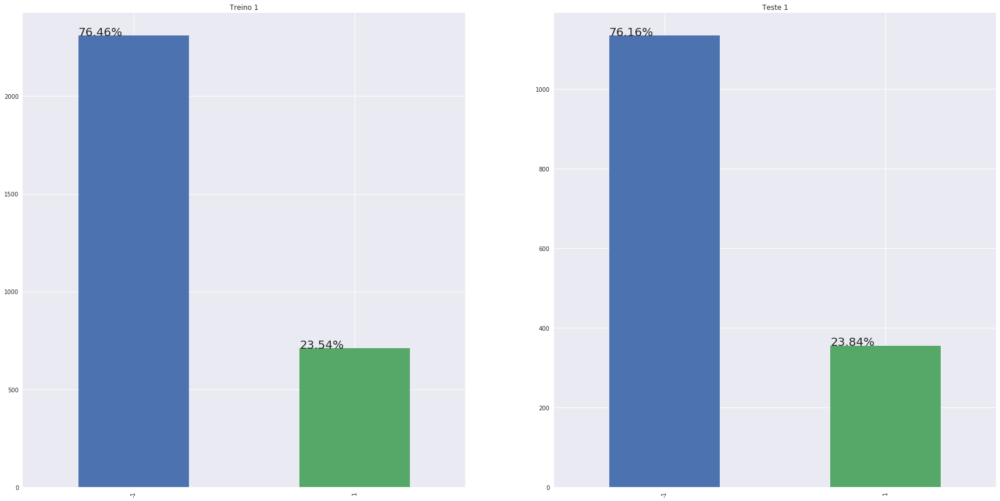

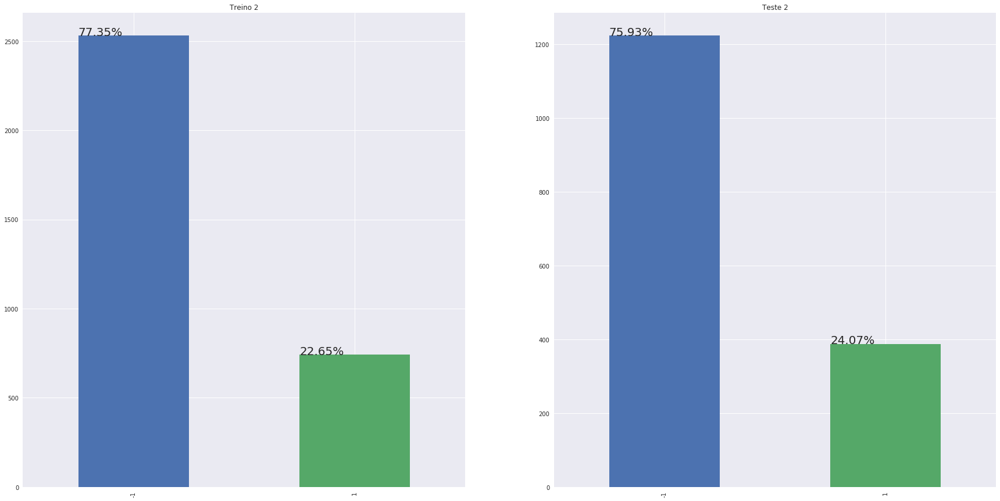

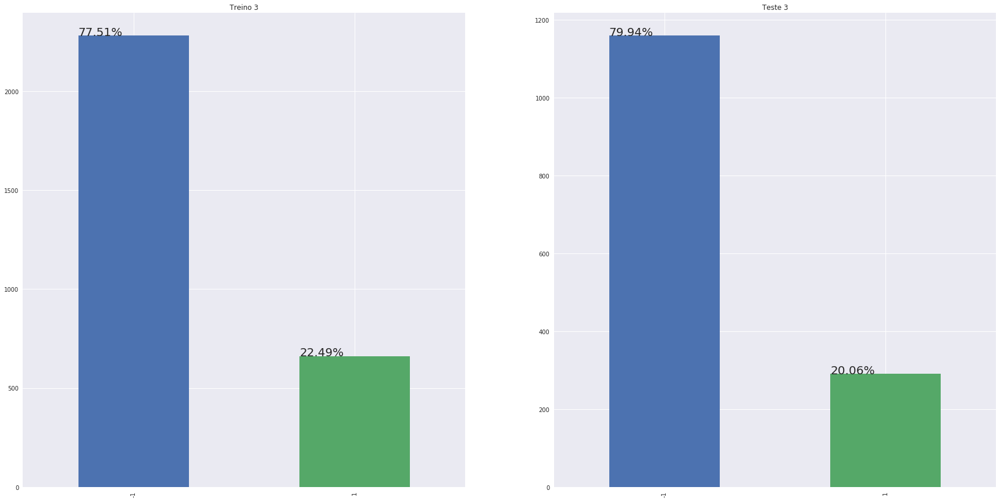

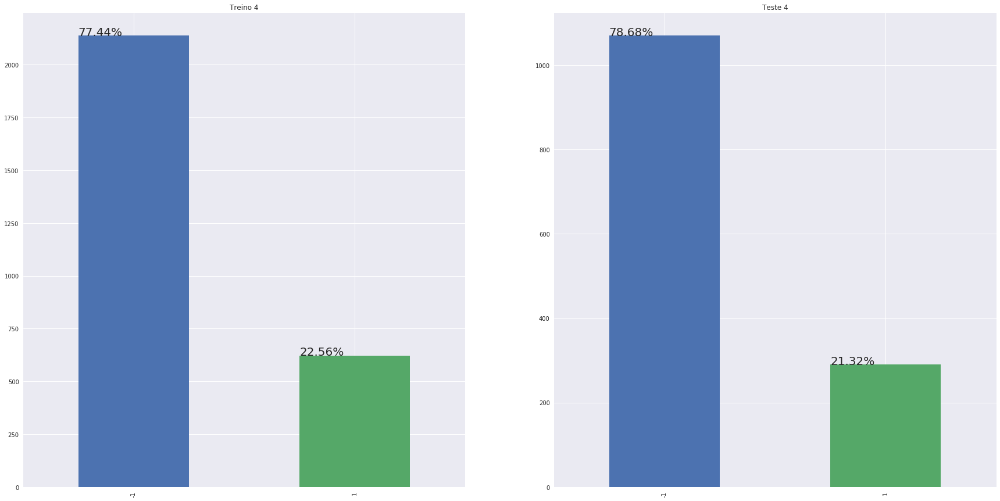

In [3]:
# Checando a distribuição dos targets em cada conjunto (treino e teste) de cada abordagem

sns.set(style='darkgrid')
temp_train = [train_target_1, train_target_2, train_target_3, train_target_4]
temp_test = [test_target_1, test_target_2, test_target_3, test_target_4]

for i in range(4):
    
    fig = plt.figure(figsize=(30,15))

    plt.subplot(121)
    ax = temp_train[i].value_counts().plot.bar()
    for patch in ax.patches:
#         ax.text(patch.get_x(), patch.get_height(), str(int(patch.get_height())),fontsize=20)
        ax.text(patch.get_x(), patch.get_height(), "{:.2f}%".format((int(patch.get_height())/temp_train[i].shape[0]*100)),fontsize=20)
    plt.title('Treino ' + str(i+1))
#     plt.show()

#     fig = plt.figure(figsize=(30,15))
    
    plt.subplot(122)
    ax = temp_test[i].value_counts().plot.bar()
    for patch in ax.patches:
#         ax.text(patch.get_x(), patch.get_height(), str(int(patch.get_height())),fontsize=20)
        ax.text(patch.get_x(), patch.get_height(), "{:.2f}%".format((int(patch.get_height())/temp_test[i].shape[0]*100)),fontsize=20)
    plt.title('Teste ' + str(i+1))
#     plt.show()

temp_train_b = [train_target_b_1, train_target_b_2, train_target_b_3, train_target_b_4]
temp_test_b = [test_target_b_1, test_target_b_2, test_target_b_3, test_target_b_4]

for i in range(4):
    
    fig = plt.figure(figsize=(30,15))

    plt.subplot(121)
    ax = temp_train_b[i].value_counts().plot.bar()
    for patch in ax.patches:
#         ax.text(patch.get_x(), patch.get_height(), str(int(patch.get_height())),fontsize=20)
        ax.text(patch.get_x(), patch.get_height(), "{:.2f}%".format((int(patch.get_height())/temp_train_b[i].shape[0]*100)),fontsize=20)
    plt.title('Treino ' + str(i+1))
#     plt.show()

#     fig = plt.figure(figsize=(30,15))
    
    plt.subplot(122)
    ax = temp_test_b[i].value_counts().plot.bar()
    for patch in ax.patches:
#         ax.text(patch.get_x(), patch.get_height(), str(int(patch.get_height())),fontsize=20)
        ax.text(patch.get_x(), patch.get_height(), "{:.2f}%".format((int(patch.get_height())/temp_test_b[i].shape[0]*100)),fontsize=20)
    plt.title('Teste ' + str(i+1))
#     plt.show()

In [4]:
# Importando módulos da árvore de decisão

from sklearn.tree import DecisionTreeClassifier # Árvore de decisão
from sklearn.tree import export_graphviz # Utilitário para visualizar a árvore treinada

# Definindo os parâmetros do modelo e possíveis valores

max_max_depth_parameter = 102
min_max_depth_parameter = 2

param_grid = {'criterion': list(['gini', 'entropy']), 
              'max_depth': list(range(min_max_depth_parameter,max_max_depth_parameter+1))}

dt = DecisionTreeClassifier(class_weight=None)

# dt_desbalanceado = DecisionTreeClassifier(class_weight=None) # Não balanceando as classes
# dt_balanceado = DecisionTreeClassifier(class_weight='balanced') # Balanceando as classes

# Validação cruzada com cada conjunto de parâmetros

clf = GridSearchCV(dt,param_grid,return_train_score=True,cv=10,
                  scoring = ['accuracy', 'precision', 'recall', 'roc_auc', 'f1', 'average_precision'], refit=False)

# clf_desbalanceado = GridSearchCV(dt_desbalanceado,param_grid,return_train_score=True,cv=10, 
#                    scoring = ['accuracy', 'precision', 'recall', 'roc_auc', 'f1', 'average_precision'], refit=False)

# clf_balanceado = GridSearchCV(dt_balanceado,param_grid,return_train_score=True,cv=10, 
#                    scoring = ['accuracy', 'precision', 'recall', 'roc_auc', 'f1', 'average_precision'], refit=False)

Para as árvores de decisão treinadas, foram considerados dois parâmetros: o critério de divisão ('gini' ou 'entropia') e o número máximo de níveis (profundidade) da árvore. Este último parâmetro serve para limitar que a árvore cresça indefinidamente e o problema de overfitting seja evitado (esse problema será discutido mais adiante). De certa forma, limitar o número máximo de níveis é uma espécie de esquema de "pré-poda" da árvore, em que o tratamento para evitar overfitting é feito durante a geração da árvore. Nos casos de "pós-poda" (não utilizados nessa implementação), a árvore primeiro é gerada, sem restrição de níveis, e, sem seguida, ramos vão sendo cortados segundo algum critério.

#### Treinamento

In [5]:
# Descomentar somente se for necessário retreinar a árvore

# Abordagem 1: Retirar os valores faltantes e manter outliers

path_arquivos = 'Classificadores/Arvores-decisao/'

clf.fit(pd.get_dummies(train_data_1), train_target_1) # Classes desbalanceadas
joblib.dump(clf, 
            path_arquivos+'arvores-abordagem-1-desbalanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl') # Salvando os resultados da validação cruzada

clf.fit(train_data_b_1, train_target_b_1) # Classes balanceadas
joblib.dump(clf, 
            path_arquivos+'arvores-abordagem-1-balanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl') # Salvando os resultados da validação cruzada


# clf_desbalanceado.fit(pd.get_dummies(train_data_1), train_target_1)
# clf_balanceado.fit(pd.get_dummies(train_data_1), train_target_1)

# Salvando os resultados da validação cruzada

# path_arquivos = 'Classificadores/Arvores-decisao/'

# joblib.dump(clf_desbalanceado, path_arquivos+'arvores-abordagem-1-desbalanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl')
# joblib.dump(clf_balanceado, path_arquivos+'arvores-abordagem-1-balanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl')

['Classificadores/Arvores-decisao/arvores-abordagem-1-balanceado-dataset-10pct.pkl']

A seguir, será feita uma breve análise do desempenho de diferentes árvores de decisão (obtidas com diferentes conjuntos de parâmetros), considerando o caso em que as classes estão não-balanceadas e balanceadas. O balanceamento é feito adotando pesos diferentes para cada classe. Aspectos, como overfitting, também serão analisados.

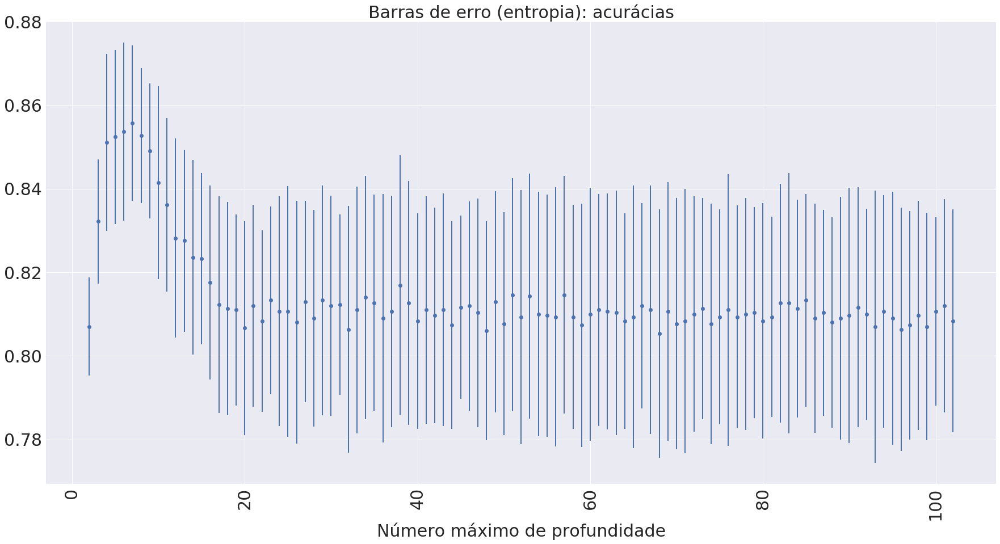

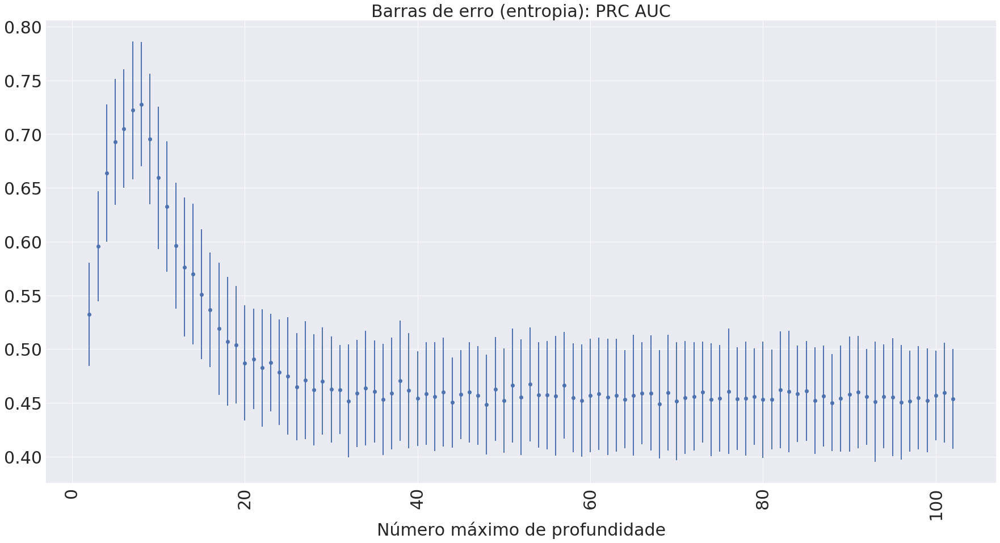

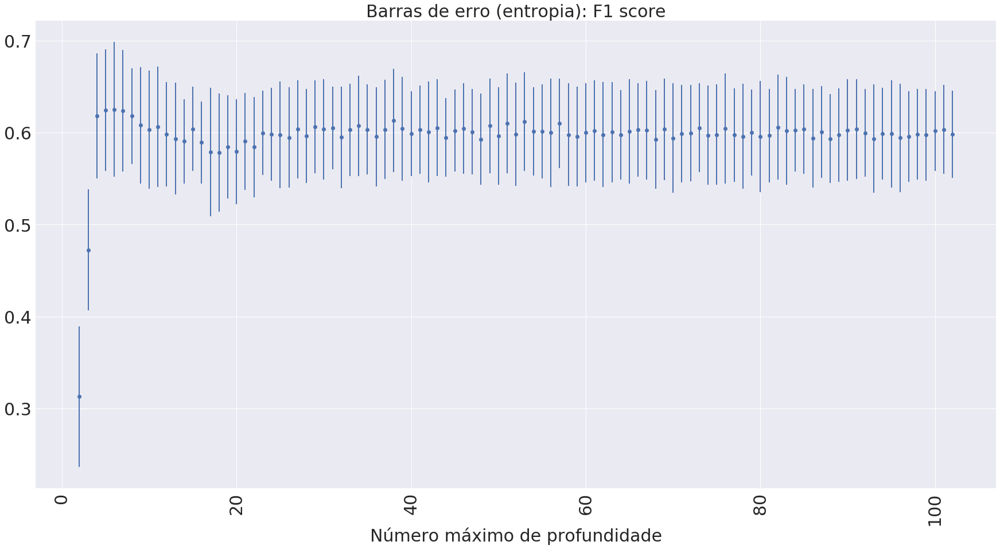

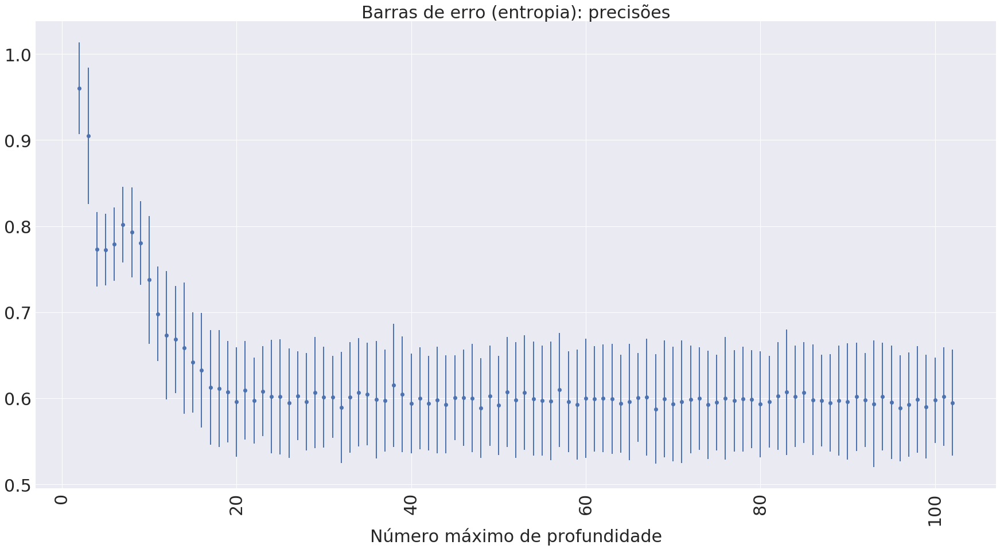

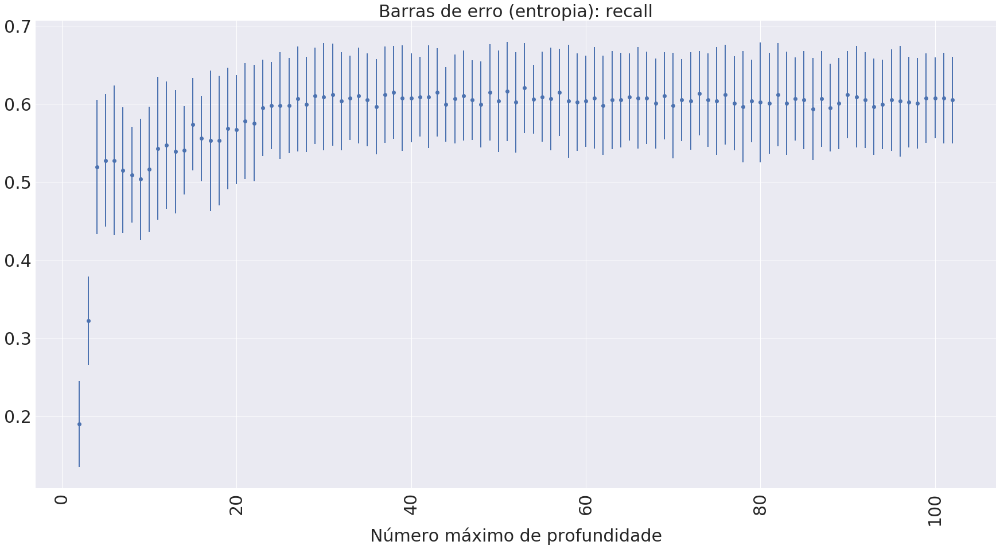

...

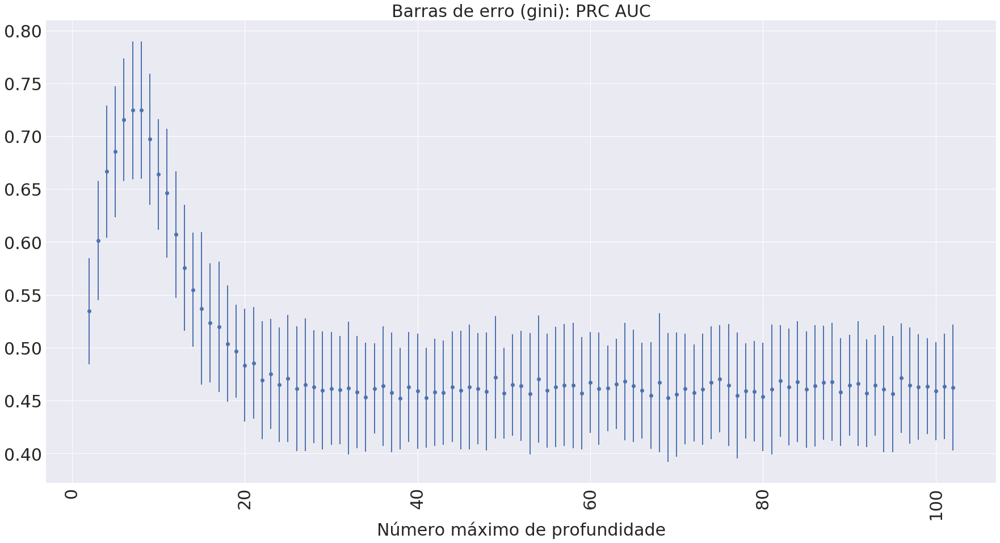

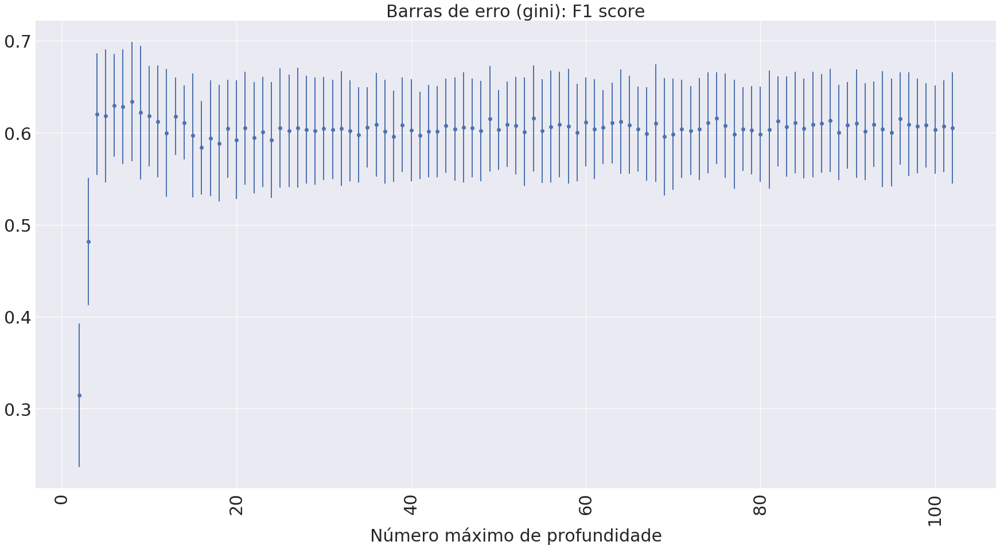

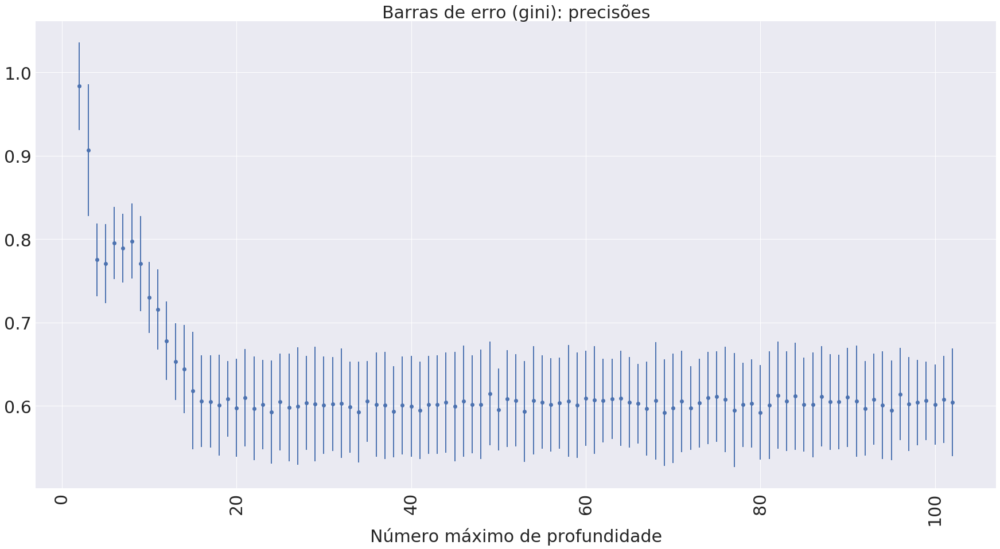

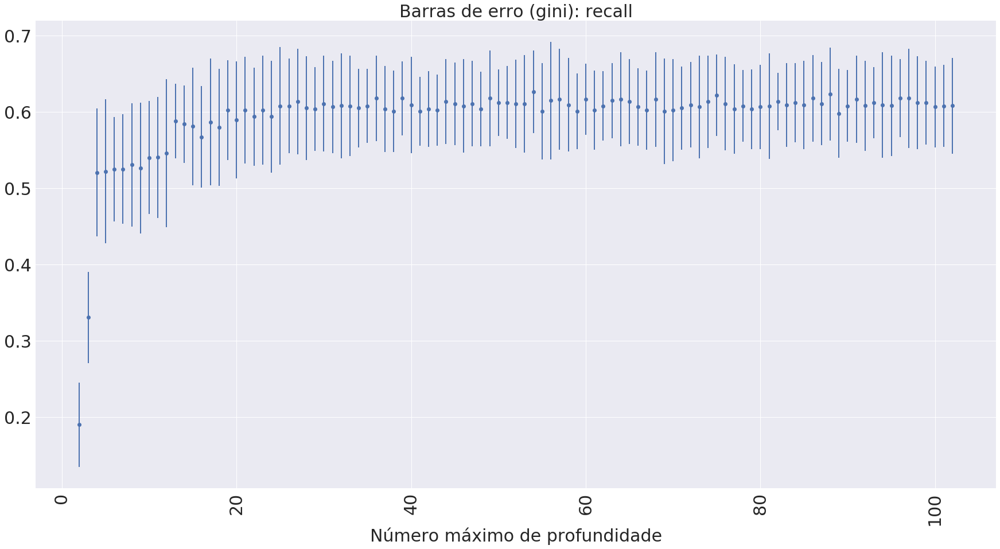

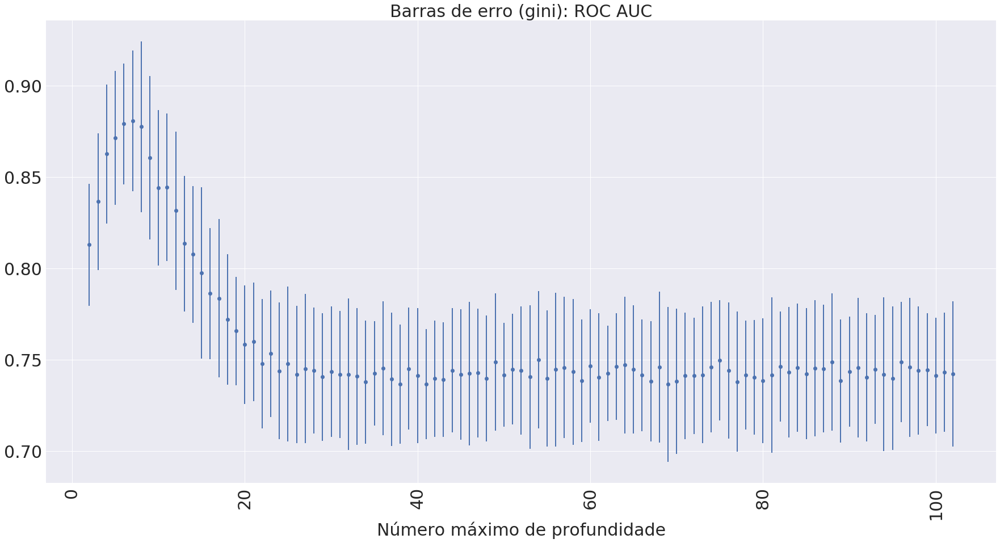

In [6]:
path_arquivos = 'Classificadores/Arvores-decisao/'

clf_desbalanceado = joblib.load(path_arquivos+'arvores-abordagem-1-desbalanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl')

results = pd.DataFrame(clf_desbalanceado.cv_results_)
# results['param_criterion'].head()
results.sort_values(by=['param_criterion','param_max_depth'], axis=0, inplace=True)
# results['param_criterion'].head()
results_test = results.loc[:, 'split0_test_accuracy':'split9_train_roc_auc']
results_train = results_test.filter(regex=(".*train.*"))
results_test.drop(columns=results_train.columns,inplace=True)

# for col in results.columns:
#     print(col)

lista_metricas = [('accuracy', 'acurácias'), ('average_precision', 'PRC AUC'), ('f1', 'F1 score'), ('precision', 'precisões'), ('recall', 'recall'), ('roc_auc', 'ROC AUC')]

# Plot das barras de erro

n_max_depths = np.arange(min_max_depth_parameter,max_max_depth_parameter+1) 

for criterio in ['entropia','gini']:
    
    if criterio == 'entropia':
        range_cols = list(range(0,int(results_test.shape[0]/2)))
    elif criterio == 'gini':
        range_cols = list(range(int(results_test.shape[0]/2),results_test.shape[0]))

    for metrica in lista_metricas:

        results_test_filtered = results_test.filter(regex='.*_test_'+str(metrica[0])).transpose()
        
        results_test_filtered = results_test_filtered.iloc[:, range_cols]

        fig = plt.figure(figsize=(30,15))

        plt.errorbar(n_max_depths, results_test_filtered.mean(), yerr=results_test_filtered.std(), fmt='o', lw=2)
        plt.title('Barras de erro (' + criterio + '): ' + metrica[1], fontsize=30)
        plt.xlabel('Número máximo de profundidade', fontsize=30)
        plt.xticks(fontsize=30, rotation=90)
        plt.yticks(fontsize=30)
        plt.show()

# Boxplots

# for criterio in ['entropia','gini']:
    
#     if criterio == 'entropia':
#         range_cols = list(range(0,int(results_test.shape[0]/2)))
#     elif criterio == 'gini':
#         range_cols = list(range(int(results_test.shape[0]/2),results_test.shape[0]))

#     for metrica in lista_metricas:

#         results_test_filtered = results_test.filter(regex='.*_test_'+str(metrica[0])).transpose()
        
#         results_test_filtered = results_test_filtered.iloc[:, range_cols]

#         fig = plt.figure(figsize=(30,15))
        
#         results_test_filtered.boxplot()
        
#         plt.title('Boxplot (' + criterio + '): ' + metrica[1], fontsize=30)
#         plt.xticks(np.arange(1, len(n_max_depths)+1), np.arange(min_max_depth_parameter,max_max_depth_parameter+1),
#                    fontsize=20, rotation=90)
#         plt.xlabel('Número máximo de profundidade', fontsize=30)
#         plt.yticks(fontsize=30)
#         plt.show()

Pode-se perceber que, tanto o critério de divisão de gini quanto o de entropia apresentam resultados semelhantes. Além disso, observa-se, nos gráficos, o efeito de overfitting. No começo, poucos níveis fazem com que a acurácia da árvore seja ruim. Existe um ponto "ótimo", no qual a acurácia atinge o máximo, e depois começa a decrescer novamente. No momento em que isso acontece, a árvore está sofrendo overfitting, ou seja, ela se sai muito bem no conjunto de treino, mas quando é usada para classificar exemplos fora do conjunto de treinamento, começa a errar mais.

Outro fato interessante a se observar é que, a partir de um determinado número de níveis, a acurácia (e as outras métricas de recall, precisão e roc auc) começa a estabilizar. Isso ocorre, porque, embora o número máximo de níveis esteja aumentando, a árvore já esgotou todos os níveis possíveis (isto é, ela não cresce mais). Por isso, aumentar o número máximo de níveis, nesse caso, não influencia nos valores das métricas resultantes. O motivo de haver uma variação nos resultados da métrica conforme o número máximo de níveis aumenta é porque mais de uma árvore de decisão atende ao problema de classificação (não existe uma árvore única). Dessa forma, cada árvore gerada possui um erro e desvio-padrão associados, mas vemos que esses erros e desvios-padrão são próximos, mostrando que elas apresentam um desempenho semelhante. Portanto, nessa região em que os resultados das métricas estabilizam, o que está sendo observado, na realidade, é o efeito de várias árvores diferentes sendo treinadas (provavelmente com o mesmo número de níveis), e não uma influência do número máximo de níveis.

Por conta do desbalanceamento entre as classes, a árvore tende a favorecer a classe mais frequente. Por consequência disso, ela erra muitos exemplos da classe menos frequente. Isso pode ser observado na métrica de recall, que é mais baixa do que a acurácia. Note, também, que a métrica de recall é menos afetada pelo overfitting nesse caso, ao contrário das outras. Isso decorre do desbalanceamento de classes. Quanto mais níveis, a tendência é que mais regras (pouco precisas) que classifiquem as como pertencentes à classe mais frequente sejam geradas. Como essas regras não devem dizer respeito à classe minoritária, elas não pioram ou melhoram o desempenho do classificador para tais instâncias dessa classe. Já para a classe majoritária, tais regras imprecisas farão com que o classificador erre mais suas classificações para tais amostras. Isso pode, por exemplo, ser concluído observando os resultados da métrica roc auc. A taxa de falso positivos, ou seja, de instâncias negativas classificadas como positivas, começa a crescer, diminuindo, assim, o valor dessa métrica.

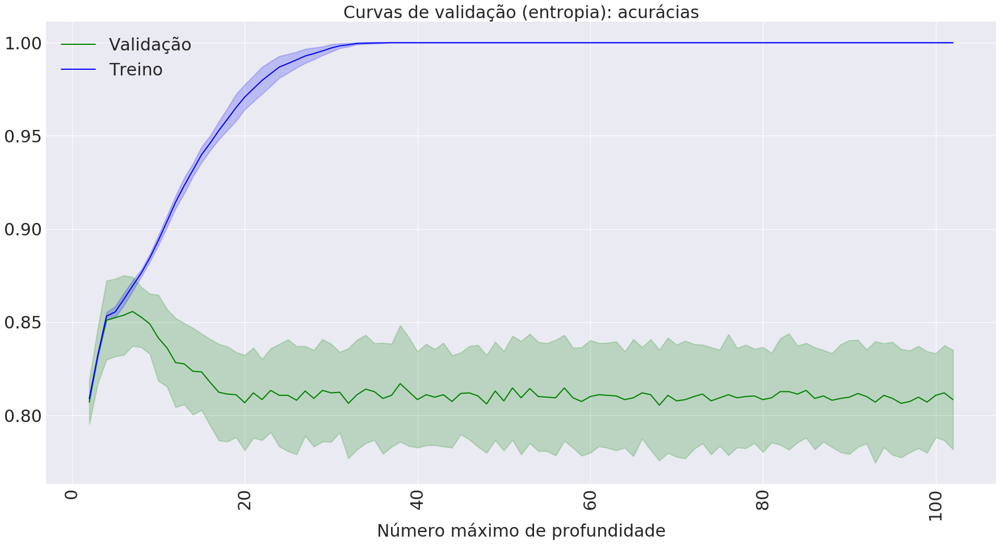

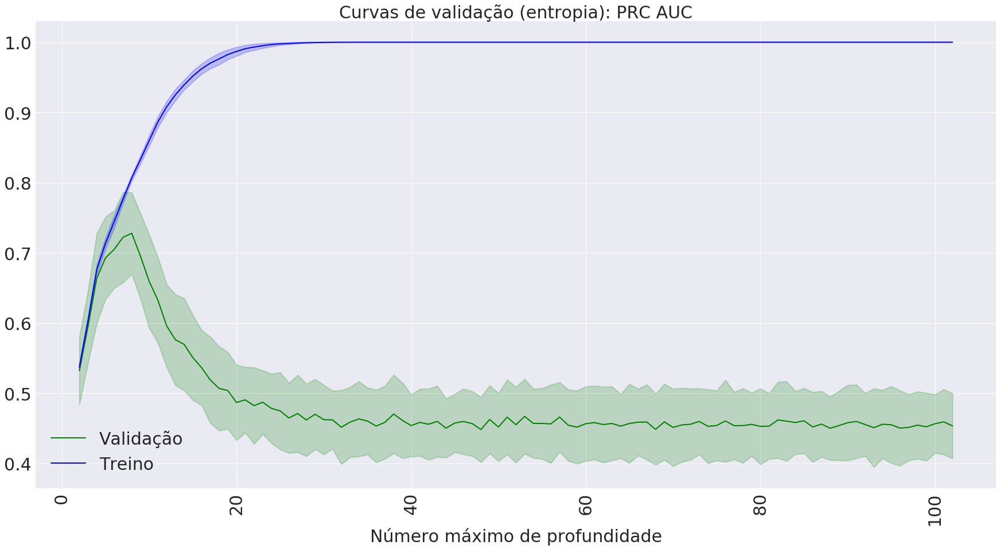

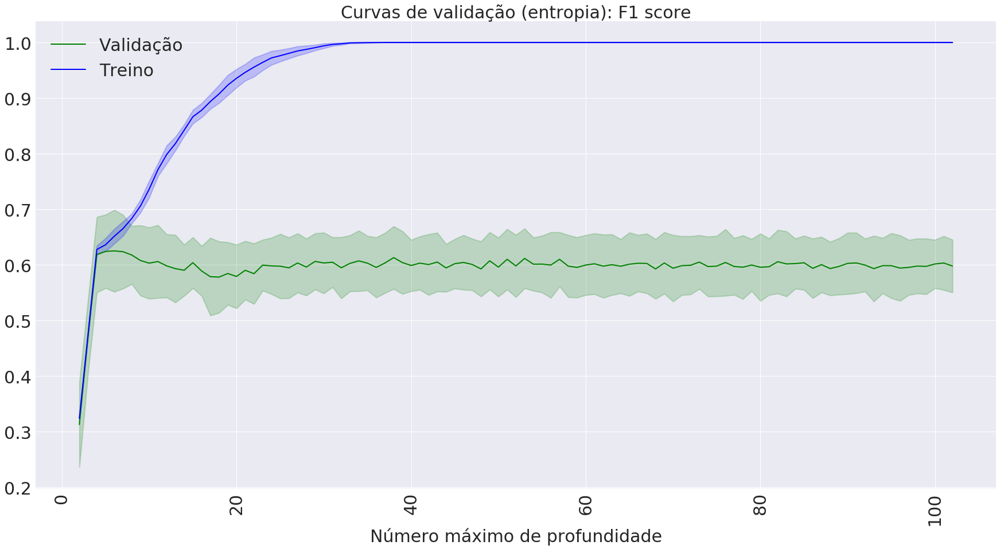

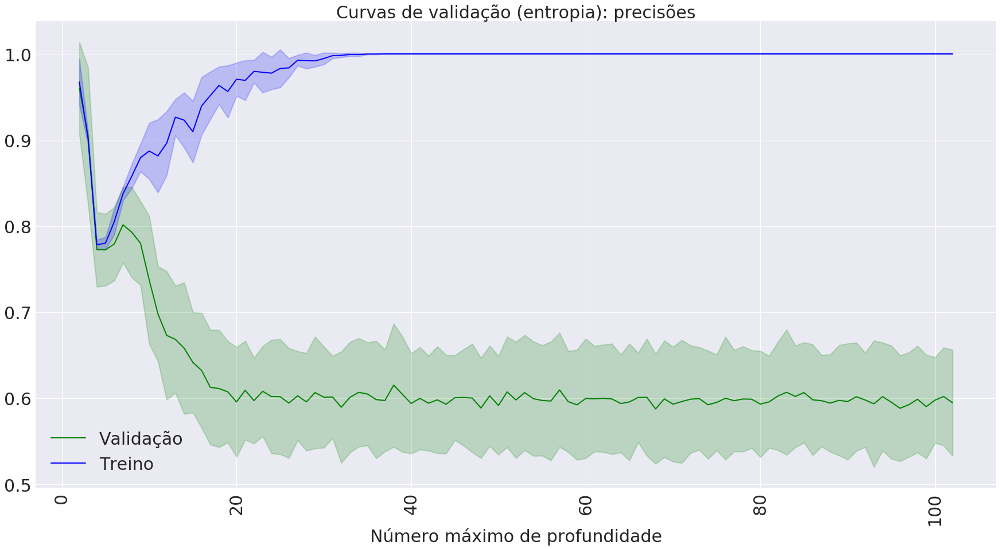

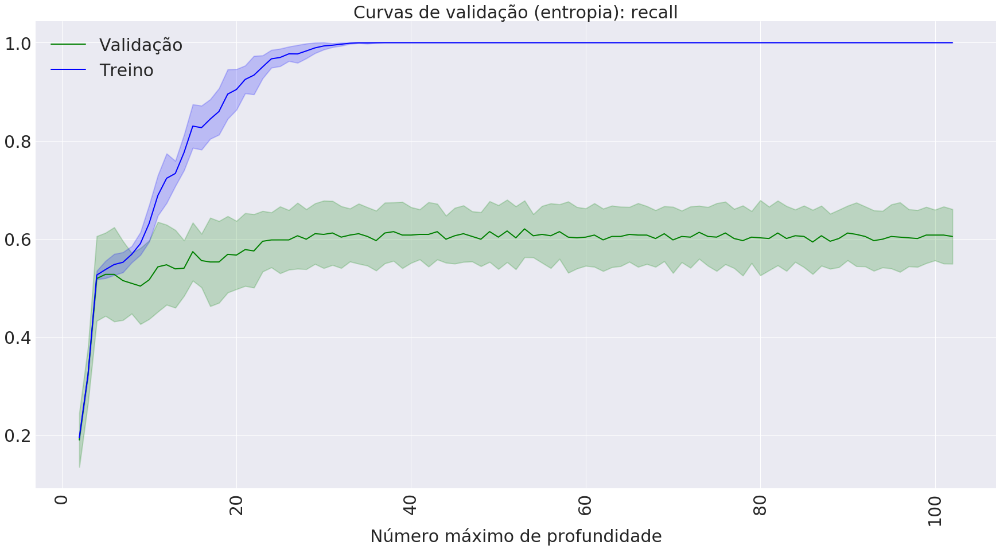

...

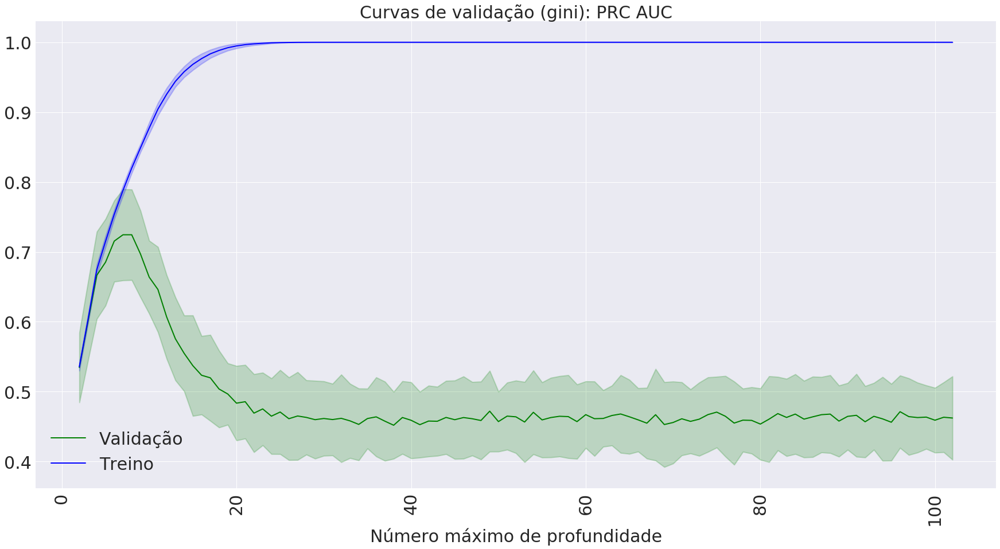

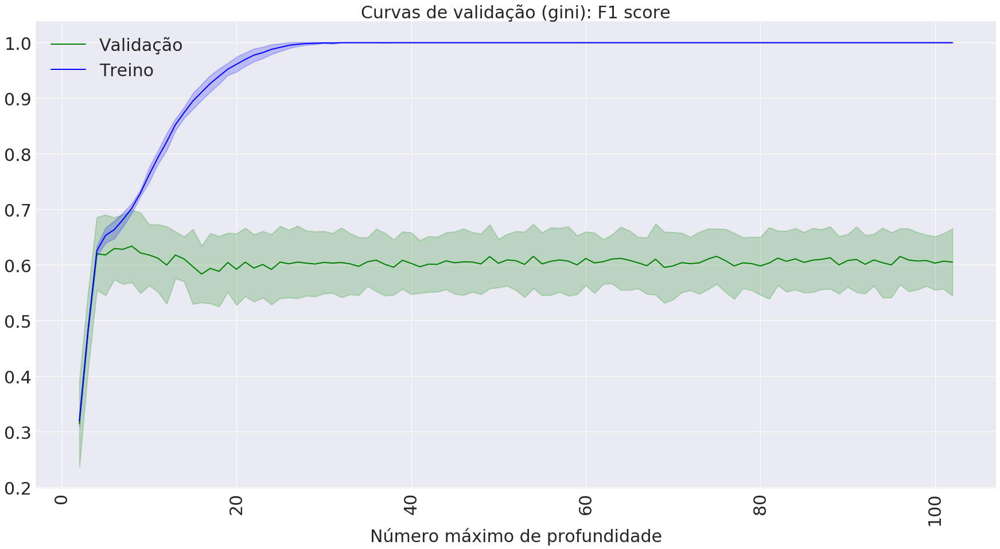

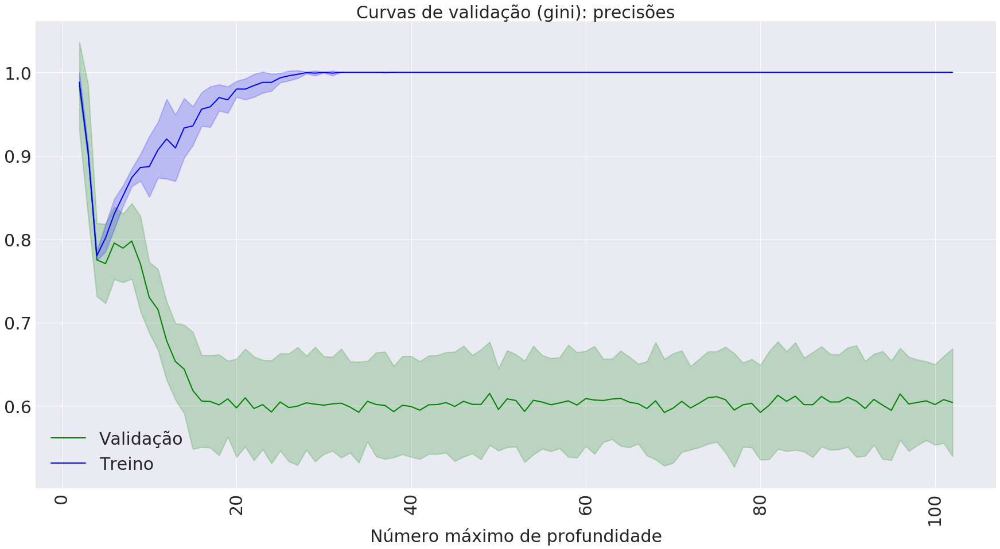

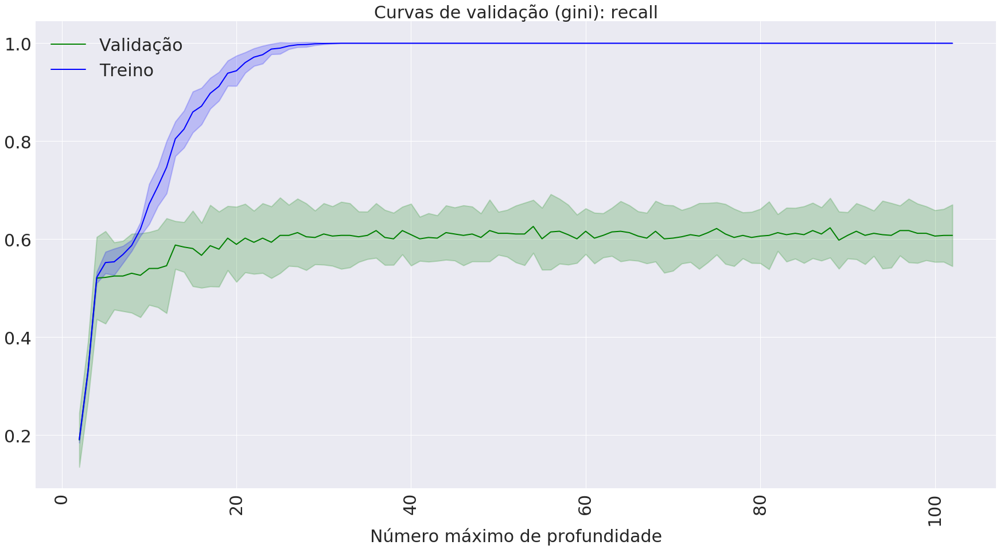

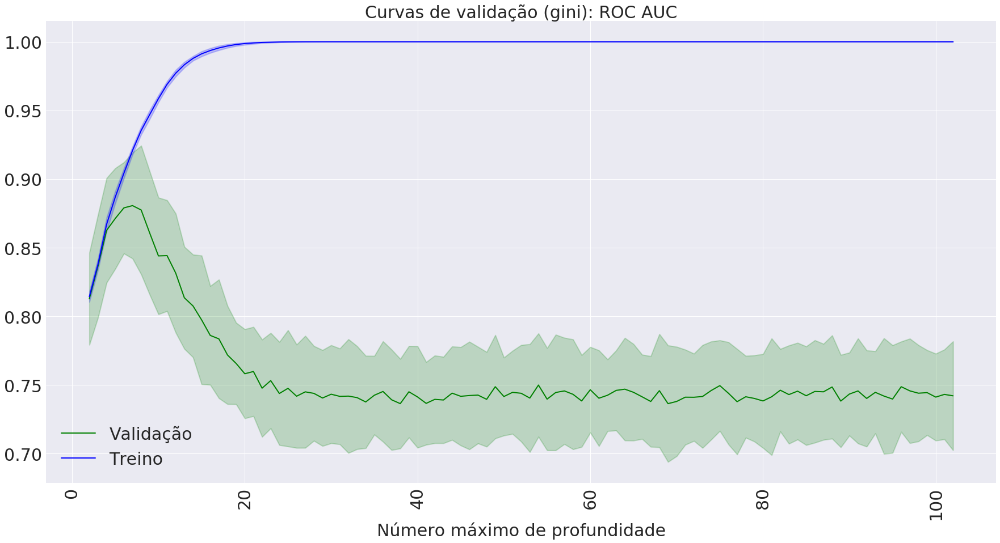

In [7]:
n_max_depths = np.arange(min_max_depth_parameter,max_max_depth_parameter+1) 

for criterio in ['entropia', 'gini']:
    
    if criterio == 'entropia':
        range_cols = list(range(0,int(results_test.shape[0]/2)))
    elif criterio == 'gini':
        range_cols = list(range(int(results_test.shape[0]/2),results_test.shape[0]))
    
    for metrica in lista_metricas:

        results_test_filtered = results_test.filter(regex='.*_test_' + str(metrica[0])).transpose()
        results_train_filtered = results_train.filter(regex='.*_train_' + str(metrica[0])).transpose()

#         results_test_filtered = results_test_filtered.iloc[:, 0:int((results_test_filtered.shape[1]/2))]
#         results_train_filtered = results_train_filtered.iloc[:, 0:int((results_train_filtered.shape[1]/2))]

        results_test_filtered = results_test_filtered.iloc[:, range_cols]
        results_train_filtered = results_train_filtered.iloc[:, range_cols]

        fig = plt.figure(figsize=(30,15))
        plt.plot(n_max_depths, results_test_filtered.mean(), label='Validação', color='green', lw=2)
        plt.fill_between(n_max_depths, results_test_filtered.mean() - results_test_filtered.std(),
                     results_test_filtered.mean() + results_test_filtered.std(), alpha=0.2, color='green', lw=2)

        plt.plot(n_max_depths, results_train_filtered.mean(), label='Treino', color='blue', lw=2)
        plt.fill_between(n_max_depths, results_train_filtered.mean() - results_train_filtered.std(),
                     results_train_filtered.mean() + results_train_filtered.std(), alpha=0.2, color='blue', lw=2)
        plt.title('Curvas de validação ('+ criterio + '): '+ metrica[1], fontsize=30)
        plt.xticks(fontsize=30, rotation=90)
        plt.xlabel('Número máximo de profundidade', fontsize=30)
        plt.yticks(fontsize=30)
        plt.legend(loc='best', fontsize=30)
        plt.show()

Os gráficos anteriores são outra ilustração do problema de overfitting. Estão exibidos os resultados de treino e teste (validação) da acurácia do classificador em cada divisão da validação cruzada (em cada partição do k-fold, onde k = 10). Para a curva de treino, vemos que ela sempre é crescente, conforme o número de níveis aumenta. Cada vez mais, a árvore vai se especializando no conjunto de treino em questão, garantindo uma maior acurácia. Ao observarmos a curva de teste, no entanto, vemos que a partir de um determinado número de níveis (algo em torno de 10 a 15 níveis), o desempenho do classificador começa a piorar. Isso se dá por conta do overfitting. Note, também, que a partir de um determinado número de níveis, o erro de teste estabiliza. Isso é uma consequência de árvores diferentes (que alcançaram o máximo número de níveis para o dataset em questão) estarem sendo geradas. Como todas as árvores, nessa situação, já apresentam o mesmo número de níveis, aumentar o número máximo de níveis não altera o desempenho do classificador.

In [8]:
# Treinando a árvore final

path_arquivos = 'Classificadores/Arvores-decisao/'

dt_final_desbalanceado = DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=8)
dt_final_desbalanceado.fit(pd.get_dummies(train_data_1), train_target_1)
joblib.dump(dt_final_desbalanceado, 
            path_arquivos+'arvore-final-abordagem-1-desbalanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl') # Salvando a árvore final

['Classificadores/Arvores-decisao/arvore-final-abordagem-1-desbalanceado-dataset-10pct.pkl']

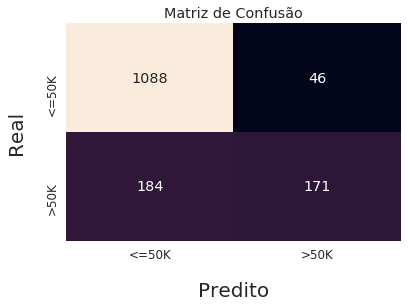

Acurácia: 84.553 %
Precisão: 78.802 %
Recall: 48.169 %
ROC AUC: 72.056 %
PRC AUC: 50.315 %


In [9]:
dt_final_desbalanceado = joblib.load(path_arquivos+'arvore-final-abordagem-1-desbalanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl')

exibir_resultados_finais(clf=dt_final_desbalanceado, 
                         test_data=pd.get_dummies(test_data_1), 
                         test_target=test_target_1, 
                         id_abordagem=1, 
                         str_balanceamento='desbalanceado', 
                         fracao_dataset=0.1,
                         path_arquivos=path_arquivos,
                         tipo_classificador='arvore')

In [10]:
# # Classificando o conjunto de teste

# predicoes = dt_final_desbalanceado.predict(pd.get_dummies(test_data_1))

# # Salvando a árvore treinada graficamente

# path_arquivos = 'Classificadores/Arvores-decisao/'

# export_graphviz(dt_final_desbalanceado, 
#                 out_file=path_arquivos+'arvore-final-abordagem-1-desbalanceado-dataset-'+str(int(fracao_dataset*100))+'pct.dot', 
#                 feature_names=pd.get_dummies(test_data_1).columns,  
#                 class_names=['Less than or equal to', 'More than'],  
#                 filled=True, rounded=True,  
#                 special_characters=True)  

# # Avaliando o desempenho

# # Matriz de confusão

# cfs_mtx = confusion_matrix(test_target_1, predicoes)

# sns.set(font_scale=1.2)
# ax = sns.heatmap(cfs_mtx, 
#                  xticklabels=['<=50K', '>50K'], 
#                  yticklabels=['<=50K', '>50K'], 
#                  annot=cfs_mtx,
#                  fmt='d',
#                  cbar=None)

# ax.set_xlabel('Predito', labelpad=20, fontsize=20)
# ax.set_ylabel('Real', labelpad=20, fontsize=20)
# ax.set_title('Matriz de Confusão')
    
# # plot_confusion_matrix(cfs_mtx, ['<=50K', '>50K'], normalize=False)
# plt.show()

# acc = accuracy_score(test_target_1, predicoes)
# pre = precision_score(test_target_1, predicoes)
# rec = recall_score(test_target_1, predicoes)
# roc_auc = roc_auc_score(test_target_1, predicoes)
# prc_auc = average_precision_score(test_target_1, predicoes)

# print('Acurácia: %.3f %%' % (acc*100))
# print('Precisão: %.3f %%' % (pre*100))
# print('Recall: %.3f %%' % (rec*100))
# print('ROC AUC: %.3f %%' % (roc_auc*100))
# print('PRC AUC: %.3f %%' % (prc_auc*100))

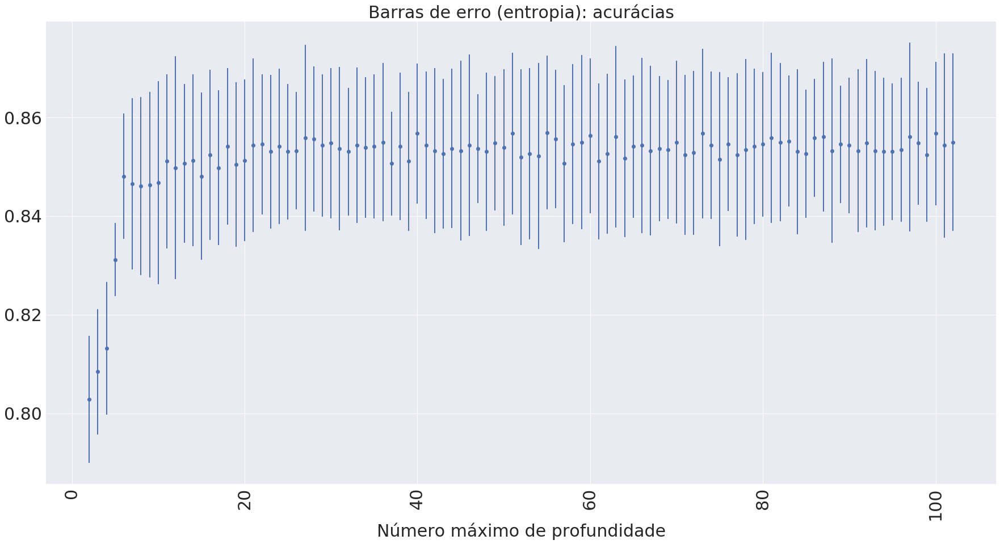

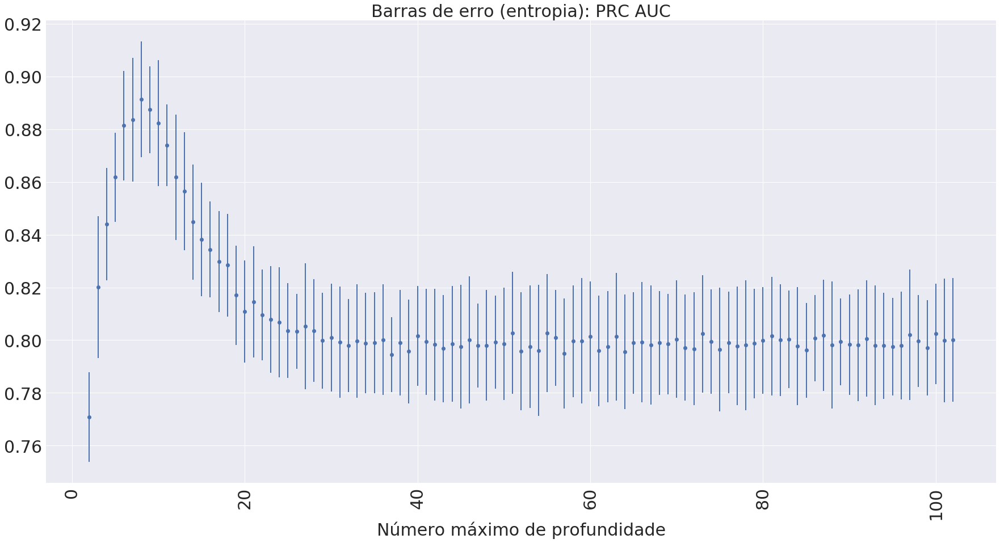

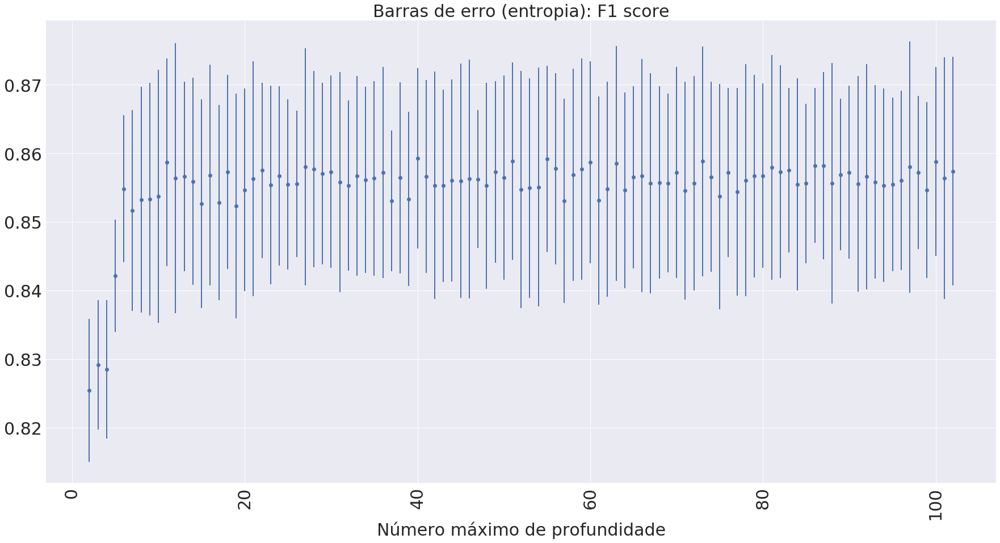

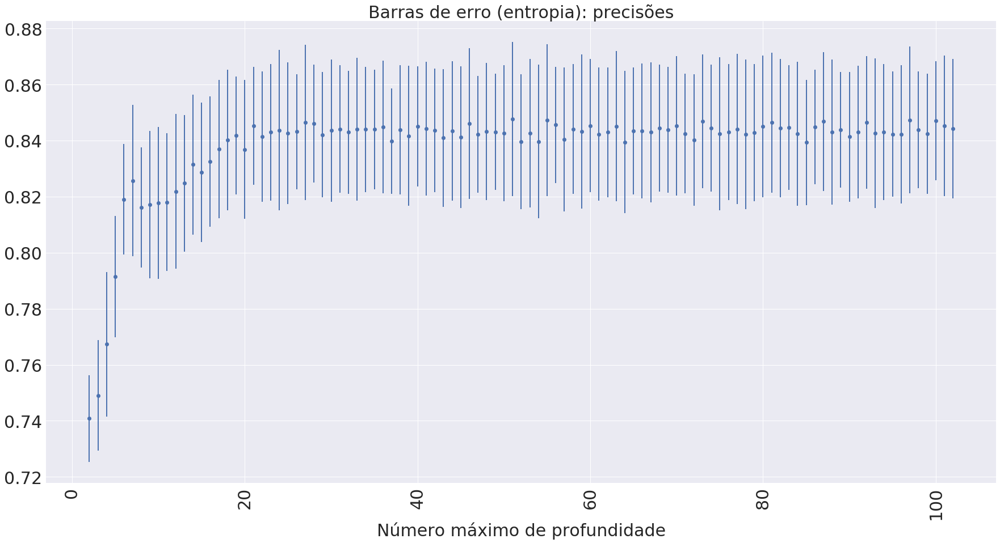

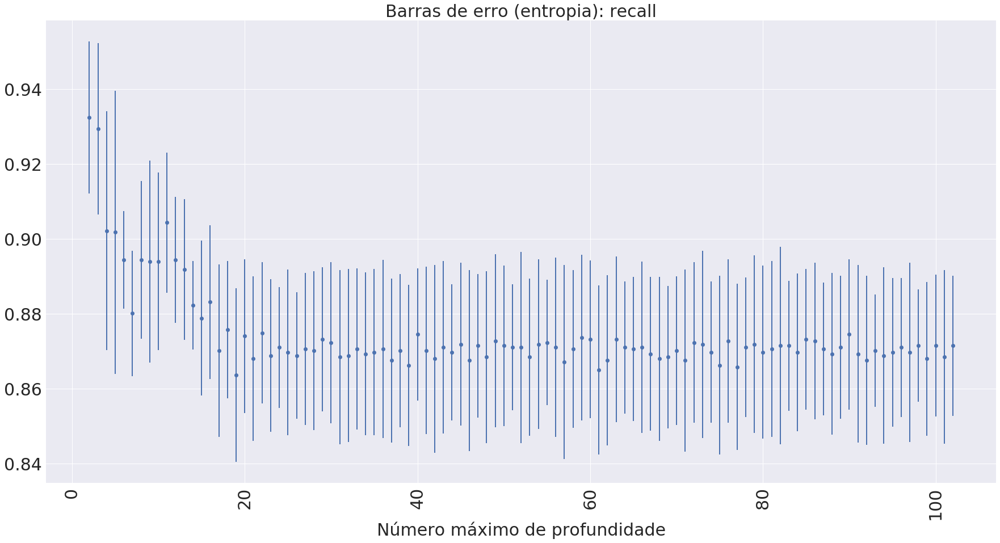

...

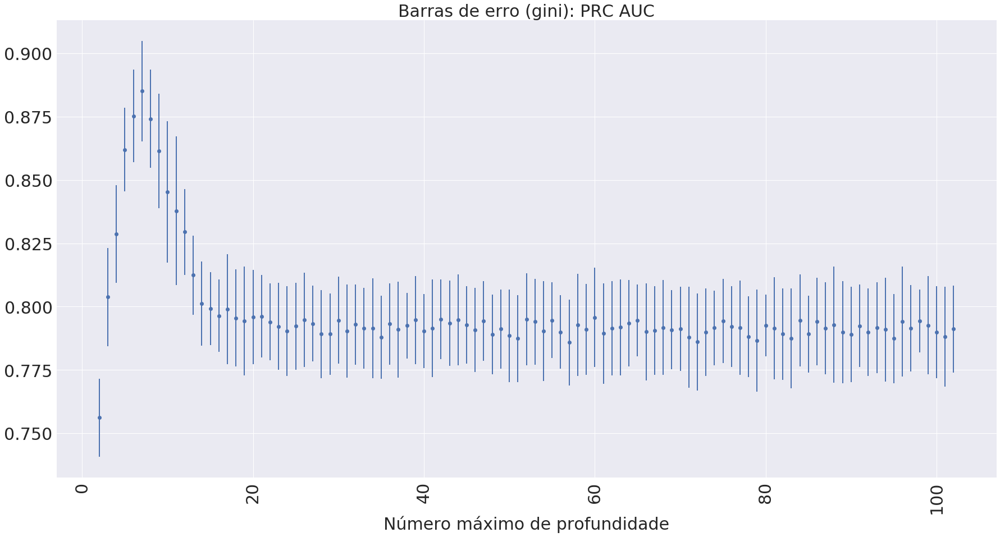

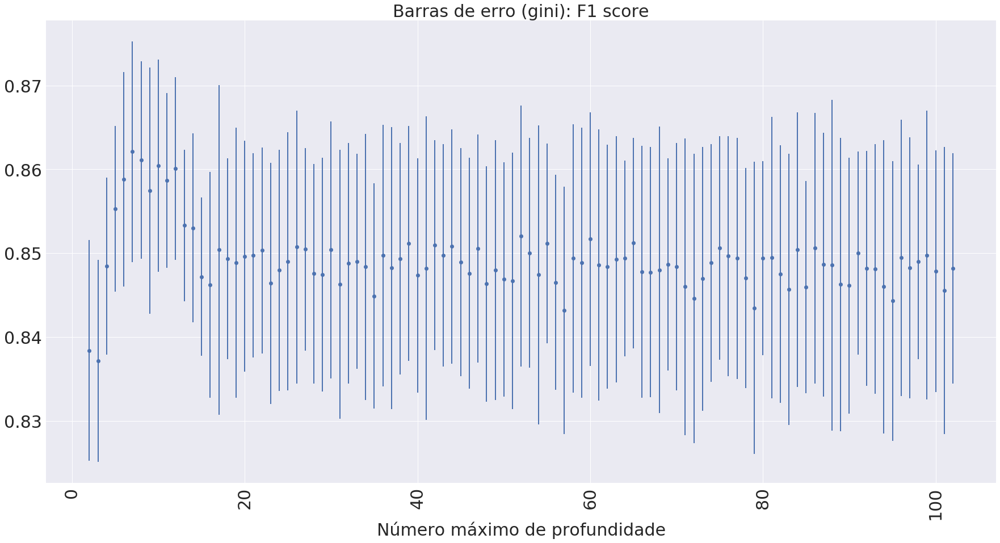

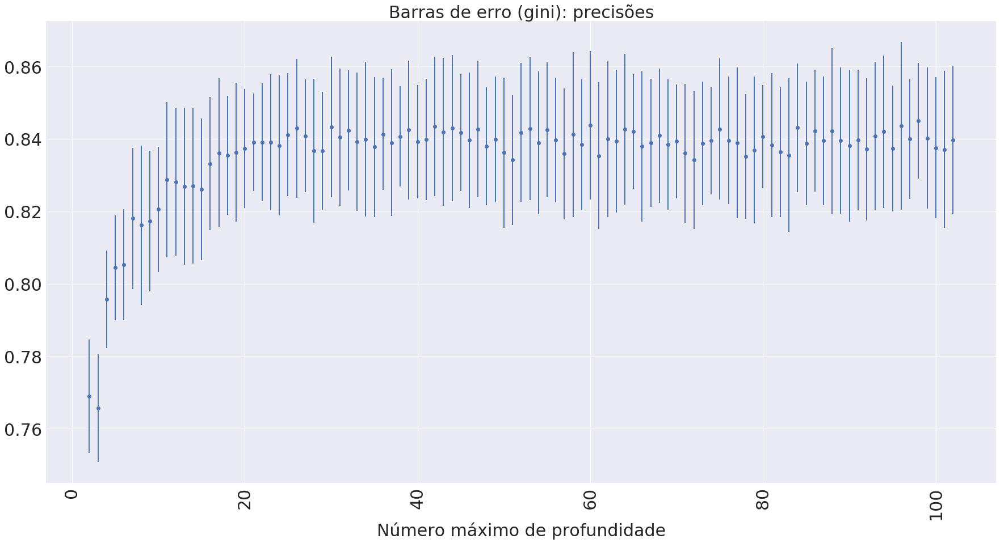

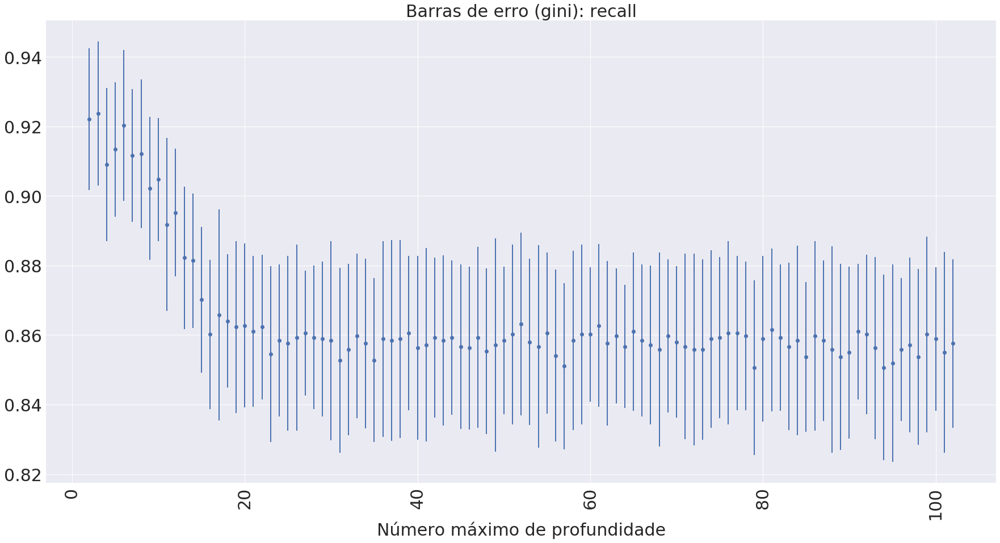

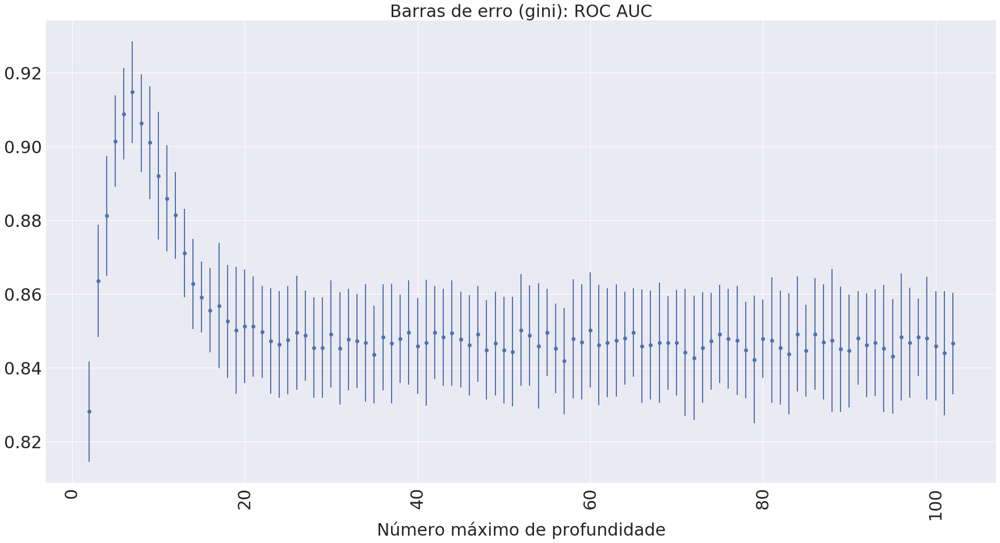

In [11]:
path_arquivos = 'Classificadores/Arvores-decisao/'

clf_balanceado = joblib.load(path_arquivos+'arvores-abordagem-1-balanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl')

results = pd.DataFrame(clf_balanceado.cv_results_)
# results['param_criterion'].head()
results.sort_values(by=['param_criterion','param_max_depth'], axis=0, inplace=True)
# results['param_criterion'].head()
results_test = results.loc[:, 'split0_test_accuracy':'split9_train_roc_auc']
results_train = results_test.filter(regex=(".*train.*"))
results_test.drop(columns=results_train.columns,inplace=True)

# for col in results.columns:
#     print(col)

lista_metricas = [('accuracy', 'acurácias'), ('average_precision', 'PRC AUC'), ('f1', 'F1 score'), ('precision', 'precisões'), ('recall', 'recall'), ('roc_auc', 'ROC AUC')]

# Plot das barras de erro

n_max_depths = np.arange(min_max_depth_parameter,max_max_depth_parameter+1) 

for criterio in ['entropia','gini']:
    
    if criterio == 'entropia':
        range_cols = list(range(0,int(results_test.shape[0]/2)))
    elif criterio == 'gini':
        range_cols = list(range(int(results_test.shape[0]/2),results_test.shape[0]))

    for metrica in lista_metricas:

        results_test_filtered = results_test.filter(regex='.*_test_'+str(metrica[0])).transpose()
        
        results_test_filtered = results_test_filtered.iloc[:, range_cols]

        fig = plt.figure(figsize=(30,15))

        plt.errorbar(n_max_depths, results_test_filtered.mean(), yerr=results_test_filtered.std(), fmt='o', lw=2)
        plt.title('Barras de erro (' + criterio + '): ' + metrica[1], fontsize=30)
        plt.xlabel('Número máximo de profundidade', fontsize=30)
        plt.xticks(fontsize=30, rotation=90)
        plt.yticks(fontsize=30)
        plt.show()

# Boxplots

# for criterio in ['entropia','gini']:
    
#     if criterio == 'entropia':
#         range_cols = list(range(0,int(results_test.shape[0]/2)))
#     elif criterio == 'gini':
#         range_cols = list(range(int(results_test.shape[0]/2),results_test.shape[0]))

#     for metrica in lista_metricas:

#         results_test_filtered = results_test.filter(regex='.*_test_'+str(metrica[0])).transpose()
        
#         results_test_filtered = results_test_filtered.iloc[:, range_cols]

#         fig = plt.figure(figsize=(30,15))
        
#         results_test_filtered.boxplot()
        
#         plt.title('Boxplot (' + criterio + '): ' + metrica[1], fontsize=30)
#         plt.xticks(np.arange(1, len(n_max_depths)+1), np.arange(min_max_depth_parameter,max_max_depth_parameter+1),
#                    fontsize=20, rotation=90)
#         plt.xlabel('Número máximo de profundidade', fontsize=30)
#         plt.yticks(fontsize=30)
#         plt.show()

Quando as classes encontram-se balanceadas, por meio de pesos diferentes para cada amostra, observa-se que a acurácia máxima alcançada, dentre todos os classificadores treinados, é mais baixa do que no caso anterior (o mesmo vale para a precisão). Isso porque, agora, mais peso é dado às classes menos frequentes (uma classificação errada das classes minoritárias gera uma penalização maior ao modelo). Note que o recall, nesse caso, também aumentou. 

A métrica ROC AUC é invariante à questão de balanceamento/desbalanceamento de classes, porque a curva ROC (e, consequentemente, a área sob ela) depende de duas medidas que consideram a população total de uma única classe: taxa de verdadeiros positivos e taxa de falsos positivos. No caso, a taxa de verdadeiros positivos é calculada sobre a população da classe positiva, enquanto que a taxa de falsos negativos é calculada sobre a população da classe negativa. Com isso, como ambas as medidas não levam em conta a relação entre a quantidade de cada classe na população total, segue que o fato das classes estarem ou não balanceadas não altera o resultado da curva ROC.

Dessa forma, uma métrica que traz mais informações sobre o desempenho do classificador em problemas desbalanceados é a área sob a curva de precision-recall (Precision-Recall Curve - PRC). Como a métrica de precisão leva em conta a proporção entre as classes, as curvas precisão-recall mudam de acordo com o balanceamento das classes. Em problemas desbalanceados, um bom classificador pode ser pensado como aquele que obtém um bom score de recall e precisão (isto é, ele consegue resgatar a maior parte dos registros da classe minoritária (recall alto) e, além disso, acerta a maior parte dos registros que classifica como sendo da classe minoritária (precisão alta)). Tendo isso em vista, como o problema em questão é desbalanceado, o classificador será escolhido com base no maior valor para a métrica PRC AUC.

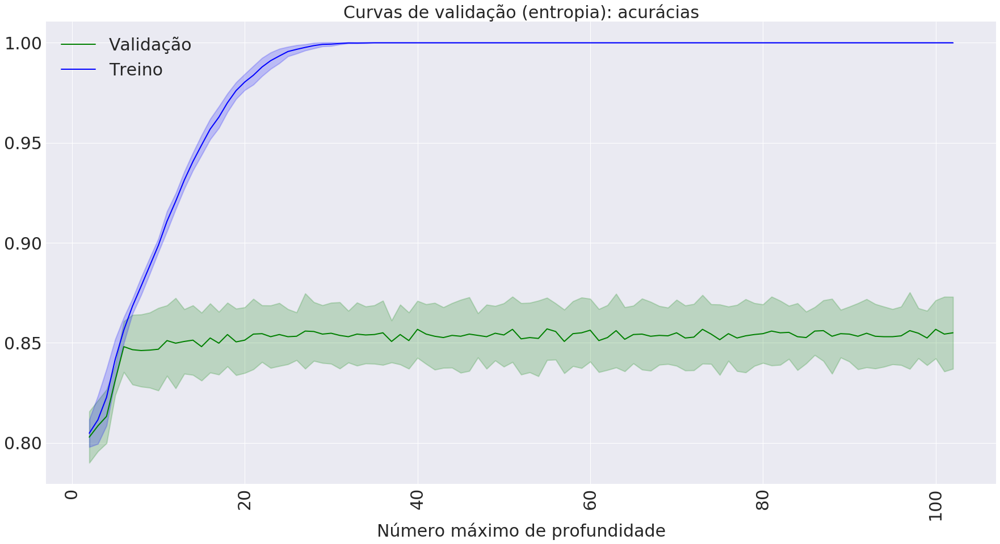

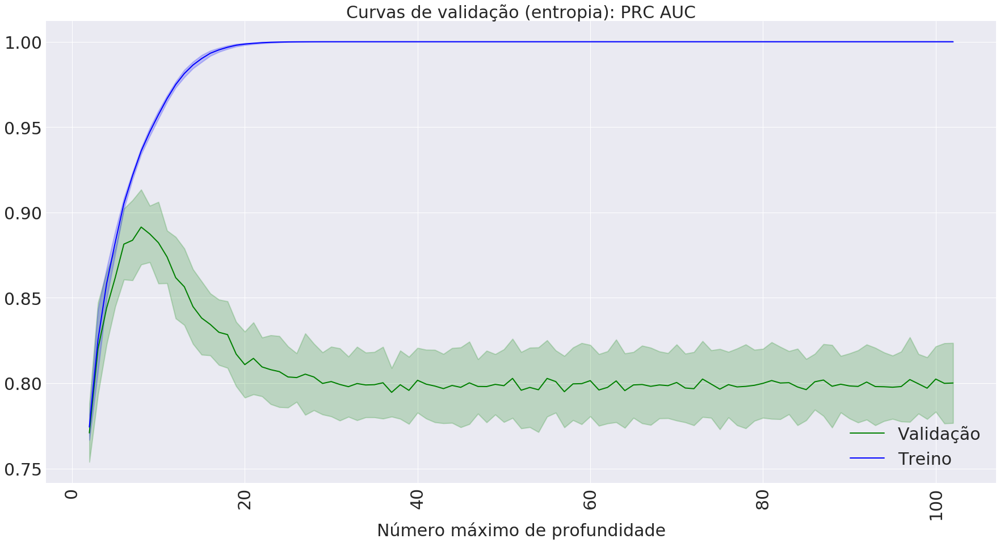

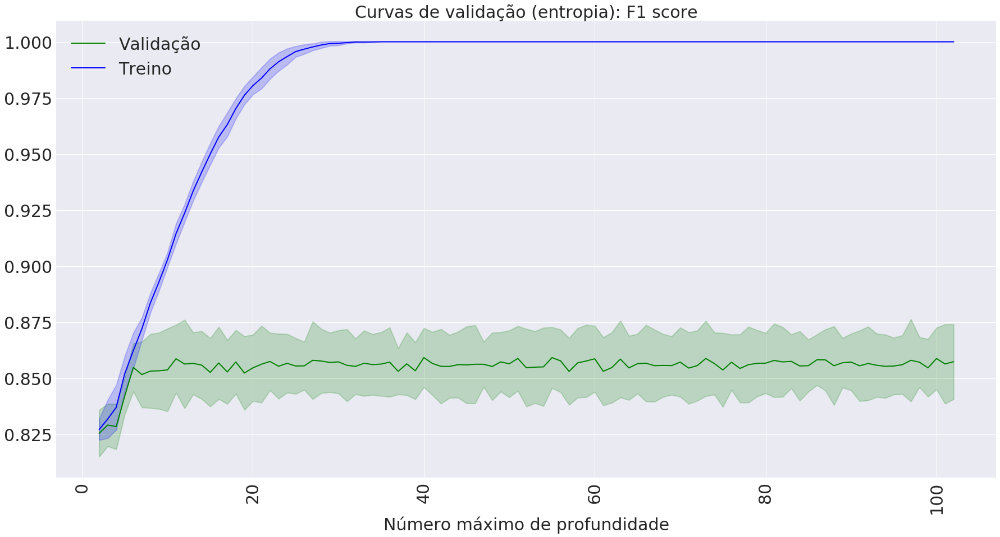

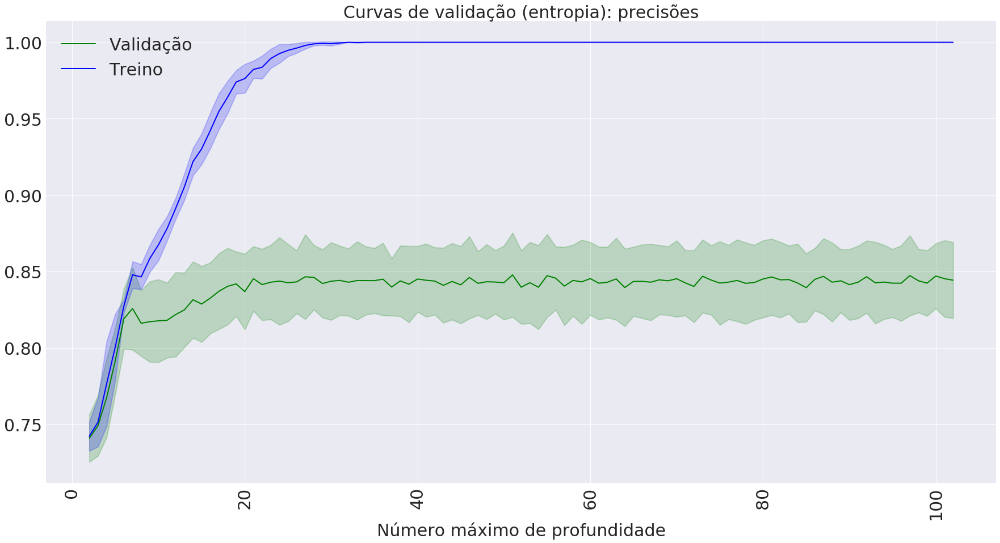

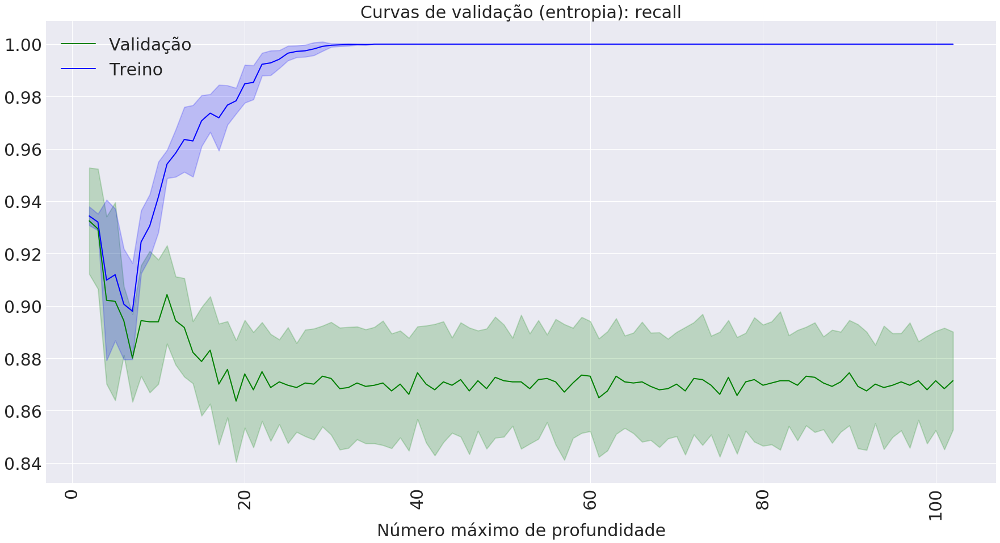

...

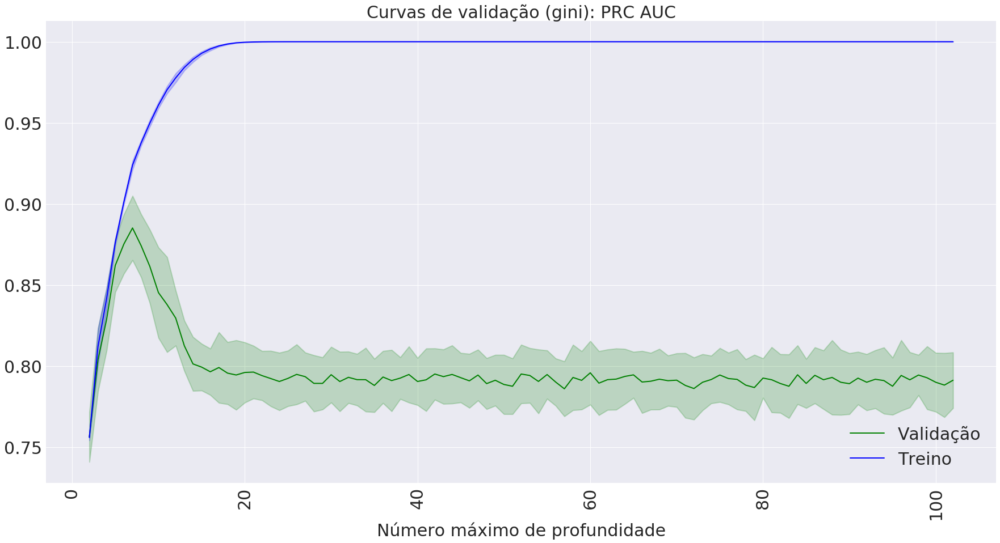

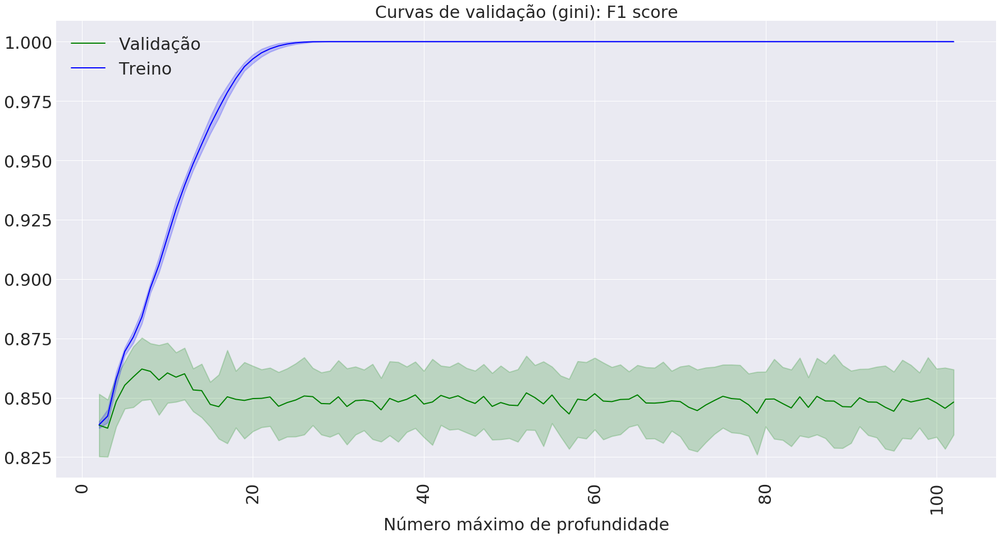

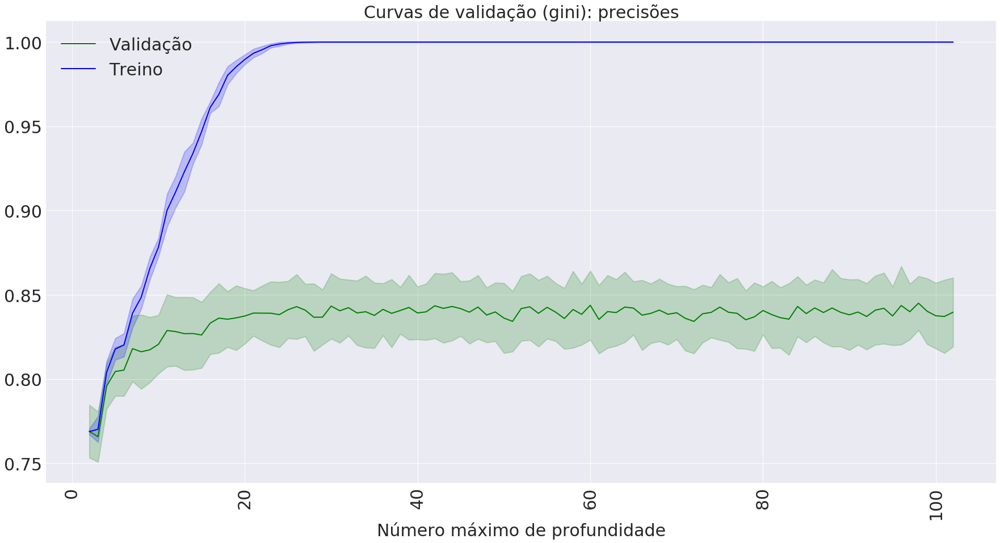

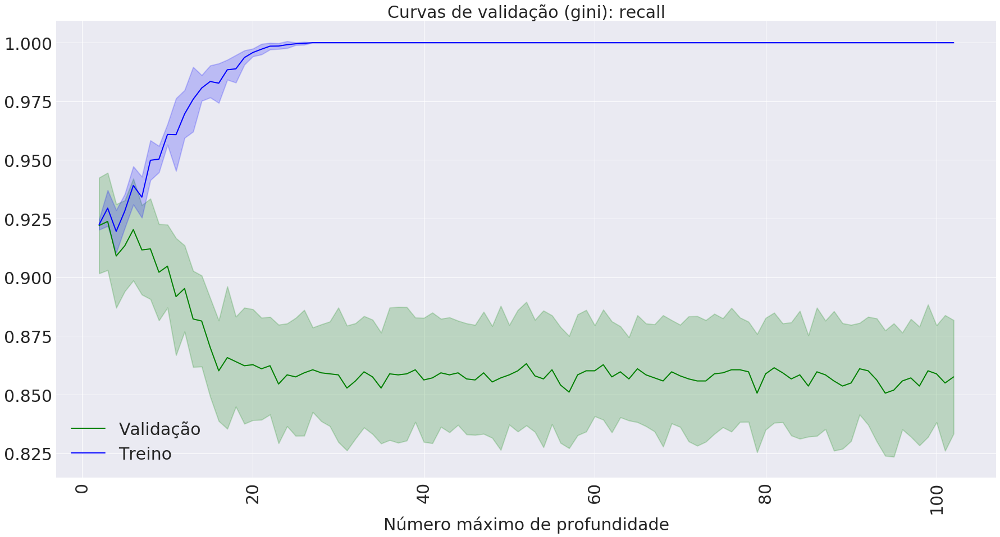

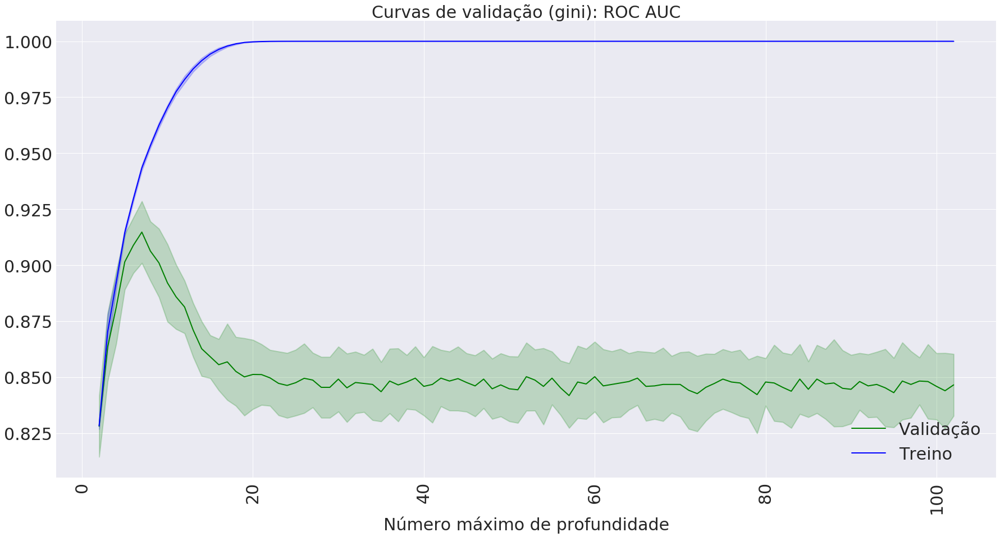

In [12]:
n_max_depths = np.arange(min_max_depth_parameter,max_max_depth_parameter+1) 

for criterio in ['entropia', 'gini']:
    
    if criterio == 'entropia':
        range_cols = list(range(0,int(results_test.shape[0]/2)))
    elif criterio == 'gini':
        range_cols = list(range(int(results_test.shape[0]/2),results_test.shape[0]))
    
    for metrica in lista_metricas:

        results_test_filtered = results_test.filter(regex='.*_test_' + str(metrica[0])).transpose()
        results_train_filtered = results_train.filter(regex='.*_train_' + str(metrica[0])).transpose()

#         results_test_filtered = results_test_filtered.iloc[:, 0:int((results_test_filtered.shape[1]/2))]
#         results_train_filtered = results_train_filtered.iloc[:, 0:int((results_train_filtered.shape[1]/2))]

        results_test_filtered = results_test_filtered.iloc[:, range_cols]
        results_train_filtered = results_train_filtered.iloc[:, range_cols]

        fig = plt.figure(figsize=(30,15))
        plt.plot(n_max_depths, results_test_filtered.mean(), label='Validação', color='green', lw=2)
        plt.fill_between(n_max_depths, results_test_filtered.mean() - results_test_filtered.std(),
                     results_test_filtered.mean() + results_test_filtered.std(), alpha=0.2, color='green', lw=2)

        plt.plot(n_max_depths, results_train_filtered.mean(), label='Treino', color='blue', lw=2)
        plt.fill_between(n_max_depths, results_train_filtered.mean() - results_train_filtered.std(),
                     results_train_filtered.mean() + results_train_filtered.std(), alpha=0.2, color='blue', lw=2)
        plt.title('Curvas de validação ('+ criterio + '): '+ metrica[1], fontsize=30)
        plt.xticks(fontsize=30, rotation=90)
        plt.xlabel('Número máximo de profundidade', fontsize=30)
        plt.yticks(fontsize=30)
        plt.legend(loc='best', fontsize=30)
        plt.show()

In [13]:
# Treinando a árvore final

path_arquivos = 'Classificadores/Arvores-decisao/'

dt_final_balanceado = DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=8)
dt_final_balanceado.fit(train_data_b_1, train_target_b_1)
joblib.dump(dt_final_balanceado, 
            path_arquivos+'arvore-final-abordagem-1-balanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl') # Salvando a árvore final

['Classificadores/Arvores-decisao/arvore-final-abordagem-1-balanceado-dataset-10pct.pkl']

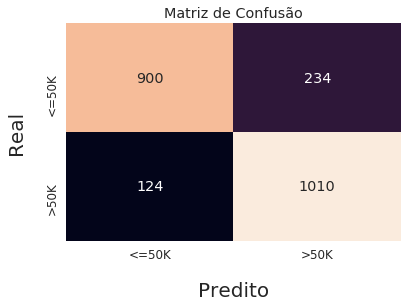

Acurácia: 84.215 %
Precisão: 81.190 %
Recall: 89.065 %
ROC AUC: 84.215 %
PRC AUC: 77.779 %


In [14]:
dt_final_balanceado = joblib.load(path_arquivos+'arvore-final-abordagem-1-balanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl')

exibir_resultados_finais(clf=dt_final_balanceado, 
                         test_data=test_data_b_1, 
                         test_target=test_target_b_1, 
                         id_abordagem=1, 
                         str_balanceamento='balanceado', 
                         fracao_dataset=0.1,
                         path_arquivos=path_arquivos,
                         tipo_classificador='arvore')

In [15]:
# # Classificando o conjunto de teste

# predicoes = dt_final_balanceado.predict(test_data_b_1)

# # Salvando a árvore treinada graficamente

# path_arquivos = 'Classificadores/Arvores-decisao/'

# export_graphviz(dt_final_balanceado, 
#                 out_file=path_arquivos+'arvore-final-abordagem-1-balanceado-dataset-'+str(int(fracao_dataset*100))+'pct.dot', 
#                 feature_names=test_data_b_1.columns,  
#                 class_names=['Less than or equal to', 'More than'],  
#                 filled=True, rounded=True,  
#                 special_characters=True)  

# # Avaliando o desempenho

# # Matriz de confusão

# cfs_mtx = confusion_matrix(test_target_b_1, predicoes)

# sns.set(font_scale=1.2)
# ax = sns.heatmap(cfs_mtx, 
#                  xticklabels=['<=50K', '>50K'], 
#                  yticklabels=['<=50K', '>50K'], 
#                  annot=cfs_mtx,
#                  fmt='d',
#                  cbar=None)

# ax.set_xlabel('Predito', labelpad=20, fontsize=20)
# ax.set_ylabel('Real', labelpad=20, fontsize=20)
# ax.set_title('Matriz de Confusão')
    
# # plot_confusion_matrix(cfs_mtx, ['<=50K', '>50K'], normalize=False)
# plt.show()

# acc = accuracy_score(test_target_b_1, predicoes)
# pre = precision_score(test_target_b_1, predicoes)
# rec = recall_score(test_target_b_1, predicoes)
# roc_auc = roc_auc_score(test_target_b_1, predicoes)
# prc_auc = average_precision_score(test_target_b_1, predicoes)

# print('Acurácia: %.3f %%' % (acc*100))
# print('Precisão: %.3f %%' % (pre*100))
# print('Recall: %.3f %%' % (rec*100))
# print('ROC AUC: %.3f %%' % (roc_auc*100))
# print('PRC AUC: %.3f %%' % (prc_auc*100))

In [16]:
# Descomentar somente se for necessário retreinar a árvore

# Abordagem 2: Imputar os valores faltantes e manter outliers

path_arquivos = 'Classificadores/Arvores-decisao/'

clf.fit(pd.get_dummies(train_data_2), train_target_2) # Classes desbalanceadas
joblib.dump(clf, 
            path_arquivos+'arvores-abordagem-2-desbalanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl') # Salvando os resultados da validação cruzada

clf.fit(train_data_b_2, train_target_b_2) # Classes balanceadas
joblib.dump(clf, 
            path_arquivos+'arvores-abordagem-2-balanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl') # Salvando os resultados da validação cruzada


# clf_desbalanceado.fit(pd.get_dummies(train_data_1), train_target_1)
# clf_balanceado.fit(pd.get_dummies(train_data_1), train_target_1)

# Salvando os resultados da validação cruzada

# path_arquivos = 'Classificadores/Arvores-decisao/'

# joblib.dump(clf_desbalanceado, path_arquivos+'arvores-abordagem-1-desbalanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl')
# joblib.dump(clf_balanceado, path_arquivos+'arvores-abordagem-1-balanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl')

['Classificadores/Arvores-decisao/arvores-abordagem-2-balanceado-dataset-10pct.pkl']

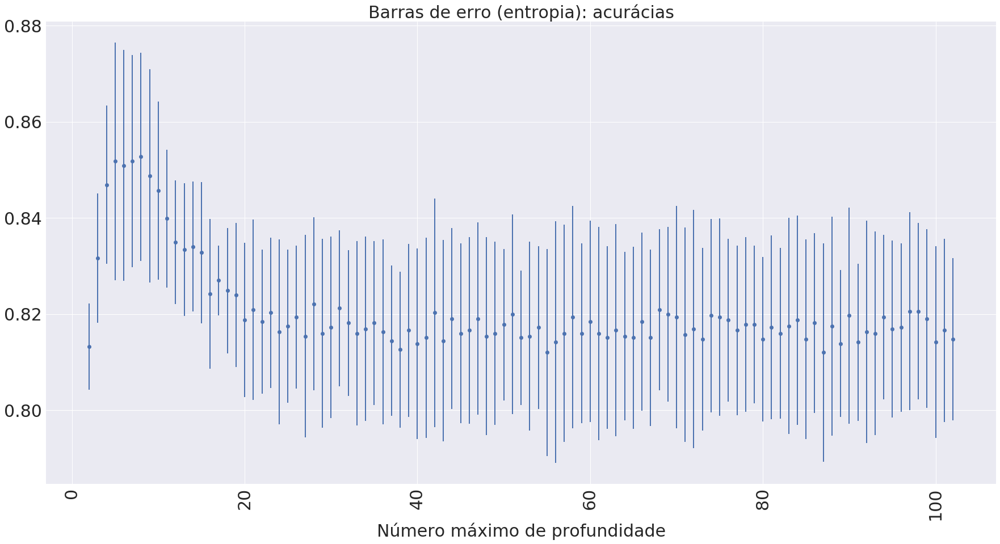

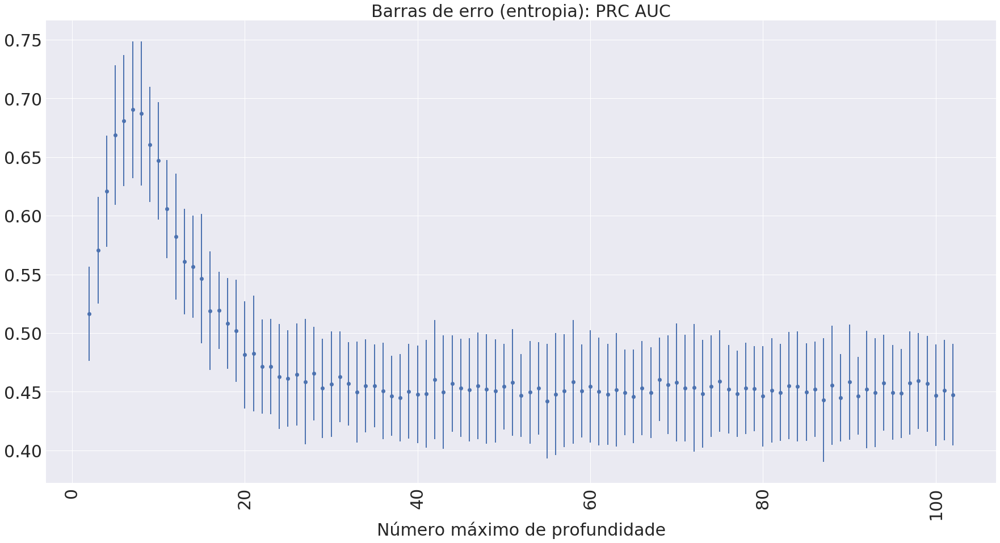

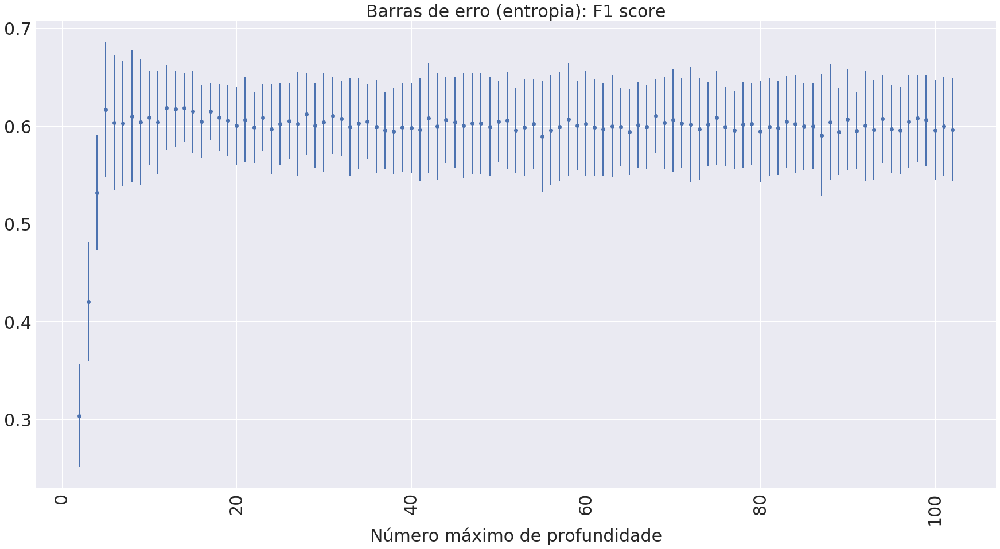

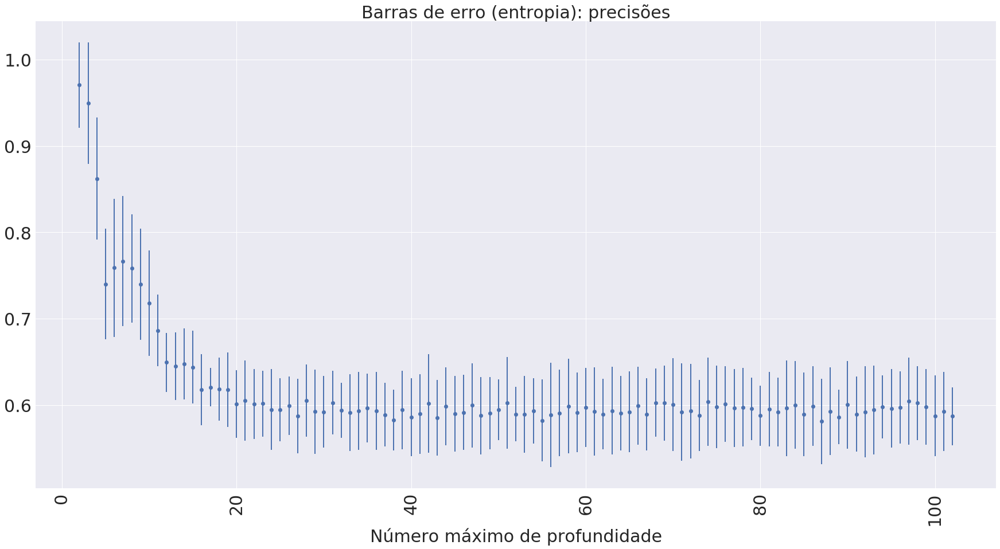

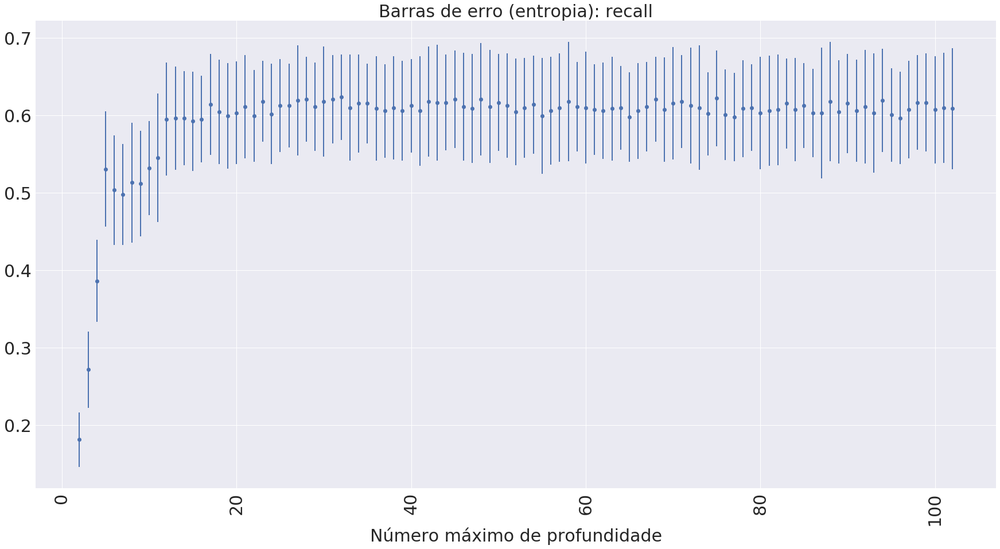

...

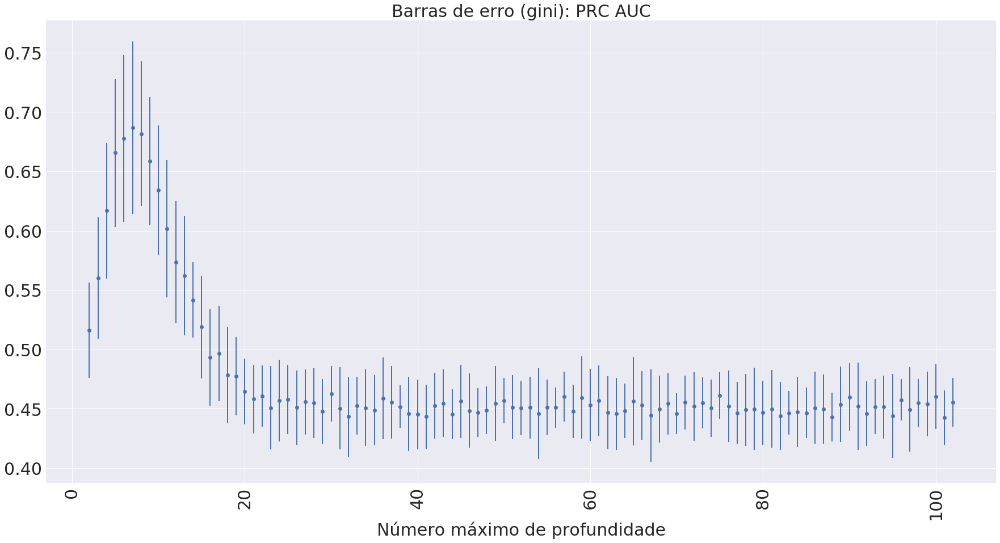

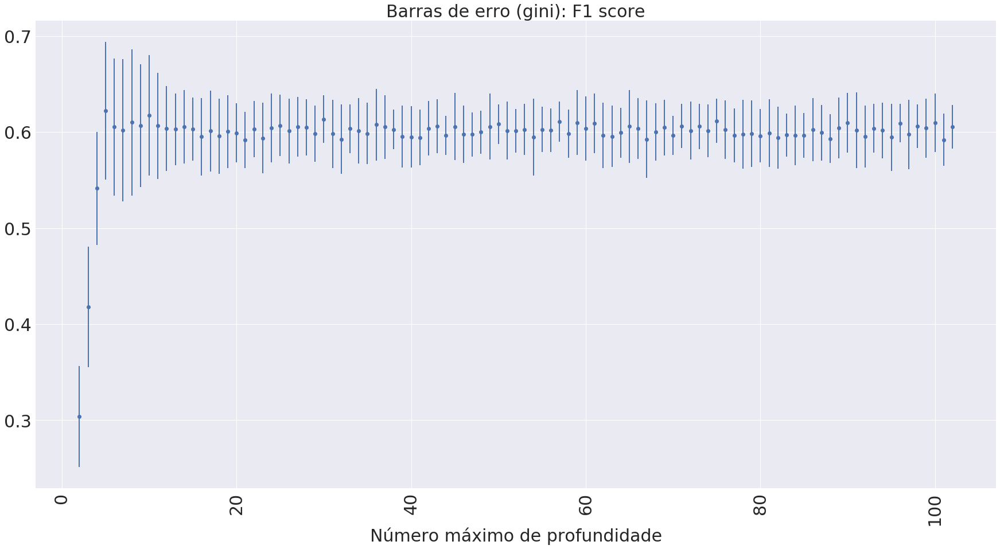

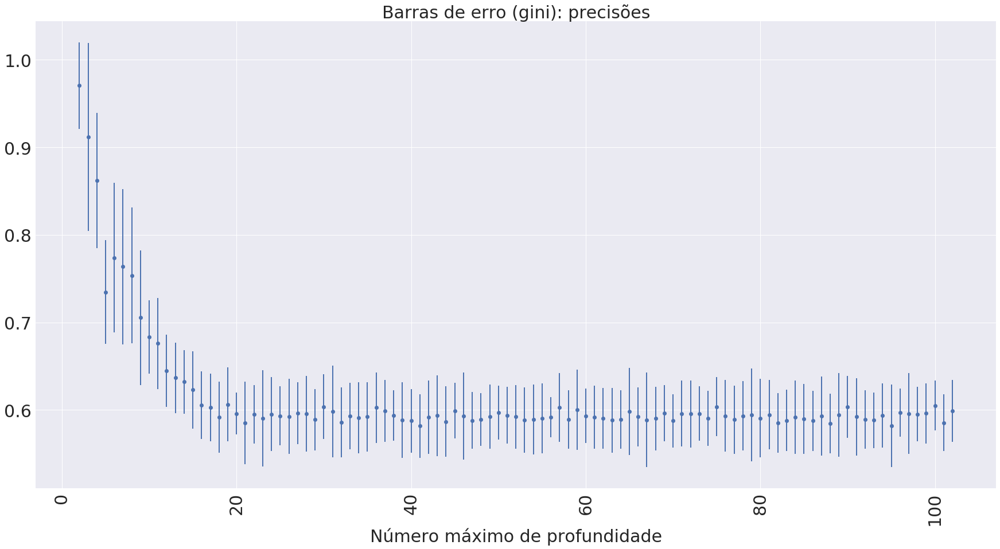

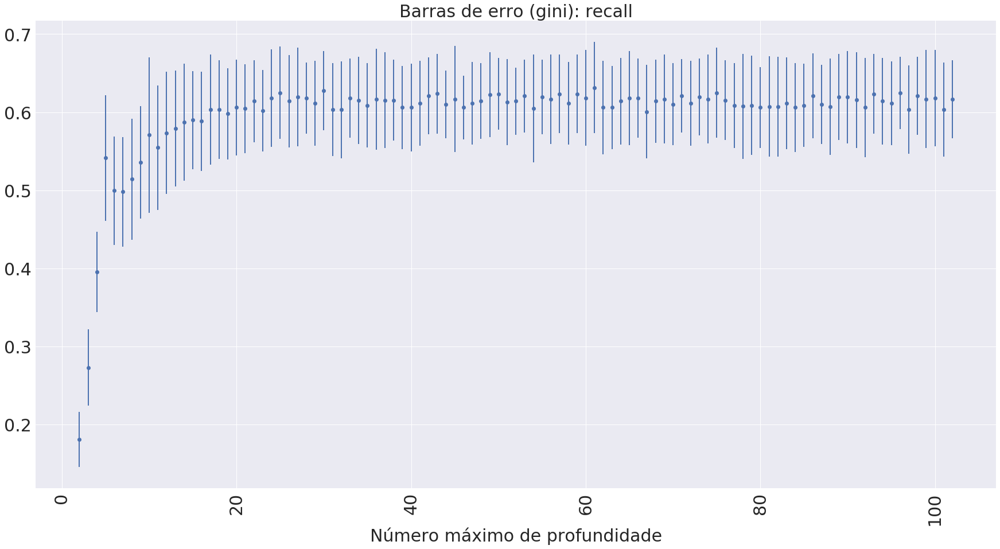

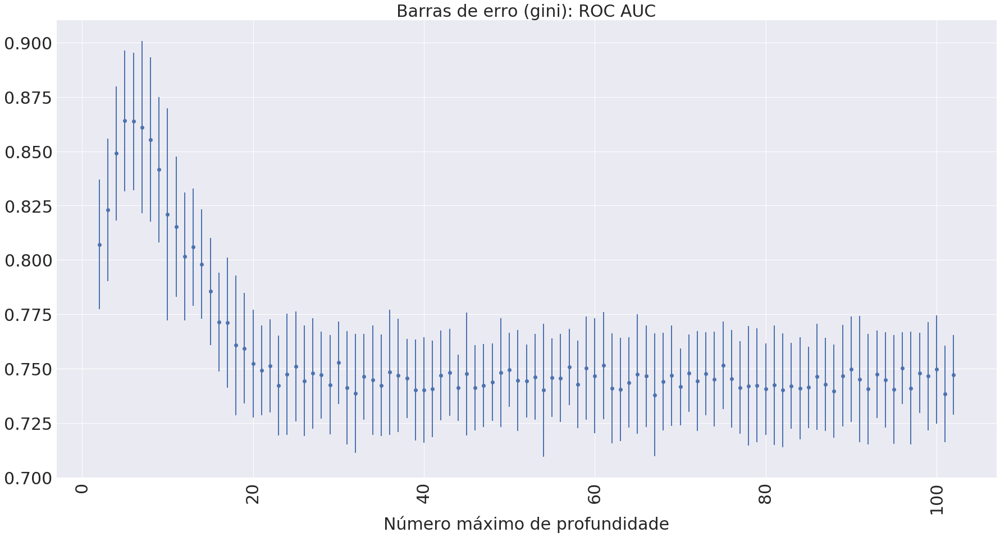

In [17]:
path_arquivos = 'Classificadores/Arvores-decisao/'

clf_desbalanceado = joblib.load(path_arquivos+'arvores-abordagem-2-desbalanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl')

results = pd.DataFrame(clf_desbalanceado.cv_results_)
# results['param_criterion'].head()
results.sort_values(by=['param_criterion','param_max_depth'], axis=0, inplace=True)
# results['param_criterion'].head()
results_test = results.loc[:, 'split0_test_accuracy':'split9_train_roc_auc']
results_train = results_test.filter(regex=(".*train.*"))
results_test.drop(columns=results_train.columns,inplace=True)

# for col in results.columns:
#     print(col)

lista_metricas = [('accuracy', 'acurácias'), ('average_precision', 'PRC AUC'), ('f1', 'F1 score'), ('precision', 'precisões'), ('recall', 'recall'), ('roc_auc', 'ROC AUC')]

# Plot das barras de erro

n_max_depths = np.arange(min_max_depth_parameter,max_max_depth_parameter+1) 

for criterio in ['entropia','gini']:
    
    if criterio == 'entropia':
        range_cols = list(range(0,int(results_test.shape[0]/2)))
    elif criterio == 'gini':
        range_cols = list(range(int(results_test.shape[0]/2),results_test.shape[0]))

    for metrica in lista_metricas:

        results_test_filtered = results_test.filter(regex='.*_test_'+str(metrica[0])).transpose()
        
        results_test_filtered = results_test_filtered.iloc[:, range_cols]

        fig = plt.figure(figsize=(30,15))

        plt.errorbar(n_max_depths, results_test_filtered.mean(), yerr=results_test_filtered.std(), fmt='o', lw=2)
        plt.title('Barras de erro (' + criterio + '): ' + metrica[1], fontsize=30)
        plt.xlabel('Número máximo de profundidade', fontsize=30)
        plt.xticks(fontsize=30, rotation=90)
        plt.yticks(fontsize=30)
        plt.show()

# Boxplots

# for criterio in ['entropia','gini']:
    
#     if criterio == 'entropia':
#         range_cols = list(range(0,int(results_test.shape[0]/2)))
#     elif criterio == 'gini':
#         range_cols = list(range(int(results_test.shape[0]/2),results_test.shape[0]))

#     for metrica in lista_metricas:

#         results_test_filtered = results_test.filter(regex='.*_test_'+str(metrica[0])).transpose()
        
#         results_test_filtered = results_test_filtered.iloc[:, range_cols]

#         fig = plt.figure(figsize=(30,15))
        
#         results_test_filtered.boxplot()
        
#         plt.title('Boxplot (' + criterio + '): ' + metrica[1], fontsize=30)
#         plt.xticks(np.arange(1, len(n_max_depths)+1), np.arange(min_max_depth_parameter,max_max_depth_parameter+1),
#                    fontsize=20, rotation=90)
#         plt.xlabel('Número máximo de profundidade', fontsize=30)
#         plt.yticks(fontsize=30)
#         plt.show()

In [18]:
# Treinando a árvore final

path_arquivos = 'Classificadores/Arvores-decisao/'

dt_final_desbalanceado = DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=8)
dt_final_desbalanceado.fit(pd.get_dummies(train_data_2), train_target_2)
joblib.dump(dt_final_desbalanceado, 
            path_arquivos+'arvore-final-abordagem-2-desbalanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl') # Salvando a árvore final

['Classificadores/Arvores-decisao/arvore-final-abordagem-2-desbalanceado-dataset-10pct.pkl']

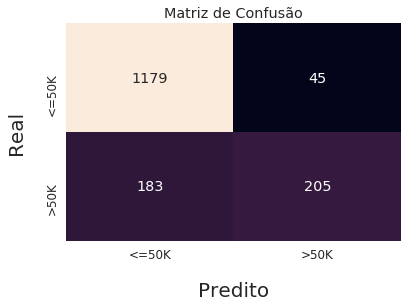

Acurácia: 85.856 %
Precisão: 82.000 %
Recall: 52.835 %
ROC AUC: 74.579 %
PRC AUC: 54.677 %


In [19]:
dt_final_desbalanceado = joblib.load(path_arquivos+'arvore-final-abordagem-2-desbalanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl')

exibir_resultados_finais(clf=dt_final_desbalanceado, 
                         test_data=pd.get_dummies(test_data_2), 
                         test_target=test_target_2, 
                         id_abordagem=2, 
                         str_balanceamento='desbalanceado', 
                         fracao_dataset=0.1,
                         path_arquivos=path_arquivos,
                         tipo_classificador='arvore')

In [20]:
# # Classificando o conjunto de teste

# predicoes = dt_final_desbalanceado.predict(pd.get_dummies(test_data_2))

# # Salvando a árvore treinada graficamente

# path_arquivos = 'Classificadores/Arvores-decisao/'

# export_graphviz(dt_final_desbalanceado, 
#                 out_file=path_arquivos+'arvore-final-abordagem-2-desbalanceado-dataset-'+str(int(fracao_dataset*100))+'pct.dot', 
#                 feature_names=pd.get_dummies(test_data_2).columns,  
#                 class_names=['Less than or equal to', 'More than'],  
#                 filled=True, rounded=True,  
#                 special_characters=True)  

# # Avaliando o desempenho

# # Matriz de confusão

# cfs_mtx = confusion_matrix(test_target_2, predicoes)

# sns.set(font_scale=1.2)
# ax = sns.heatmap(cfs_mtx, 
#                  xticklabels=['<=50K', '>50K'], 
#                  yticklabels=['<=50K', '>50K'], 
#                  annot=cfs_mtx,
#                  fmt='d',
#                  cbar=None)

# ax.set_xlabel('Predito', labelpad=20, fontsize=20)
# ax.set_ylabel('Real', labelpad=20, fontsize=20)
# ax.set_title('Matriz de Confusão')
    
# # plot_confusion_matrix(cfs_mtx, ['<=50K', '>50K'], normalize=False)
# plt.show()

# acc = accuracy_score(test_target_2, predicoes)
# pre = precision_score(test_target_2, predicoes)
# rec = recall_score(test_target_2, predicoes)
# roc_auc = roc_auc_score(test_target_2, predicoes)
# prc_auc = average_precision_score(test_target_2, predicoes)

# print('Acurácia: %.3f %%' % (acc*100))
# print('Precisão: %.3f %%' % (pre*100))
# print('Recall: %.3f %%' % (rec*100))
# print('ROC AUC: %.3f %%' % (roc_auc*100))
# print('PRC AUC: %.3f %%' % (prc_auc*100))

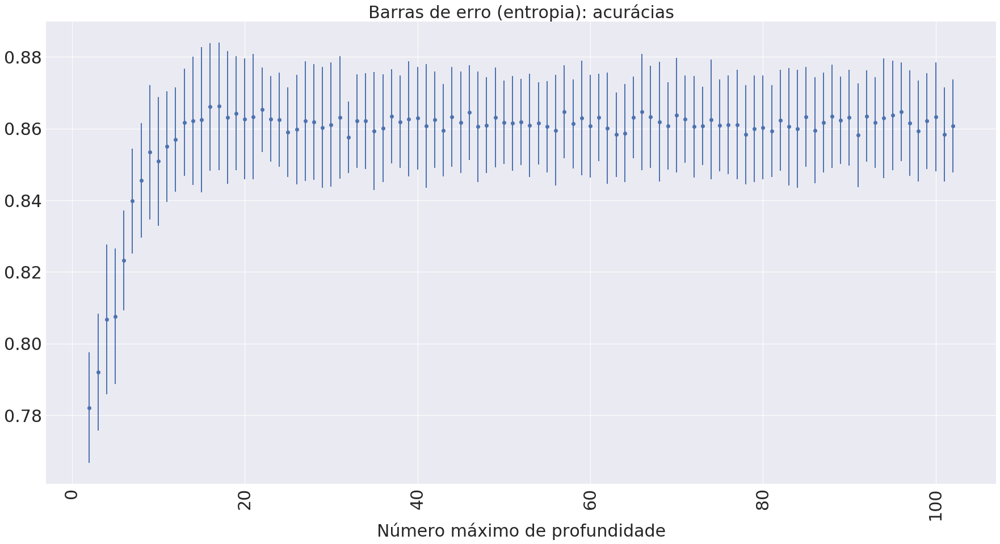

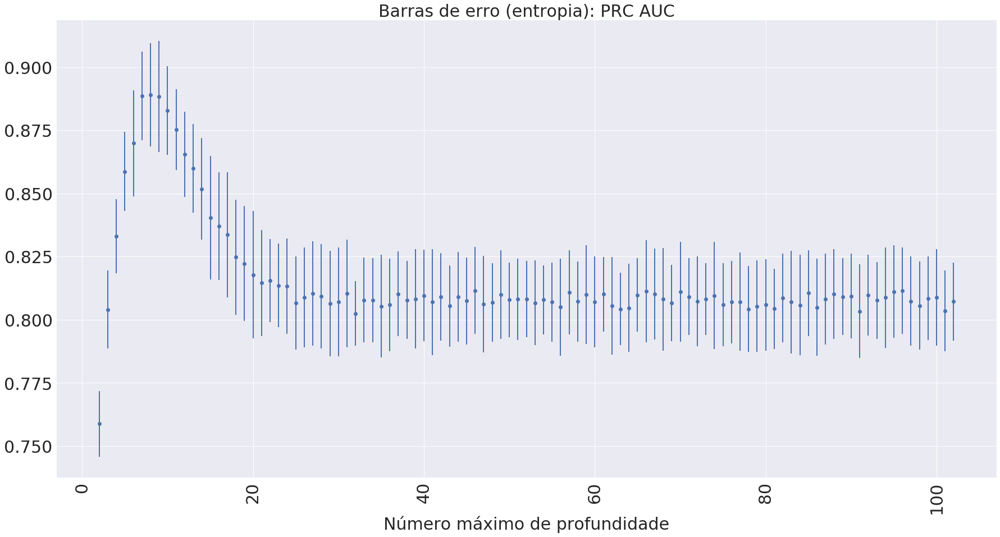

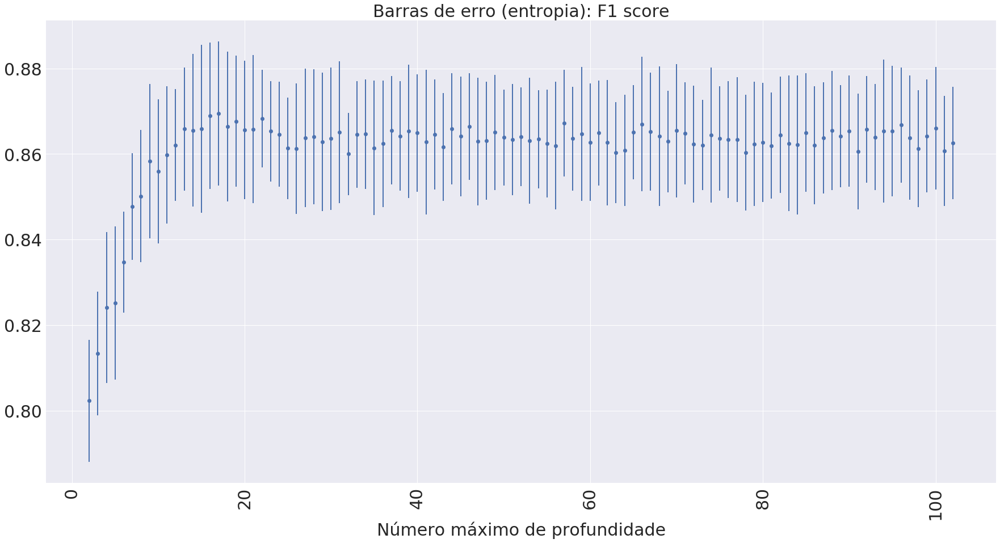

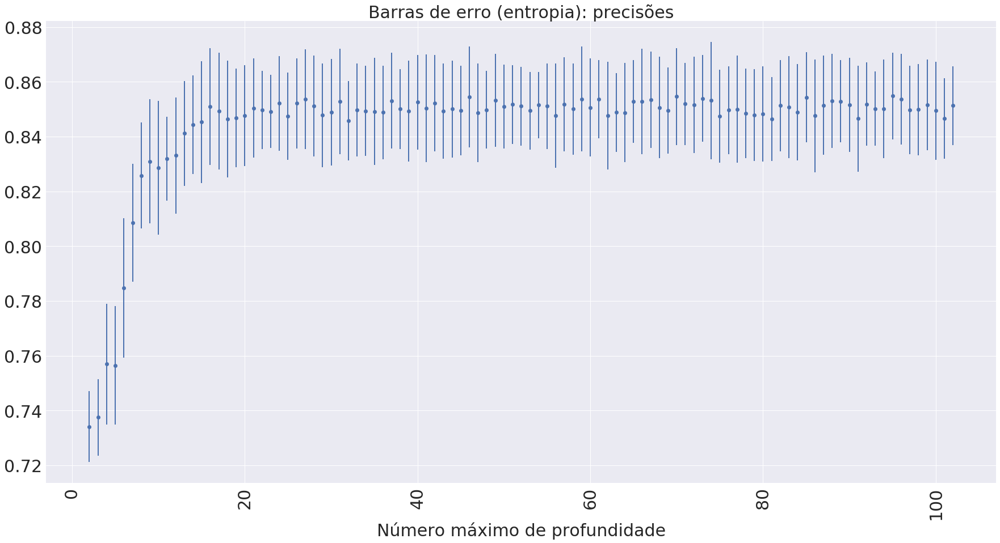

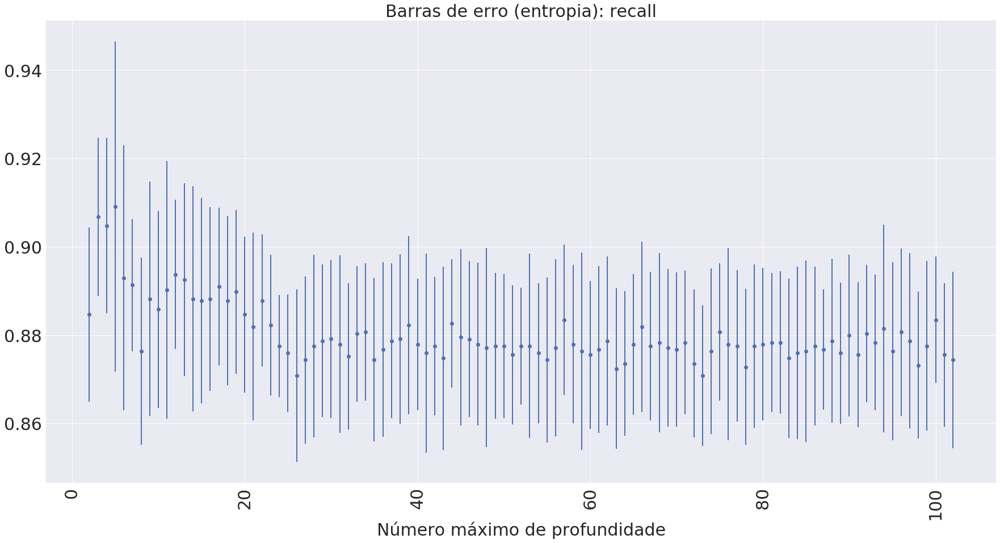

...

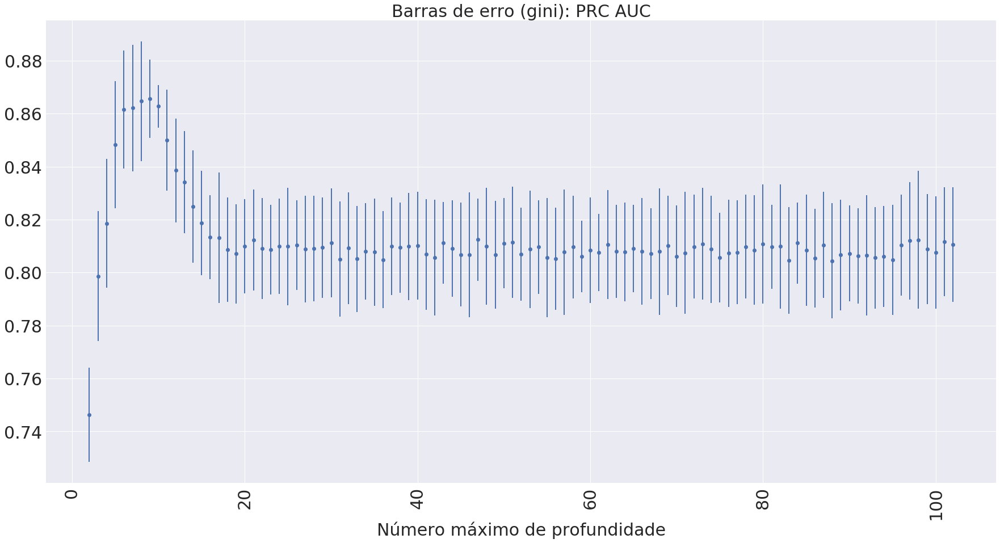

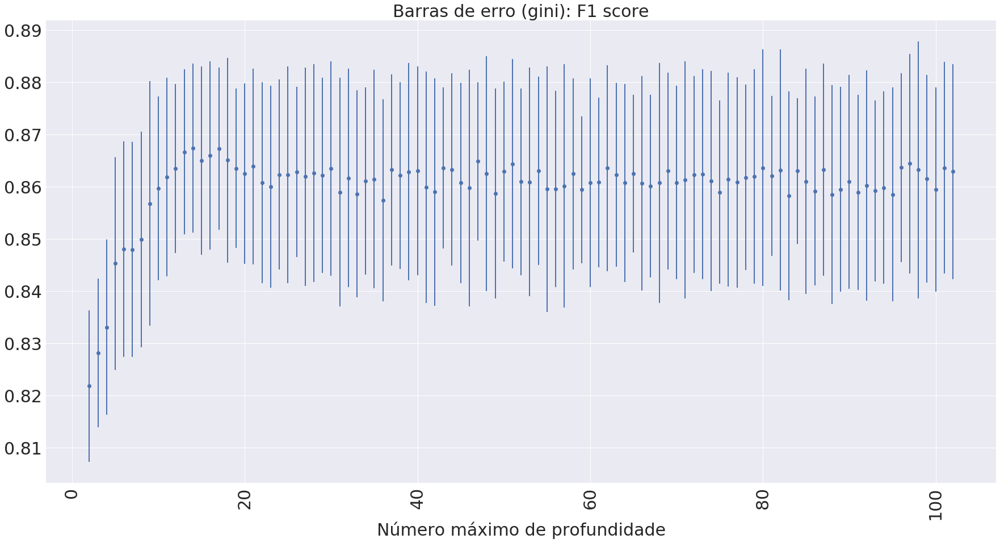

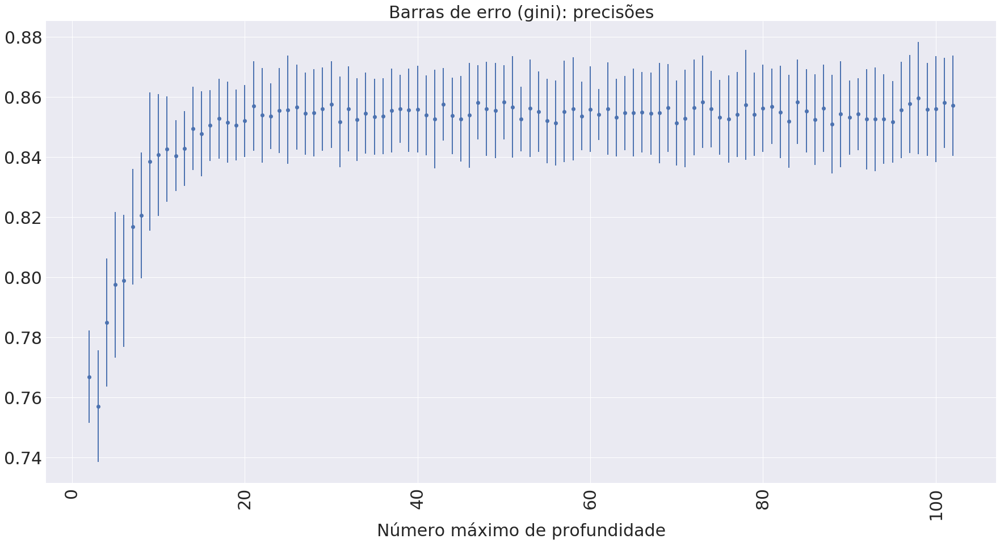

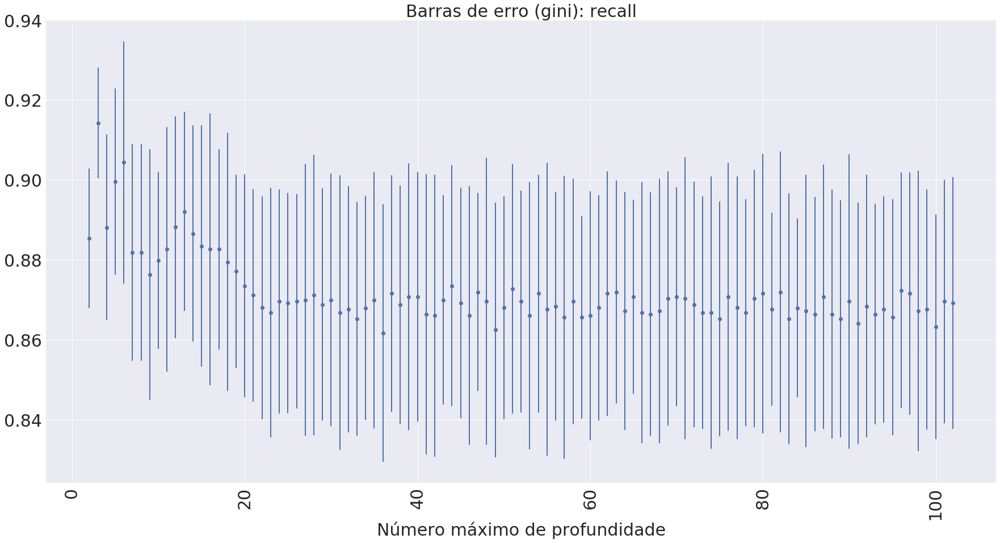

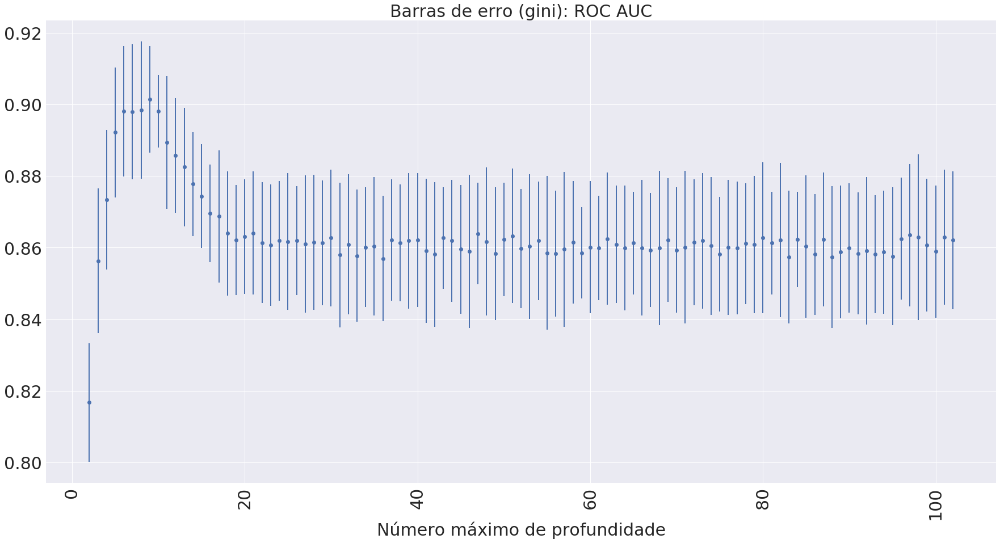

In [21]:
path_arquivos = 'Classificadores/Arvores-decisao/'

clf_balanceado = joblib.load(path_arquivos+'arvores-abordagem-2-balanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl')

results = pd.DataFrame(clf_balanceado.cv_results_)
# results['param_criterion'].head()
results.sort_values(by=['param_criterion','param_max_depth'], axis=0, inplace=True)
# results['param_criterion'].head()
results_test = results.loc[:, 'split0_test_accuracy':'split9_train_roc_auc']
results_train = results_test.filter(regex=(".*train.*"))
results_test.drop(columns=results_train.columns,inplace=True)

# for col in results.columns:
#     print(col)

lista_metricas = [('accuracy', 'acurácias'), ('average_precision', 'PRC AUC'), ('f1', 'F1 score'), ('precision', 'precisões'), ('recall', 'recall'), ('roc_auc', 'ROC AUC')]

# Plot das barras de erro

n_max_depths = np.arange(min_max_depth_parameter,max_max_depth_parameter+1) 

for criterio in ['entropia','gini']:
    
    if criterio == 'entropia':
        range_cols = list(range(0,int(results_test.shape[0]/2)))
    elif criterio == 'gini':
        range_cols = list(range(int(results_test.shape[0]/2),results_test.shape[0]))

    for metrica in lista_metricas:

        results_test_filtered = results_test.filter(regex='.*_test_'+str(metrica[0])).transpose()
        
        results_test_filtered = results_test_filtered.iloc[:, range_cols]

        fig = plt.figure(figsize=(30,15))

        plt.errorbar(n_max_depths, results_test_filtered.mean(), yerr=results_test_filtered.std(), fmt='o', lw=2)
        plt.title('Barras de erro (' + criterio + '): ' + metrica[1], fontsize=30)
        plt.xlabel('Número máximo de profundidade', fontsize=30)
        plt.xticks(fontsize=30, rotation=90)
        plt.yticks(fontsize=30)
        plt.show()

# Boxplots

# for criterio in ['entropia','gini']:
    
#     if criterio == 'entropia':
#         range_cols = list(range(0,int(results_test.shape[0]/2)))
#     elif criterio == 'gini':
#         range_cols = list(range(int(results_test.shape[0]/2),results_test.shape[0]))

#     for metrica in lista_metricas:

#         results_test_filtered = results_test.filter(regex='.*_test_'+str(metrica[0])).transpose()
        
#         results_test_filtered = results_test_filtered.iloc[:, range_cols]

#         fig = plt.figure(figsize=(30,15))
        
#         results_test_filtered.boxplot()
        
#         plt.title('Boxplot (' + criterio + '): ' + metrica[1], fontsize=30)
#         plt.xticks(np.arange(1, len(n_max_depths)+1), np.arange(min_max_depth_parameter,max_max_depth_parameter+1),
#                    fontsize=20, rotation=90)
#         plt.xlabel('Número máximo de profundidade', fontsize=30)
#         plt.yticks(fontsize=30)
#         plt.show()

Conforme pode-se observar pelos gráficos plotados anteriormente, a imputação de dados pelo valor de moda das features não acarreta em uma melhora ou piora significativa no desempenho das árvores treinadas. No caso das classes desbalanceadas, os resultados com imputação são ligeiramente piores do que sem imputação. Já para as classes balanceadas, há uma leve melhora somente em árvores que sofrem com overfitting.

In [22]:
# Treinando a árvore final

path_arquivos = 'Classificadores/Arvores-decisao/'

dt_final_balanceado = DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=8)
dt_final_balanceado.fit(train_data_b_2, train_target_b_2)
joblib.dump(dt_final_balanceado, 
            path_arquivos+'arvore-final-abordagem-2-balanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl') # Salvando a árvore final

['Classificadores/Arvores-decisao/arvore-final-abordagem-2-balanceado-dataset-10pct.pkl']

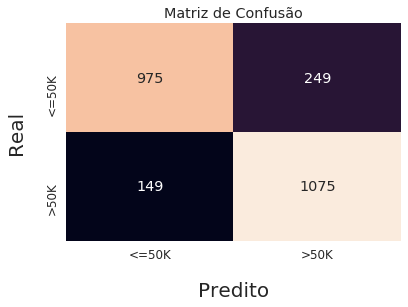

Acurácia: 83.742 %
Precisão: 81.193 %
Recall: 87.827 %
ROC AUC: 83.742 %
PRC AUC: 77.396 %


In [23]:
dt_final_balanceado = joblib.load(path_arquivos+'arvore-final-abordagem-2-balanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl')

exibir_resultados_finais(clf=dt_final_balanceado, 
                         test_data=test_data_b_2, 
                         test_target=test_target_b_2, 
                         id_abordagem=2, 
                         str_balanceamento='balanceado', 
                         fracao_dataset=0.1,
                         path_arquivos=path_arquivos,
                         tipo_classificador='arvore')

In [24]:
# # Classificando o conjunto de teste

# predicoes = dt_final_balanceado.predict(test_data_b_2)

# # Salvando a árvore treinada graficamente

# path_arquivos = 'Classificadores/Arvores-decisao/'

# export_graphviz(dt_final_balanceado, 
#                 out_file=path_arquivos+'arvore-final-abordagem-2-balanceado-dataset-'+str(int(fracao_dataset*100))+'pct.dot', 
#                 feature_names=test_data_b_2.columns,  
#                 class_names=['Less than or equal to', 'More than'],  
#                 filled=True, rounded=True,  
#                 special_characters=True)  

# # Avaliando o desempenho

# # Matriz de confusão

# cfs_mtx = confusion_matrix(test_target_b_2, predicoes)

# sns.set(font_scale=1.2)
# ax = sns.heatmap(cfs_mtx, 
#                  xticklabels=['<=50K', '>50K'], 
#                  yticklabels=['<=50K', '>50K'], 
#                  annot=cfs_mtx,
#                  fmt='d',
#                  cbar=None)

# ax.set_xlabel('Predito', labelpad=20, fontsize=20)
# ax.set_ylabel('Real', labelpad=20, fontsize=20)
# ax.set_title('Matriz de Confusão')
    
# # plot_confusion_matrix(cfs_mtx, ['<=50K', '>50K'], normalize=False)
# plt.show()

# acc = accuracy_score(test_target_b_2, predicoes)
# pre = precision_score(test_target_b_2, predicoes)
# rec = recall_score(test_target_b_2, predicoes)
# roc_auc = roc_auc_score(test_target_b_2, predicoes)
# prc_auc = average_precision_score(test_target_b_2, predicoes)

# print('Acurácia: %.3f %%' % (acc*100))
# print('Precisão: %.3f %%' % (pre*100))
# print('Recall: %.3f %%' % (rec*100))
# print('ROC AUC: %.3f %%' % (roc_auc*100))
# print('PRC AUC: %.3f %%' % (prc_auc*100))

In [25]:
# Descomentar somente se for necessário retreinar a árvore

# Abordagem 3: Imputar os valores faltantes e retirar outliers

path_arquivos = 'Classificadores/Arvores-decisao/'

clf.fit(pd.get_dummies(train_data_3), train_target_3) # Classes desbalanceadas
joblib.dump(clf, 
            path_arquivos+'arvores-abordagem-3-desbalanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl') # Salvando os resultados da validação cruzada

clf.fit(train_data_b_3, train_target_b_3) # Classes balanceadas
joblib.dump(clf, 
            path_arquivos+'arvores-abordagem-3-balanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl') # Salvando os resultados da validação cruzada


# clf_desbalanceado.fit(pd.get_dummies(train_data_1), train_target_1)
# clf_balanceado.fit(pd.get_dummies(train_data_1), train_target_1)

# Salvando os resultados da validação cruzada

# path_arquivos = 'Classificadores/Arvores-decisao/'

# joblib.dump(clf_desbalanceado, path_arquivos+'arvores-abordagem-1-desbalanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl')
# joblib.dump(clf_balanceado, path_arquivos+'arvores-abordagem-1-balanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl')

['Classificadores/Arvores-decisao/arvores-abordagem-3-balanceado-dataset-10pct.pkl']

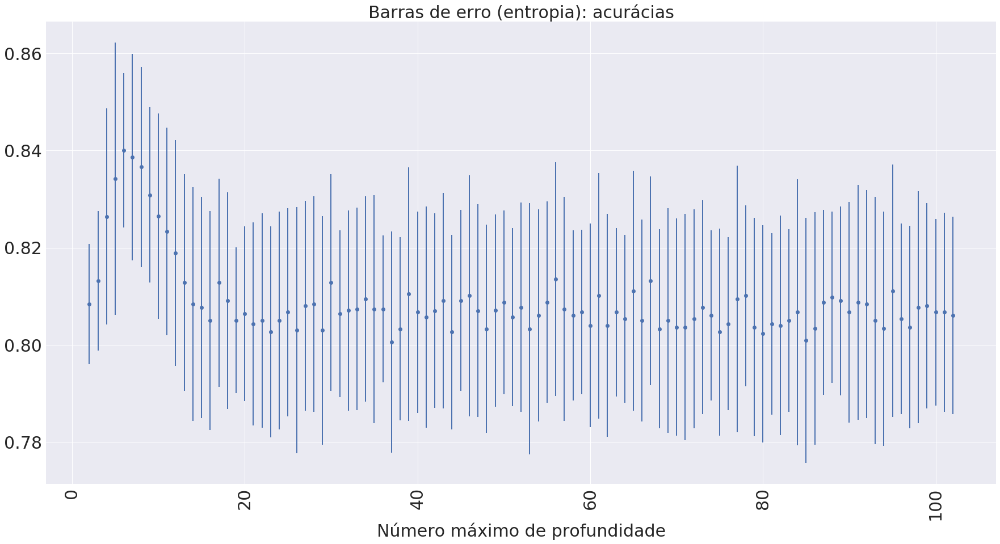

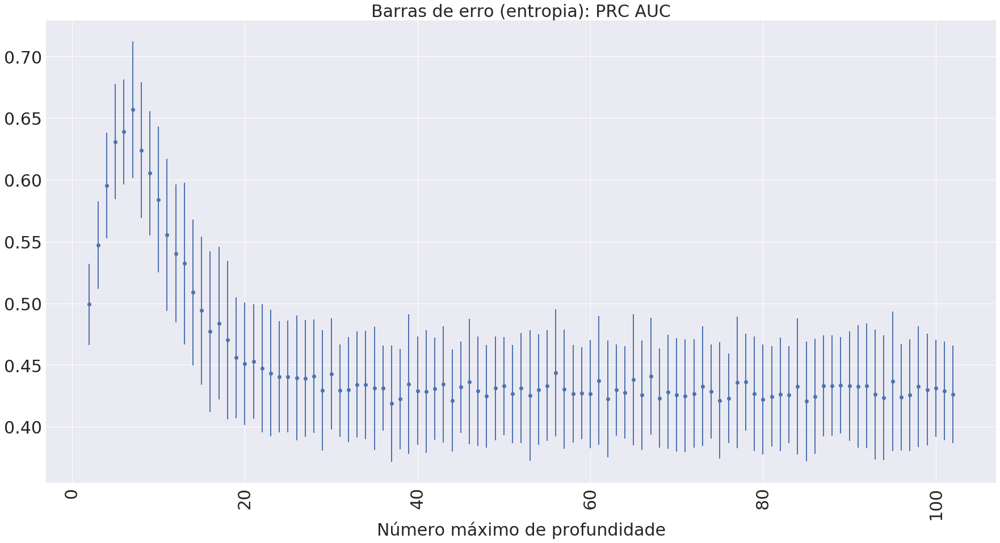

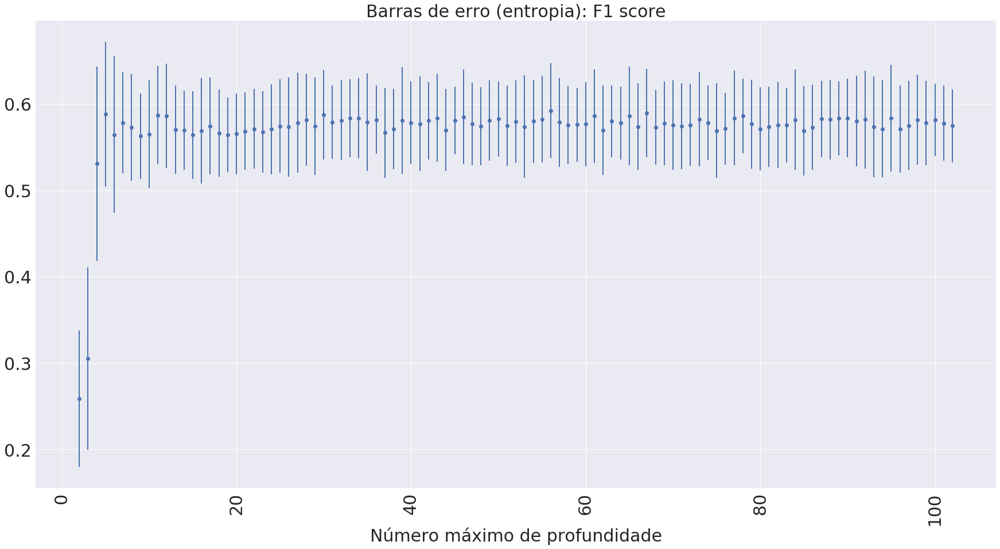

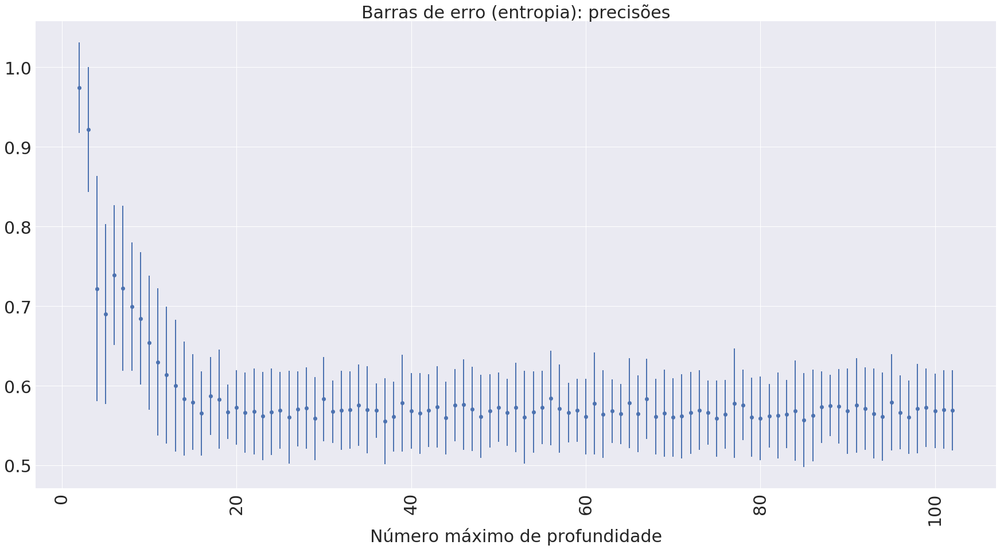

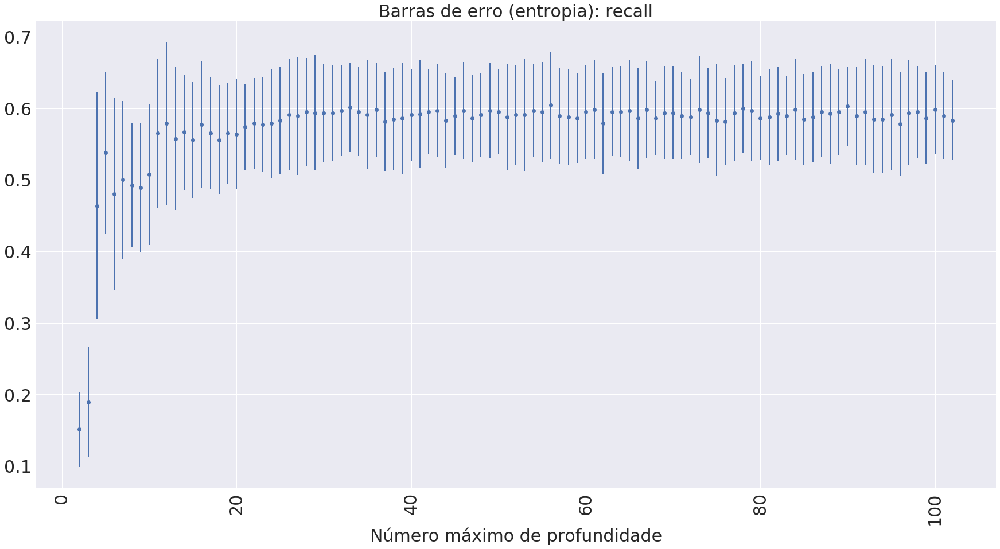

...

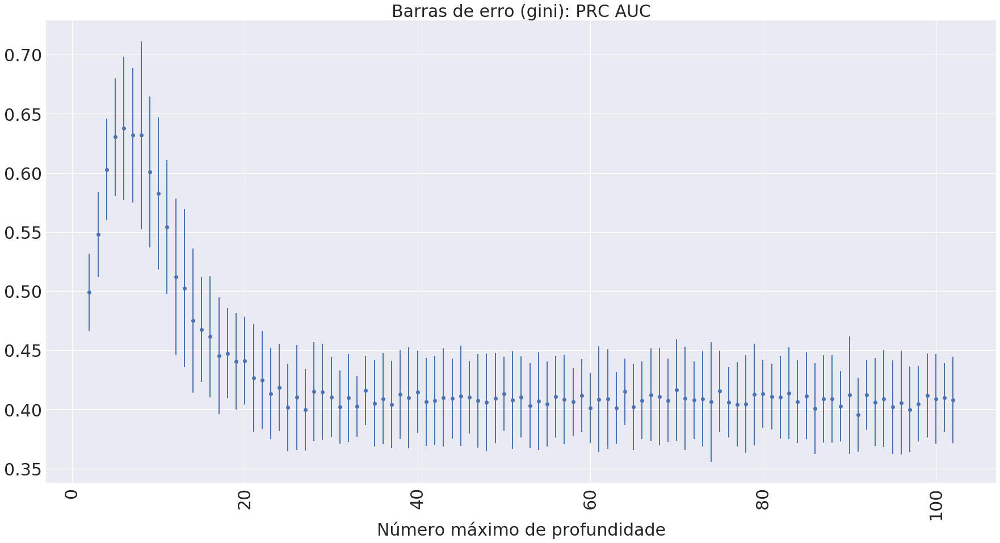

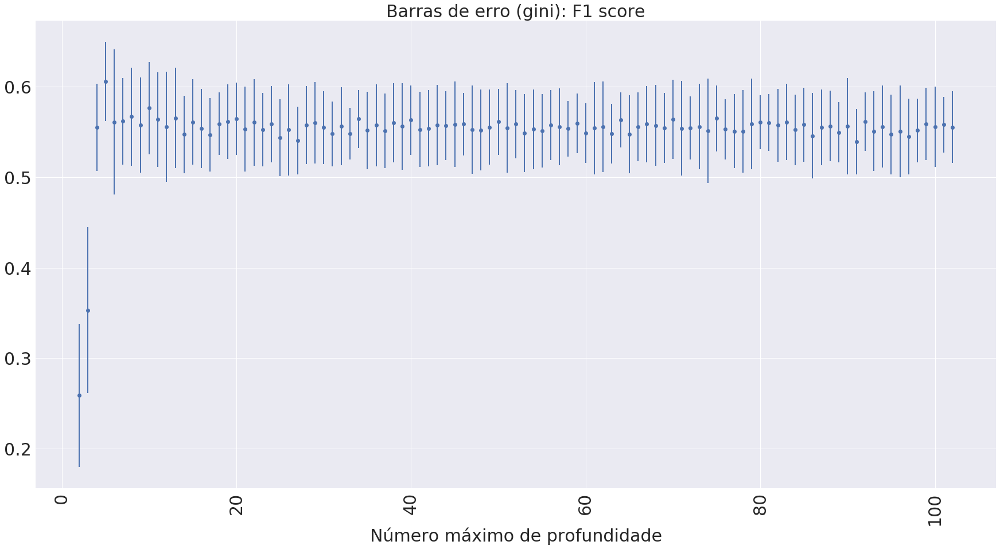

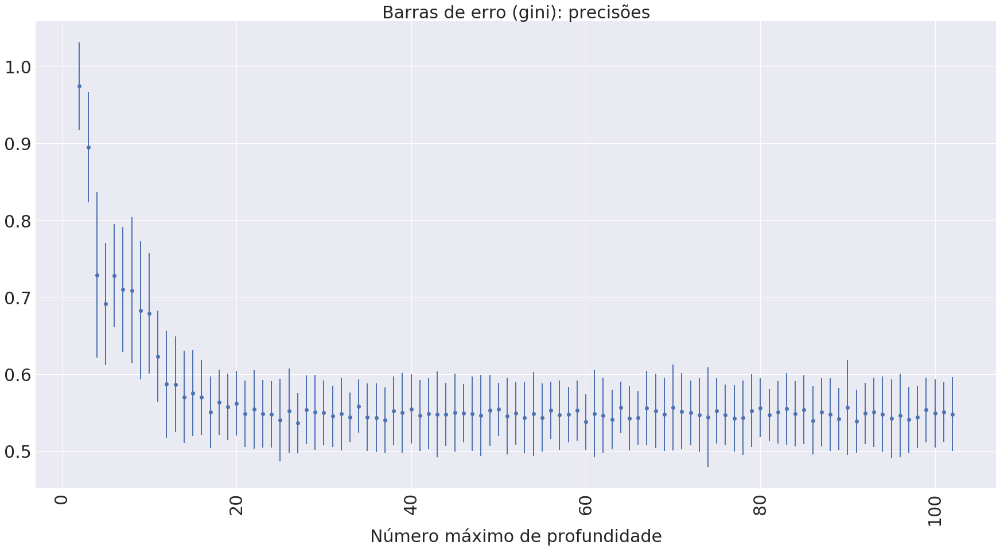

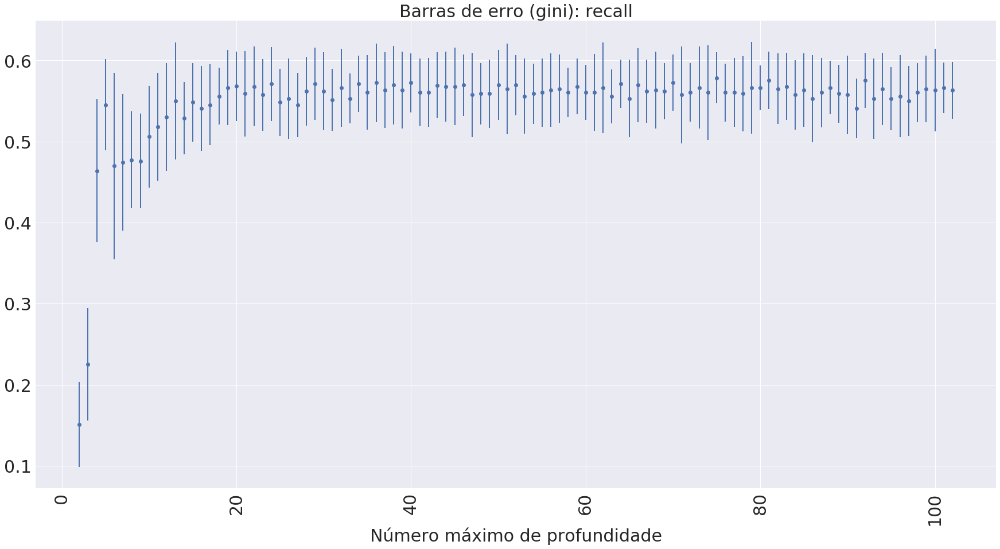

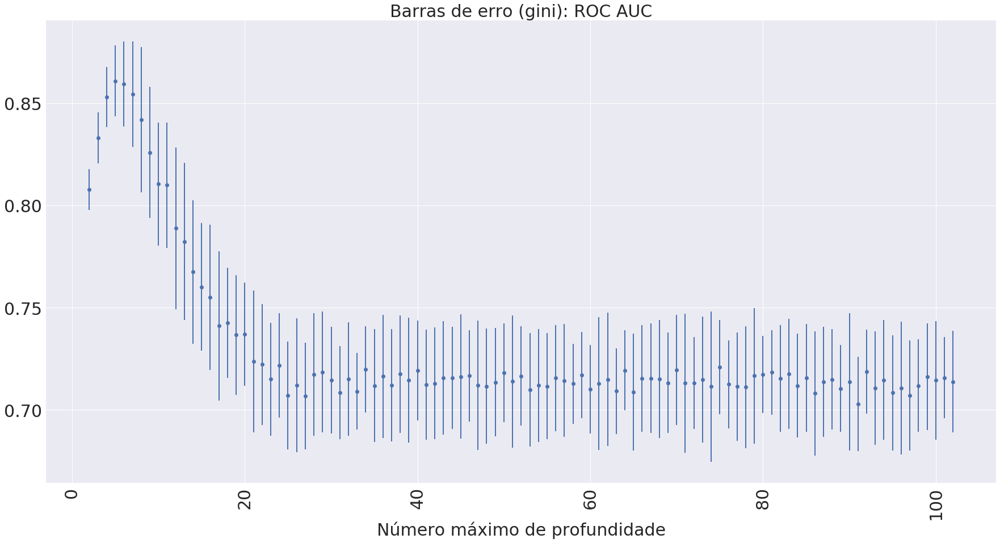

In [26]:
path_arquivos = 'Classificadores/Arvores-decisao/'

clf_desbalanceado = joblib.load(path_arquivos+'arvores-abordagem-3-desbalanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl')

results = pd.DataFrame(clf_desbalanceado.cv_results_)
# results['param_criterion'].head()
results.sort_values(by=['param_criterion','param_max_depth'], axis=0, inplace=True)
# results['param_criterion'].head()
results_test = results.loc[:, 'split0_test_accuracy':'split9_train_roc_auc']
results_train = results_test.filter(regex=(".*train.*"))
results_test.drop(columns=results_train.columns,inplace=True)

# for col in results.columns:
#     print(col)

lista_metricas = [('accuracy', 'acurácias'), ('average_precision', 'PRC AUC'), ('f1', 'F1 score'), ('precision', 'precisões'), ('recall', 'recall'), ('roc_auc', 'ROC AUC')]

# Plot das barras de erro

n_max_depths = np.arange(min_max_depth_parameter,max_max_depth_parameter+1) 

for criterio in ['entropia','gini']:
    
    if criterio == 'entropia':
        range_cols = list(range(0,int(results_test.shape[0]/2)))
    elif criterio == 'gini':
        range_cols = list(range(int(results_test.shape[0]/2),results_test.shape[0]))

    for metrica in lista_metricas:

        results_test_filtered = results_test.filter(regex='.*_test_'+str(metrica[0])).transpose()
        
        results_test_filtered = results_test_filtered.iloc[:, range_cols]

        fig = plt.figure(figsize=(30,15))

        plt.errorbar(n_max_depths, results_test_filtered.mean(), yerr=results_test_filtered.std(), fmt='o', lw=2)
        plt.title('Barras de erro (' + criterio + '): ' + metrica[1], fontsize=30)
        plt.xlabel('Número máximo de profundidade', fontsize=30)
        plt.xticks(fontsize=30, rotation=90)
        plt.yticks(fontsize=30)
        plt.show()

# Boxplots

# for criterio in ['entropia','gini']:
    
#     if criterio == 'entropia':
#         range_cols = list(range(0,int(results_test.shape[0]/2)))
#     elif criterio == 'gini':
#         range_cols = list(range(int(results_test.shape[0]/2),results_test.shape[0]))

#     for metrica in lista_metricas:

#         results_test_filtered = results_test.filter(regex='.*_test_'+str(metrica[0])).transpose()
        
#         results_test_filtered = results_test_filtered.iloc[:, range_cols]

#         fig = plt.figure(figsize=(30,15))
        
#         results_test_filtered.boxplot()
        
#         plt.title('Boxplot (' + criterio + '): ' + metrica[1], fontsize=30)
#         plt.xticks(np.arange(1, len(n_max_depths)+1), np.arange(min_max_depth_parameter,max_max_depth_parameter+1),
#                    fontsize=20, rotation=90)
#         plt.xlabel('Número máximo de profundidade', fontsize=30)
#         plt.yticks(fontsize=30)
#         plt.show()

In [27]:
# Treinando a árvore final

path_arquivos = 'Classificadores/Arvores-decisao/'

dt_final_desbalanceado = DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=8)
dt_final_desbalanceado.fit(pd.get_dummies(train_data_3), train_target_3)
joblib.dump(dt_final_desbalanceado, 
            path_arquivos+'arvore-final-abordagem-3-desbalanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl') # Salvando a árvore final

['Classificadores/Arvores-decisao/arvore-final-abordagem-3-desbalanceado-dataset-10pct.pkl']

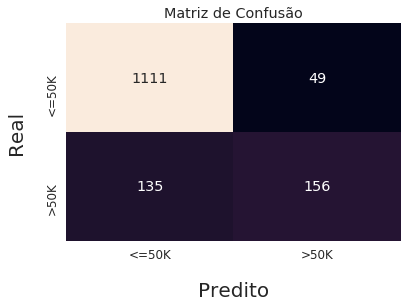

Acurácia: 87.319 %
Precisão: 76.098 %
Recall: 53.608 %
ROC AUC: 74.692 %
PRC AUC: 50.098 %


In [28]:
dt_final_desbalanceado = joblib.load(path_arquivos+'arvore-final-abordagem-3-desbalanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl')

exibir_resultados_finais(clf=dt_final_desbalanceado, 
                         test_data=pd.get_dummies(test_data_3), 
                         test_target=test_target_3, 
                         id_abordagem=3, 
                         str_balanceamento='desbalanceado', 
                         fracao_dataset=0.1,
                         path_arquivos=path_arquivos,
                         tipo_classificador='arvore')

In [29]:
# # Classificando o conjunto de teste

# predicoes = dt_final_desbalanceado.predict(pd.get_dummies(test_data_3))

# # Salvando a árvore treinada graficamente

# path_arquivos = 'Classificadores/Arvores-decisao/'

# export_graphviz(dt_final_desbalanceado, 
#                 out_file=path_arquivos+'arvore-final-abordagem-3-desbalanceado-dataset-'+str(int(fracao_dataset*100))+'pct.dot', 
#                 feature_names=pd.get_dummies(test_data_3).columns,  
#                 class_names=['Less than or equal to', 'More than'],  
#                 filled=True, rounded=True,  
#                 special_characters=True)  

# # Avaliando o desempenho

# # Matriz de confusão

# cfs_mtx = confusion_matrix(test_target_3, predicoes)

# sns.set(font_scale=1.2)
# ax = sns.heatmap(cfs_mtx, 
#                  xticklabels=['<=50K', '>50K'], 
#                  yticklabels=['<=50K', '>50K'], 
#                  annot=cfs_mtx,
#                  fmt='d',
#                  cbar=None)

# ax.set_xlabel('Predito', labelpad=20, fontsize=20)
# ax.set_ylabel('Real', labelpad=20, fontsize=20)
# ax.set_title('Matriz de Confusão')
    
# # plot_confusion_matrix(cfs_mtx, ['<=50K', '>50K'], normalize=False)
# plt.show()

# acc = accuracy_score(test_target_3, predicoes)
# pre = precision_score(test_target_3, predicoes)
# rec = recall_score(test_target_3, predicoes)
# roc_auc = roc_auc_score(test_target_3, predicoes)
# prc_auc = average_precision_score(test_target_3, predicoes)

# print('Acurácia: %.3f %%' % (acc*100))
# print('Precisão: %.3f %%' % (pre*100))
# print('Recall: %.3f %%' % (rec*100))
# print('ROC AUC: %.3f %%' % (roc_auc*100))
# print('PRC AUC: %.3f %%' % (prc_auc*100))

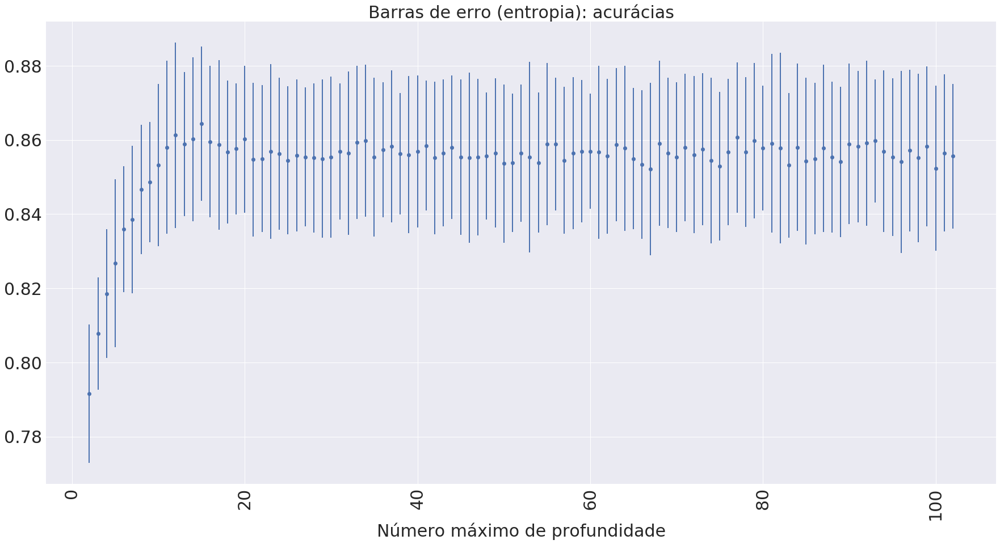

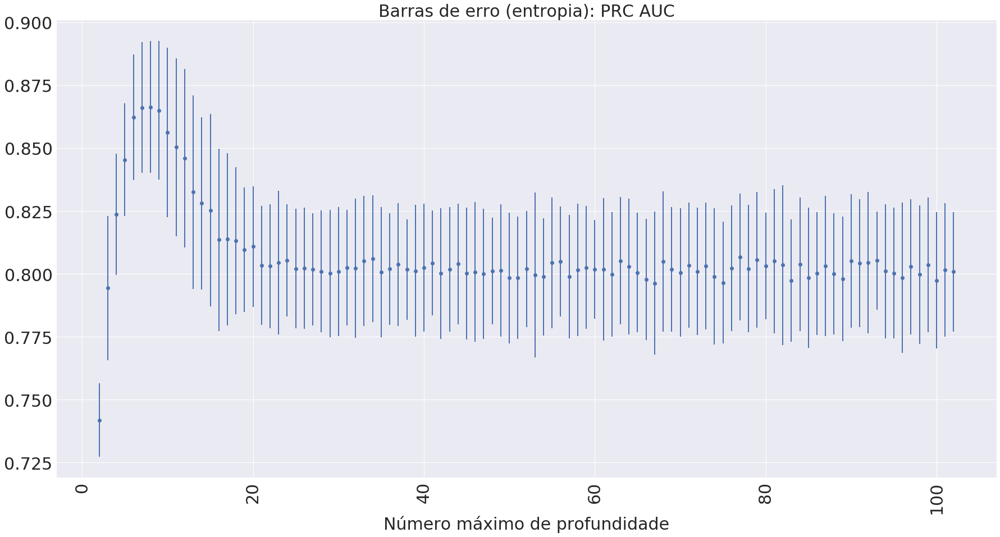

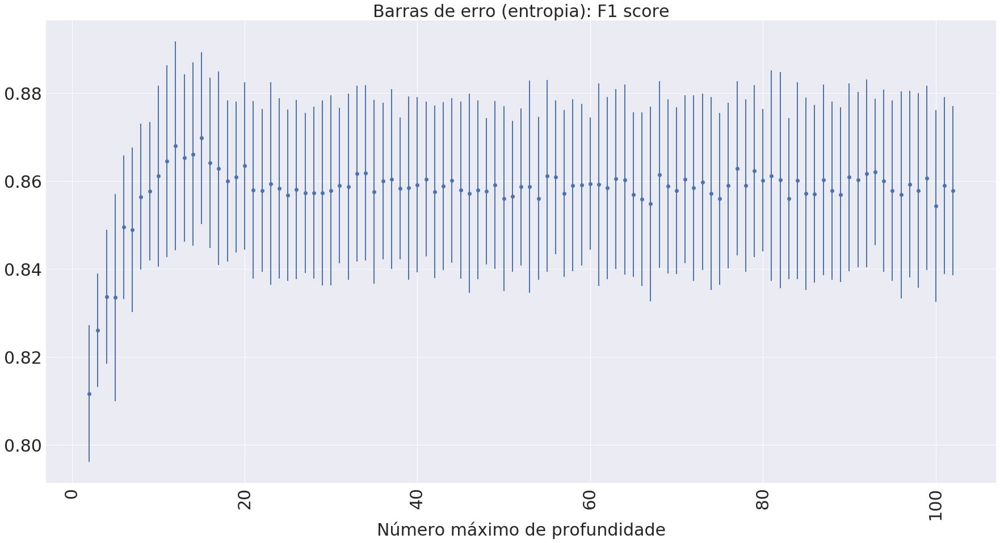

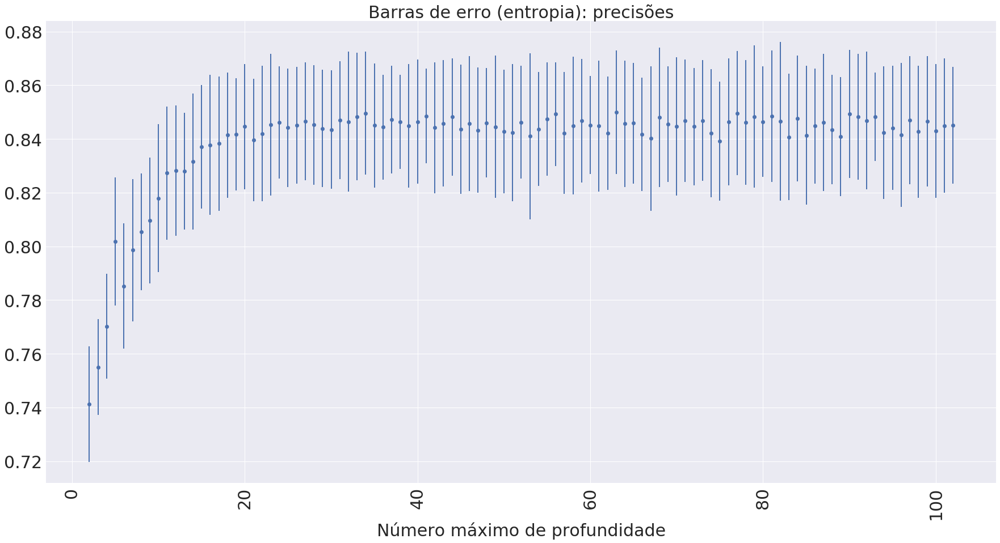

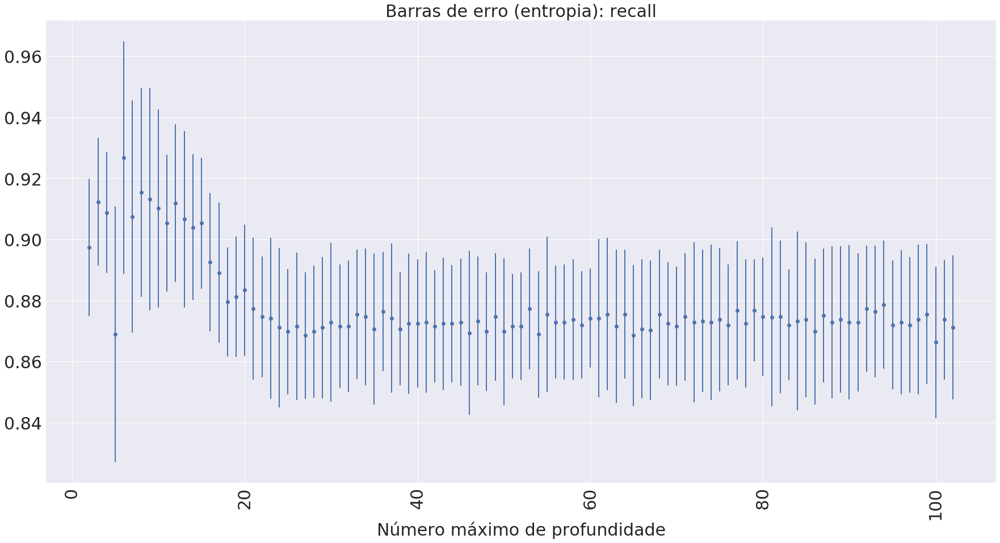

...

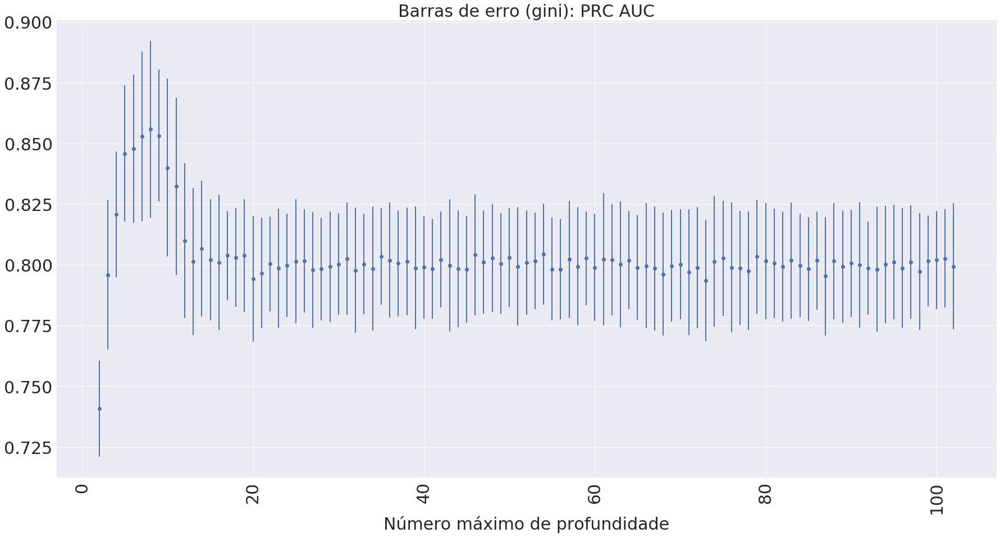

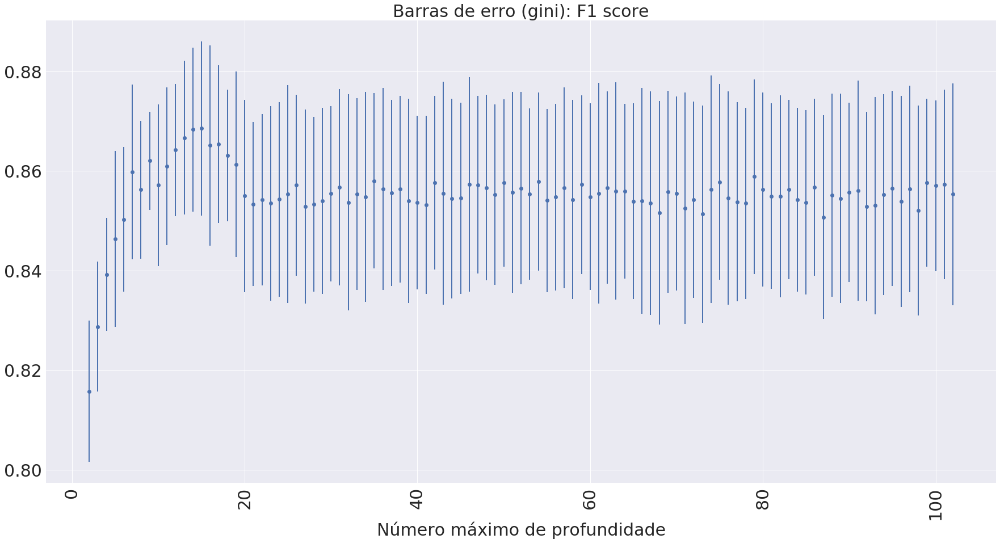

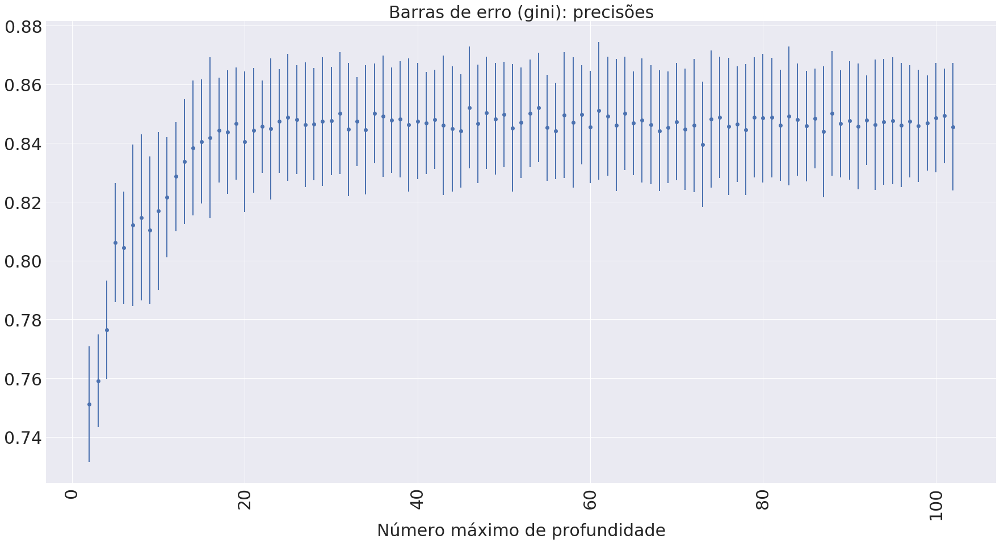

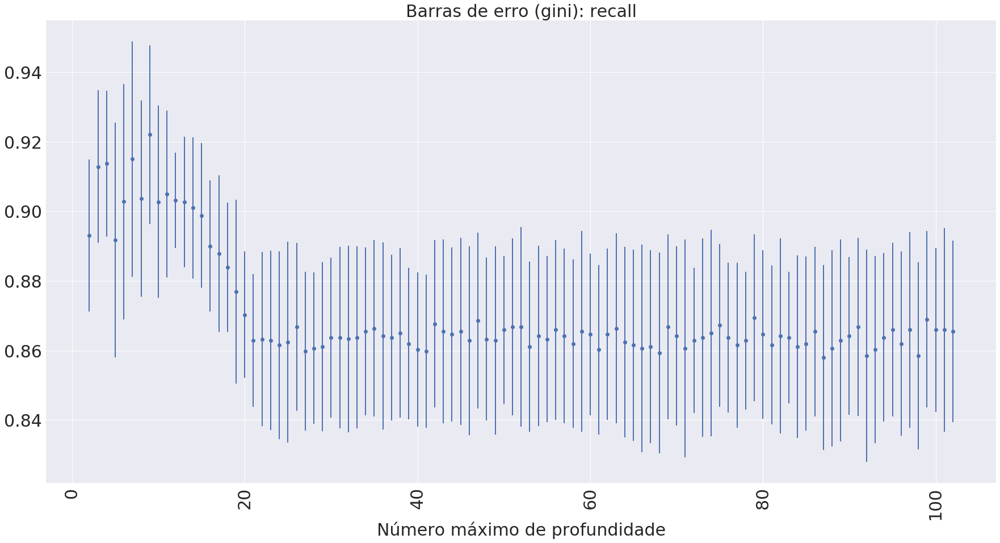

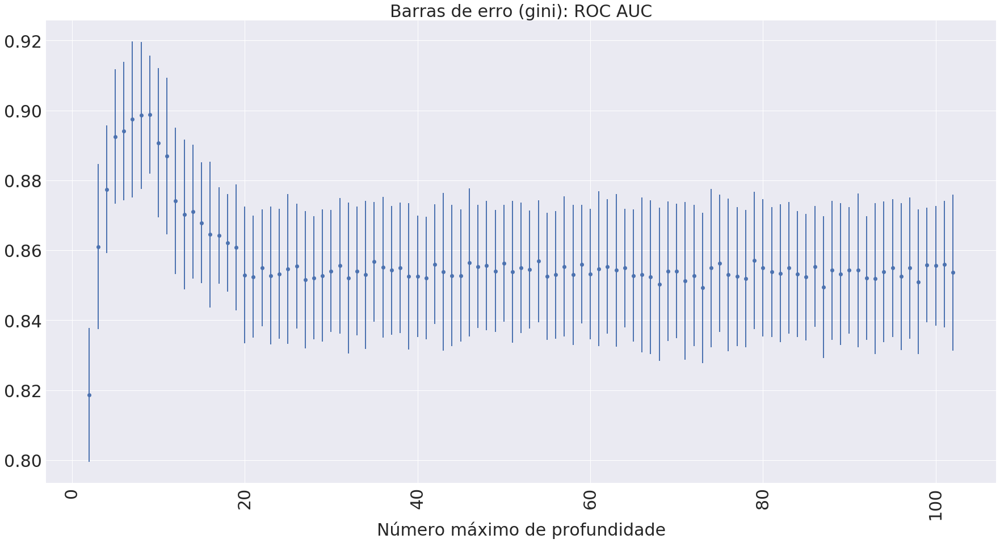

In [30]:
path_arquivos = 'Classificadores/Arvores-decisao/'

clf_balanceado = joblib.load(path_arquivos+'arvores-abordagem-3-balanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl')

results = pd.DataFrame(clf_balanceado.cv_results_)
# results['param_criterion'].head()
results.sort_values(by=['param_criterion','param_max_depth'], axis=0, inplace=True)
# results['param_criterion'].head()
results_test = results.loc[:, 'split0_test_accuracy':'split9_train_roc_auc']
results_train = results_test.filter(regex=(".*train.*"))
results_test.drop(columns=results_train.columns,inplace=True)

# for col in results.columns:
#     print(col)

lista_metricas = [('accuracy', 'acurácias'), ('average_precision', 'PRC AUC'), ('f1', 'F1 score'), ('precision', 'precisões'), ('recall', 'recall'), ('roc_auc', 'ROC AUC')]

# Plot das barras de erro

n_max_depths = np.arange(min_max_depth_parameter,max_max_depth_parameter+1) 

for criterio in ['entropia','gini']:
    
    if criterio == 'entropia':
        range_cols = list(range(0,int(results_test.shape[0]/2)))
    elif criterio == 'gini':
        range_cols = list(range(int(results_test.shape[0]/2),results_test.shape[0]))

    for metrica in lista_metricas:

        results_test_filtered = results_test.filter(regex='.*_test_'+str(metrica[0])).transpose()
        
        results_test_filtered = results_test_filtered.iloc[:, range_cols]

        fig = plt.figure(figsize=(30,15))

        plt.errorbar(n_max_depths, results_test_filtered.mean(), yerr=results_test_filtered.std(), fmt='o', lw=2)
        plt.title('Barras de erro (' + criterio + '): ' + metrica[1], fontsize=30)
        plt.xlabel('Número máximo de profundidade', fontsize=30)
        plt.xticks(fontsize=30, rotation=90)
        plt.yticks(fontsize=30)
        plt.show()

# Boxplots

# for criterio in ['entropia','gini']:
    
#     if criterio == 'entropia':
#         range_cols = list(range(0,int(results_test.shape[0]/2)))
#     elif criterio == 'gini':
#         range_cols = list(range(int(results_test.shape[0]/2),results_test.shape[0]))

#     for metrica in lista_metricas:

#         results_test_filtered = results_test.filter(regex='.*_test_'+str(metrica[0])).transpose()
        
#         results_test_filtered = results_test_filtered.iloc[:, range_cols]

#         fig = plt.figure(figsize=(30,15))
        
#         results_test_filtered.boxplot()
        
#         plt.title('Boxplot (' + criterio + '): ' + metrica[1], fontsize=30)
#         plt.xticks(np.arange(1, len(n_max_depths)+1), np.arange(min_max_depth_parameter,max_max_depth_parameter+1),
#                    fontsize=20, rotation=90)
#         plt.xlabel('Número máximo de profundidade', fontsize=30)
#         plt.yticks(fontsize=30)
#         plt.show()

In [31]:
# Treinando a árvore final

path_arquivos = 'Classificadores/Arvores-decisao/'

dt_final_balanceado = DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=8)
dt_final_balanceado.fit(train_data_b_3, train_target_b_3)
joblib.dump(dt_final_balanceado, 
            path_arquivos+'arvore-final-abordagem-3-balanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl') # Salvando a árvore final

['Classificadores/Arvores-decisao/arvore-final-abordagem-3-balanceado-dataset-10pct.pkl']

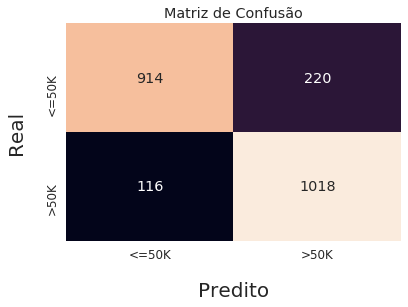

Acurácia: 85.185 %
Precisão: 82.229 %
Recall: 89.771 %
ROC AUC: 85.185 %
PRC AUC: 78.933 %


In [32]:
dt_final_balanceado = joblib.load(path_arquivos+'arvore-final-abordagem-3-balanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl')

exibir_resultados_finais(clf=dt_final_balanceado, 
                         test_data=test_data_b_1, 
                         test_target=test_target_b_1, 
                         id_abordagem=3, 
                         str_balanceamento='balanceado', 
                         fracao_dataset=0.1,
                         path_arquivos=path_arquivos,
                         tipo_classificador='arvore')

In [33]:
# # Classificando o conjunto de teste

# predicoes = dt_final_balanceado.predict(test_data_b_3)

# # Salvando a árvore treinada graficamente

# path_arquivos = 'Classificadores/Arvores-decisao/'

# export_graphviz(dt_final_balanceado, 
#                 out_file=path_arquivos+'arvore-final-abordagem-3-balanceado-dataset-'+str(int(fracao_dataset*100))+'pct.dot', 
#                 feature_names=test_data_b_3.columns,  
#                 class_names=['Less than or equal to', 'More than'],  
#                 filled=True, rounded=True,  
#                 special_characters=True)  

# # Avaliando o desempenho

# # Matriz de confusão

# cfs_mtx = confusion_matrix(test_target_b_3, predicoes)

# sns.set(font_scale=1.2)
# ax = sns.heatmap(cfs_mtx, 
#                  xticklabels=['<=50K', '>50K'], 
#                  yticklabels=['<=50K', '>50K'], 
#                  annot=cfs_mtx,
#                  fmt='d',
#                  cbar=None)

# ax.set_xlabel('Predito', labelpad=20, fontsize=20)
# ax.set_ylabel('Real', labelpad=20, fontsize=20)
# ax.set_title('Matriz de Confusão')
    
# # plot_confusion_matrix(cfs_mtx, ['<=50K', '>50K'], normalize=False)
# plt.show()

# acc = accuracy_score(test_target_b_3, predicoes)
# pre = precision_score(test_target_b_3, predicoes)
# rec = recall_score(test_target_b_3, predicoes)
# roc_auc = roc_auc_score(test_target_b_3, predicoes)
# prc_auc = average_precision_score(test_target_b_3, predicoes)

# print('Acurácia: %.3f %%' % (acc*100))
# print('Precisão: %.3f %%' % (pre*100))
# print('Recall: %.3f %%' % (rec*100))
# print('ROC AUC: %.3f %%' % (roc_auc*100))
# print('PRC AUC: %.3f %%' % (prc_auc*100))

In [34]:
# Descomentar somente se for necessário retreinar a árvore

# Abordagem 4: Retirar os valores faltantes e retirar outliers

path_arquivos = 'Classificadores/Arvores-decisao/'

clf.fit(pd.get_dummies(train_data_4), train_target_4) # Classes desbalanceadas
joblib.dump(clf, 
            path_arquivos+'arvores-abordagem-4-desbalanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl') # Salvando os resultados da validação cruzada

clf.fit(train_data_b_4, train_target_b_4) # Classes balanceadas
joblib.dump(clf, 
            path_arquivos+'arvores-abordagem-4-balanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl') # Salvando os resultados da validação cruzada


# clf_desbalanceado.fit(pd.get_dummies(train_data_1), train_target_1)
# clf_balanceado.fit(pd.get_dummies(train_data_1), train_target_1)

# Salvando os resultados da validação cruzada

# path_arquivos = 'Classificadores/Arvores-decisao/'

# joblib.dump(clf_desbalanceado, path_arquivos+'arvores-abordagem-1-desbalanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl')
# joblib.dump(clf_balanceado, path_arquivos+'arvores-abordagem-1-balanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl')

['Classificadores/Arvores-decisao/arvores-abordagem-4-balanceado-dataset-10pct.pkl']

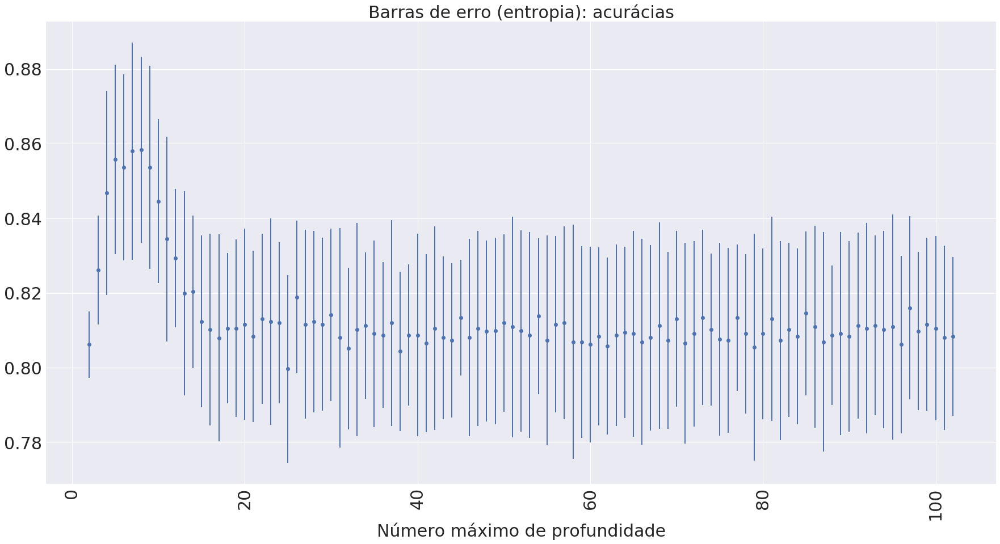

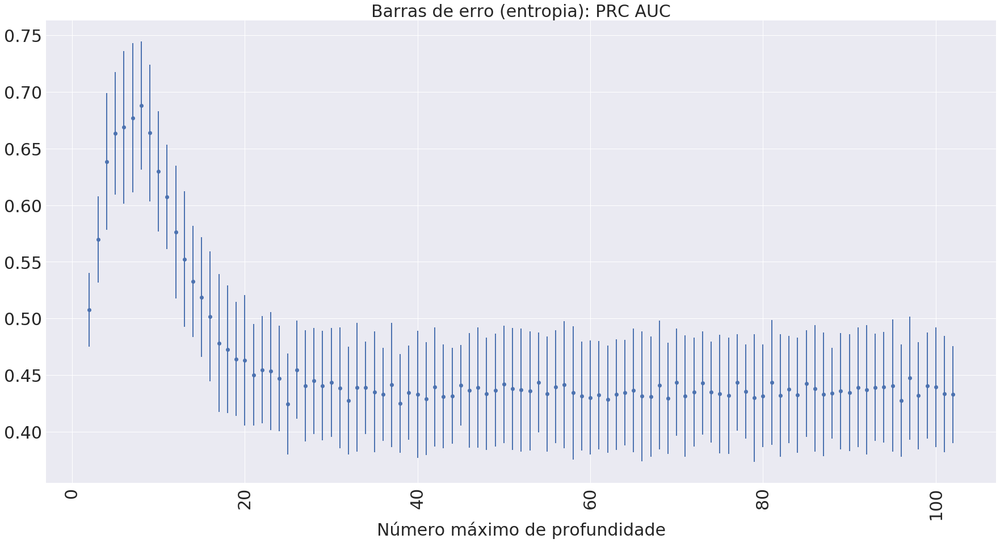

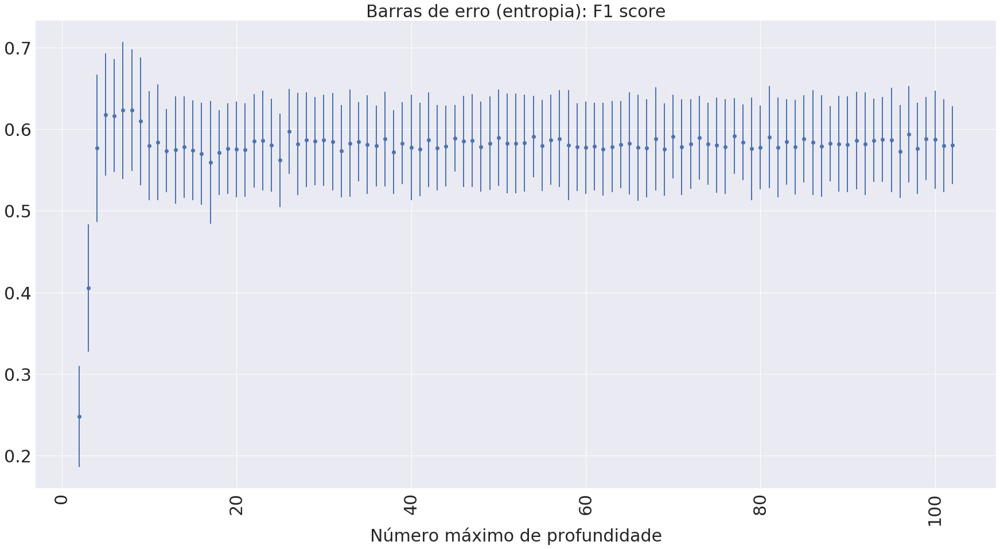

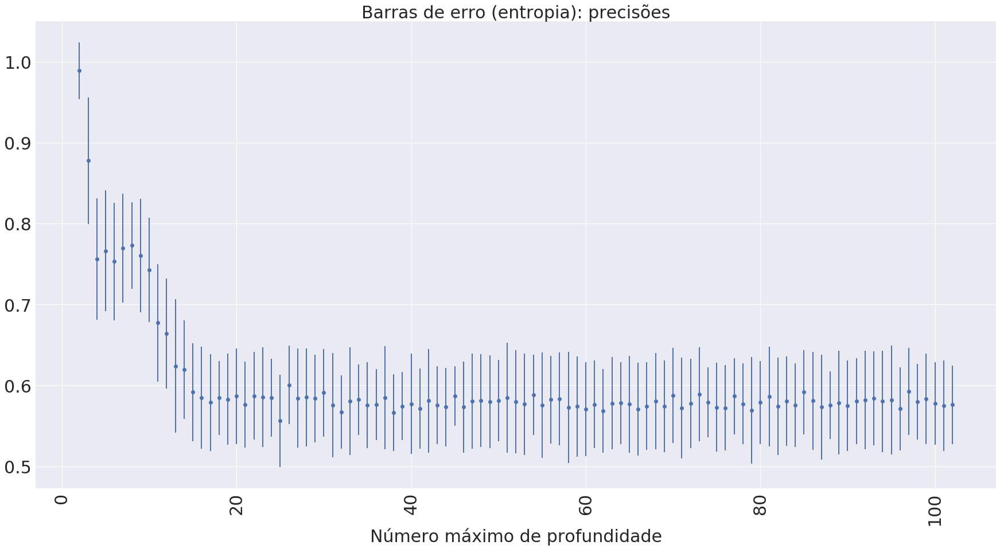

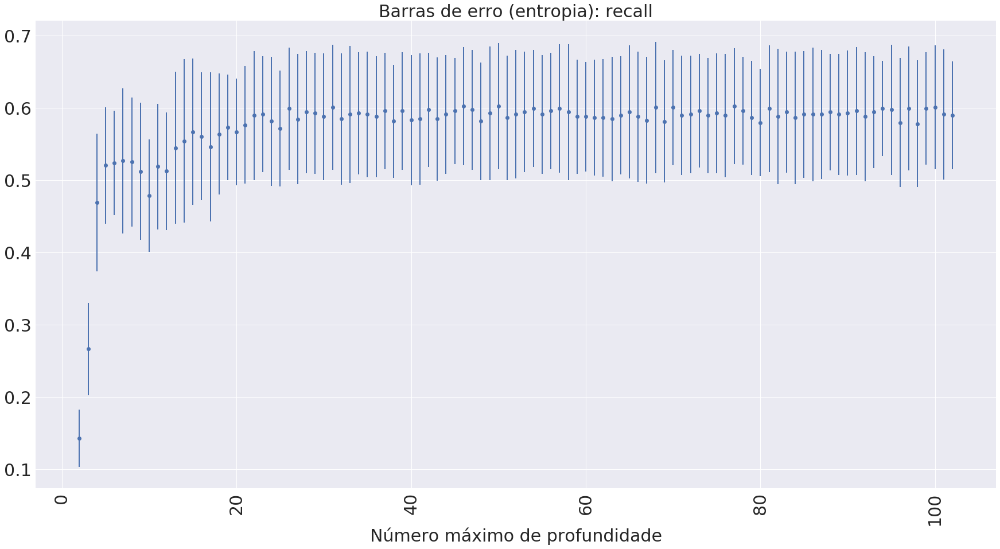

...

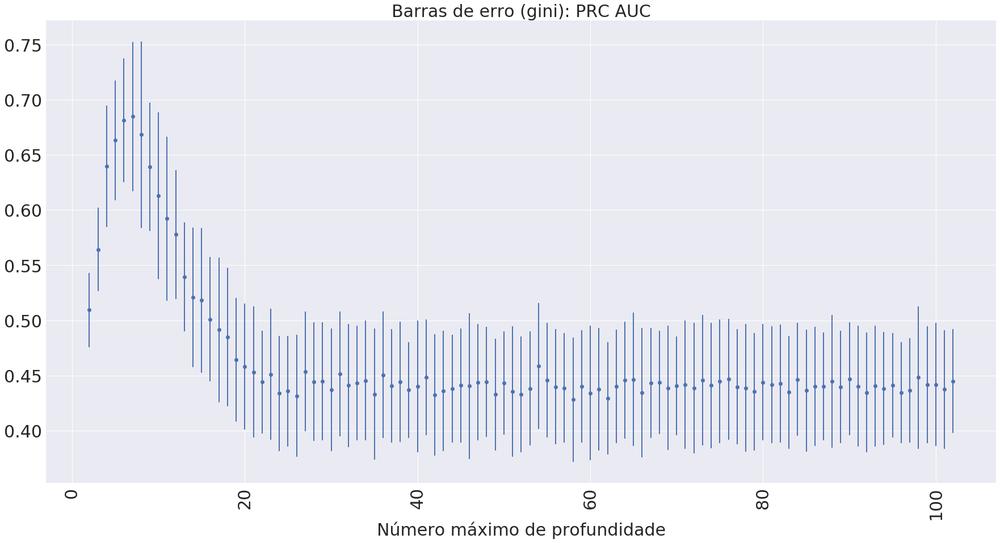

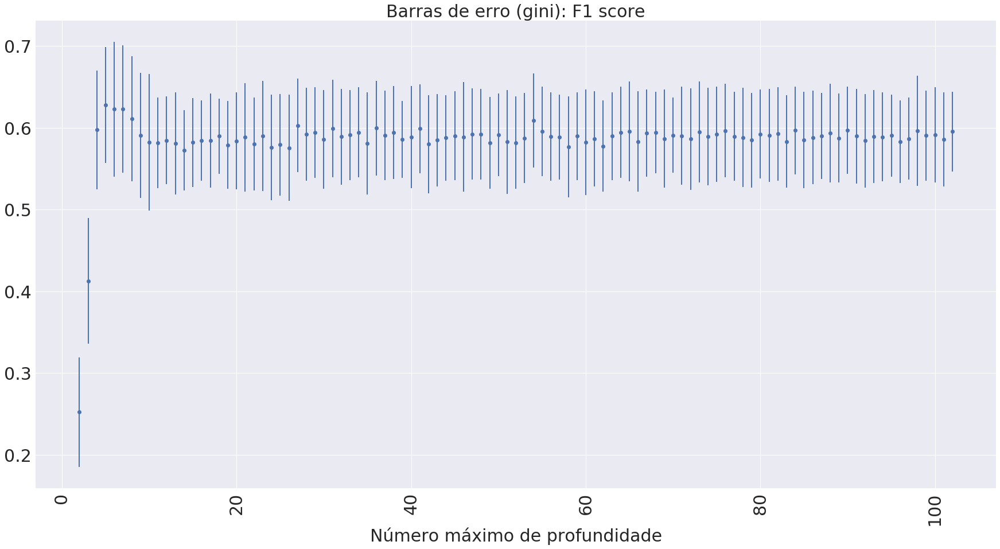

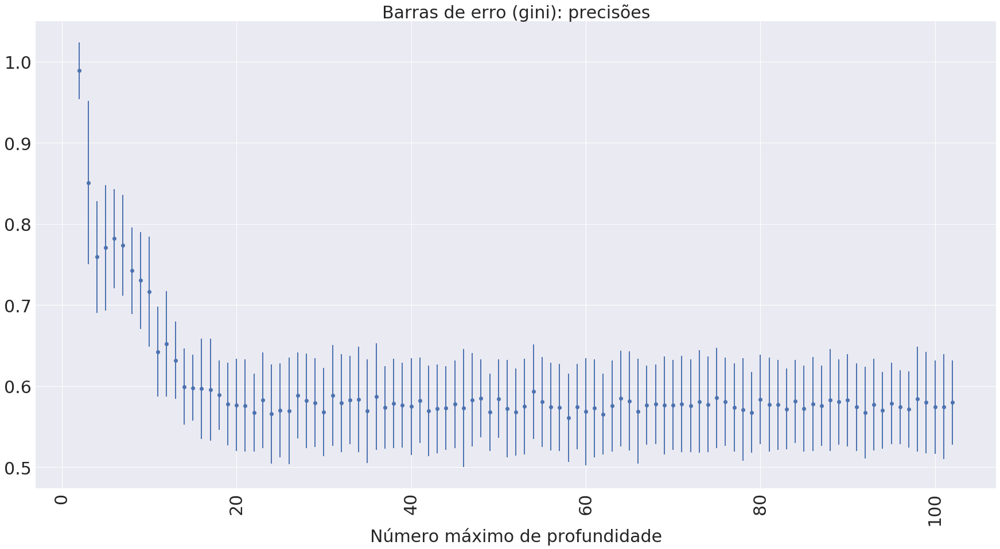

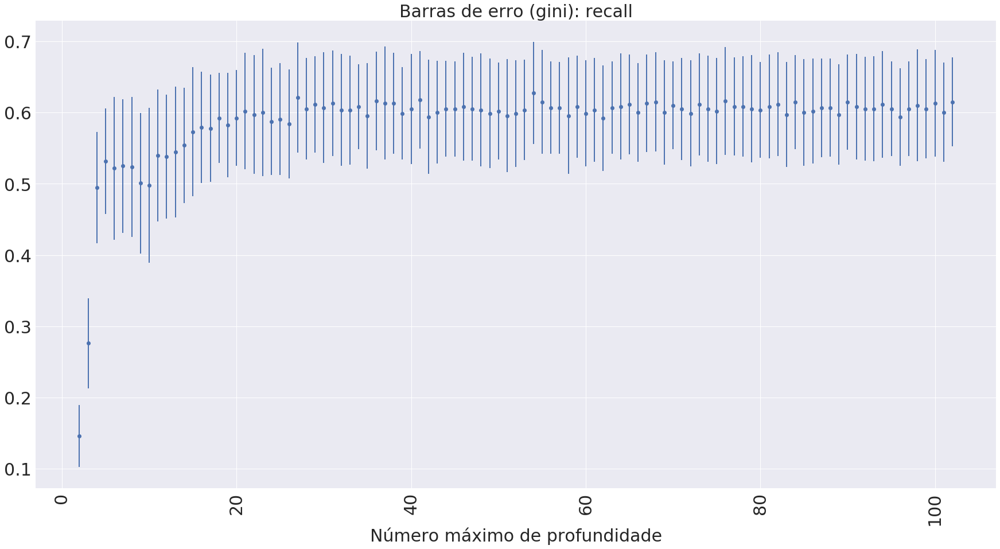

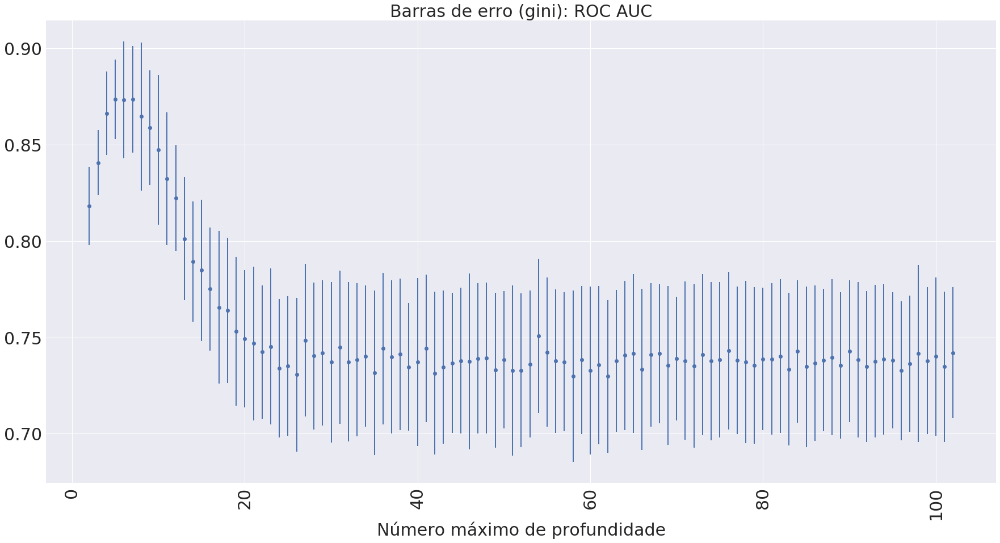

In [35]:
path_arquivos = 'Classificadores/Arvores-decisao/'

clf_desbalanceado = joblib.load(path_arquivos+'arvores-abordagem-4-desbalanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl')

results = pd.DataFrame(clf_desbalanceado.cv_results_)
# results['param_criterion'].head()
results.sort_values(by=['param_criterion','param_max_depth'], axis=0, inplace=True)
# results['param_criterion'].head()
results_test = results.loc[:, 'split0_test_accuracy':'split9_train_roc_auc']
results_train = results_test.filter(regex=(".*train.*"))
results_test.drop(columns=results_train.columns,inplace=True)

# for col in results.columns:
#     print(col)

lista_metricas = [('accuracy', 'acurácias'), ('average_precision', 'PRC AUC'), ('f1', 'F1 score'), ('precision', 'precisões'), ('recall', 'recall'), ('roc_auc', 'ROC AUC')]

# Plot das barras de erro

n_max_depths = np.arange(min_max_depth_parameter,max_max_depth_parameter+1) 

for criterio in ['entropia','gini']:
    
    if criterio == 'entropia':
        range_cols = list(range(0,int(results_test.shape[0]/2)))
    elif criterio == 'gini':
        range_cols = list(range(int(results_test.shape[0]/2),results_test.shape[0]))

    for metrica in lista_metricas:

        results_test_filtered = results_test.filter(regex='.*_test_'+str(metrica[0])).transpose()
        
        results_test_filtered = results_test_filtered.iloc[:, range_cols]

        fig = plt.figure(figsize=(30,15))

        plt.errorbar(n_max_depths, results_test_filtered.mean(), yerr=results_test_filtered.std(), fmt='o', lw=2)
        plt.title('Barras de erro (' + criterio + '): ' + metrica[1], fontsize=30)
        plt.xlabel('Número máximo de profundidade', fontsize=30)
        plt.xticks(fontsize=30, rotation=90)
        plt.yticks(fontsize=30)
        plt.show()

# Boxplots

# for criterio in ['entropia','gini']:
    
#     if criterio == 'entropia':
#         range_cols = list(range(0,int(results_test.shape[0]/2)))
#     elif criterio == 'gini':
#         range_cols = list(range(int(results_test.shape[0]/2),results_test.shape[0]))

#     for metrica in lista_metricas:

#         results_test_filtered = results_test.filter(regex='.*_test_'+str(metrica[0])).transpose()
        
#         results_test_filtered = results_test_filtered.iloc[:, range_cols]

#         fig = plt.figure(figsize=(30,15))
        
#         results_test_filtered.boxplot()
        
#         plt.title('Boxplot (' + criterio + '): ' + metrica[1], fontsize=30)
#         plt.xticks(np.arange(1, len(n_max_depths)+1), np.arange(min_max_depth_parameter,max_max_depth_parameter+1),
#                    fontsize=20, rotation=90)
#         plt.xlabel('Número máximo de profundidade', fontsize=30)
#         plt.yticks(fontsize=30)
#         plt.show()

In [36]:
# Treinando a árvore final

path_arquivos = 'Classificadores/Arvores-decisao/'

dt_final_desbalanceado = DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=8)
dt_final_desbalanceado.fit(pd.get_dummies(train_data_4), train_target_4)
joblib.dump(dt_final_desbalanceado, 
            path_arquivos+'arvore-final-abordagem-4-desbalanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl') # Salvando a árvore final

['Classificadores/Arvores-decisao/arvore-final-abordagem-4-desbalanceado-dataset-10pct.pkl']

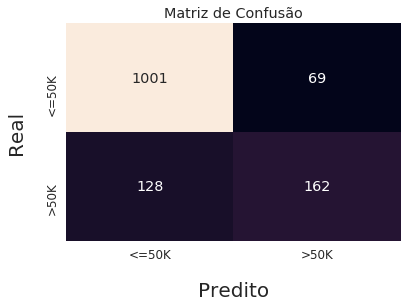

Acurácia: 85.515 %
Precisão: 70.130 %
Recall: 55.862 %
ROC AUC: 74.707 %
PRC AUC: 48.588 %


In [37]:
dt_final_desbalanceado = joblib.load(path_arquivos+'arvore-final-abordagem-4-desbalanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl')

exibir_resultados_finais(clf=dt_final_desbalanceado, 
                         test_data=pd.get_dummies(test_data_4), 
                         test_target=test_target_4, 
                         id_abordagem=4, 
                         str_balanceamento='desbalanceado', 
                         fracao_dataset=0.1,
                         path_arquivos=path_arquivos,
                         tipo_classificador='arvore')

In [38]:
# # Classificando o conjunto de teste

# predicoes = dt_final_desbalanceado.predict(pd.get_dummies(test_data_4))

# # Salvando a árvore treinada graficamente

# path_arquivos = 'Classificadores/Arvores-decisao/'

# export_graphviz(dt_final_desbalanceado, 
#                 out_file=path_arquivos+'arvore-final-abordagem-4-desbalanceado-dataset-'+str(int(fracao_dataset*100))+'pct.dot', 
#                 feature_names=pd.get_dummies(test_data_4).columns,  
#                 class_names=['Less than or equal to', 'More than'],  
#                 filled=True, rounded=True,  
#                 special_characters=True)  

# # Avaliando o desempenho

# # Matriz de confusão

# cfs_mtx = confusion_matrix(test_target_4, predicoes)

# sns.set(font_scale=1.2)
# ax = sns.heatmap(cfs_mtx, 
#                  xticklabels=['<=50K', '>50K'], 
#                  yticklabels=['<=50K', '>50K'], 
#                  annot=cfs_mtx,
#                  fmt='d',
#                  cbar=None)

# ax.set_xlabel('Predito', labelpad=20, fontsize=20)
# ax.set_ylabel('Real', labelpad=20, fontsize=20)
# ax.set_title('Matriz de Confusão')
    
# # plot_confusion_matrix(cfs_mtx, ['<=50K', '>50K'], normalize=False)
# plt.show()

# acc = accuracy_score(test_target_4, predicoes)
# pre = precision_score(test_target_4, predicoes)
# rec = recall_score(test_target_4, predicoes)
# roc_auc = roc_auc_score(test_target_4, predicoes)
# prc_auc = average_precision_score(test_target_4, predicoes)

# print('Acurácia: %.3f %%' % (acc*100))
# print('Precisão: %.3f %%' % (pre*100))
# print('Recall: %.3f %%' % (rec*100))
# print('ROC AUC: %.3f %%' % (roc_auc*100))
# print('PRC AUC: %.3f %%' % (prc_auc*100))

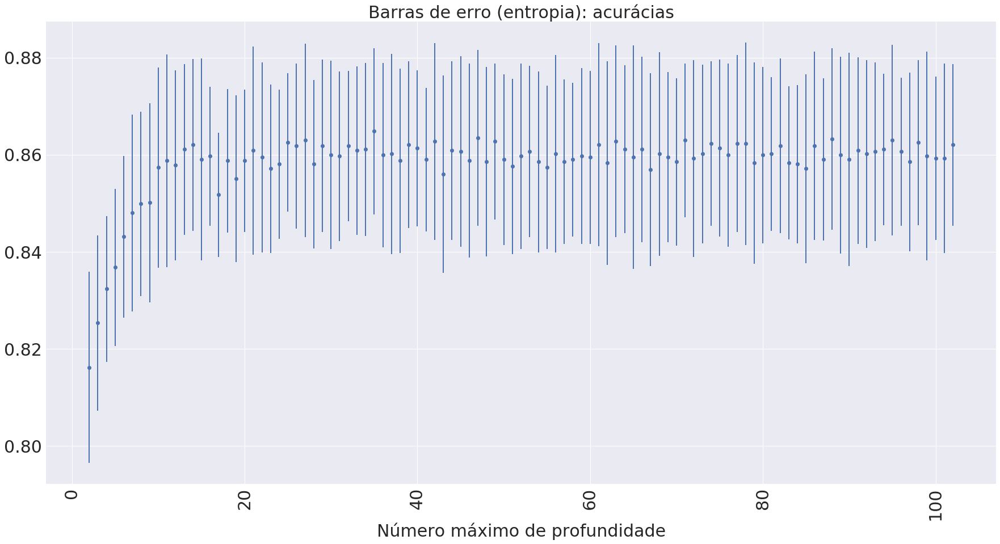

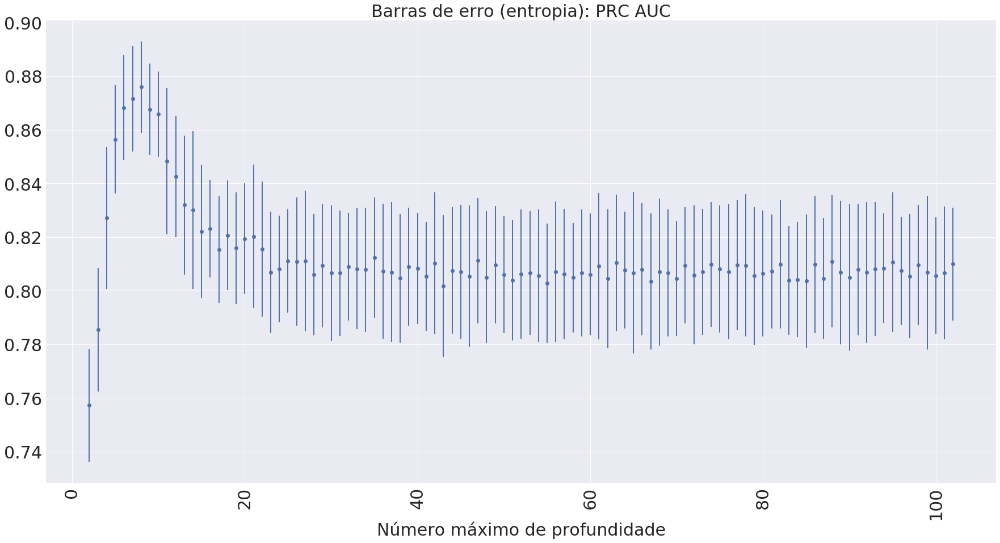

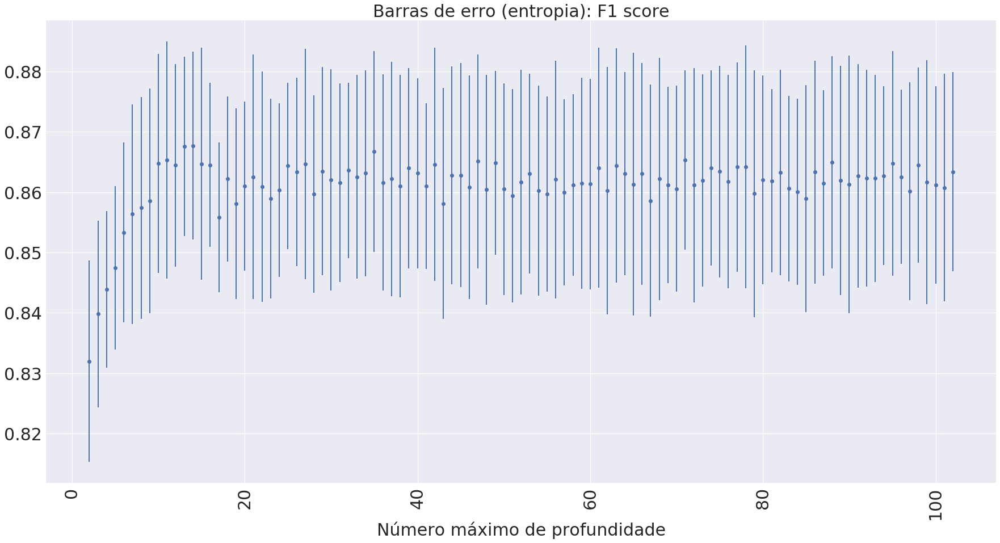

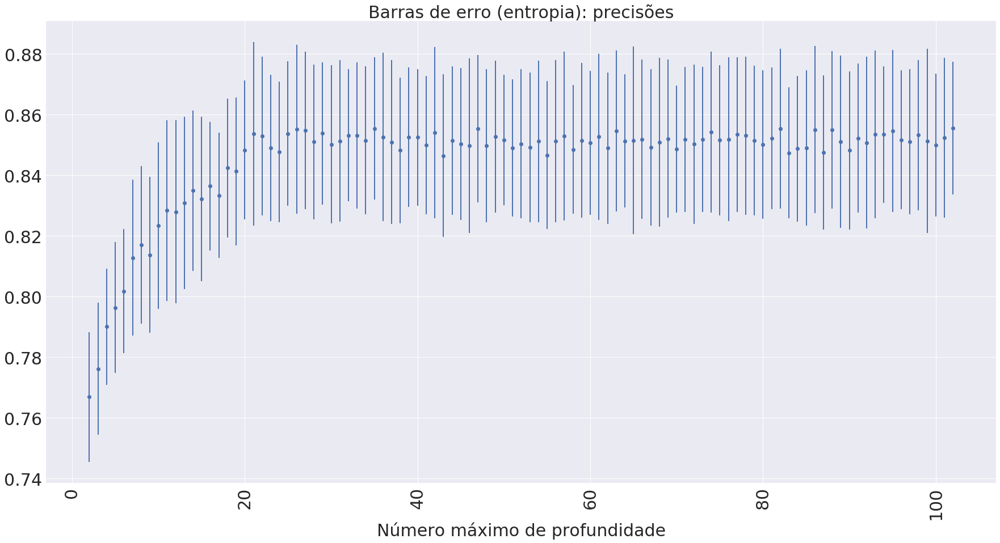

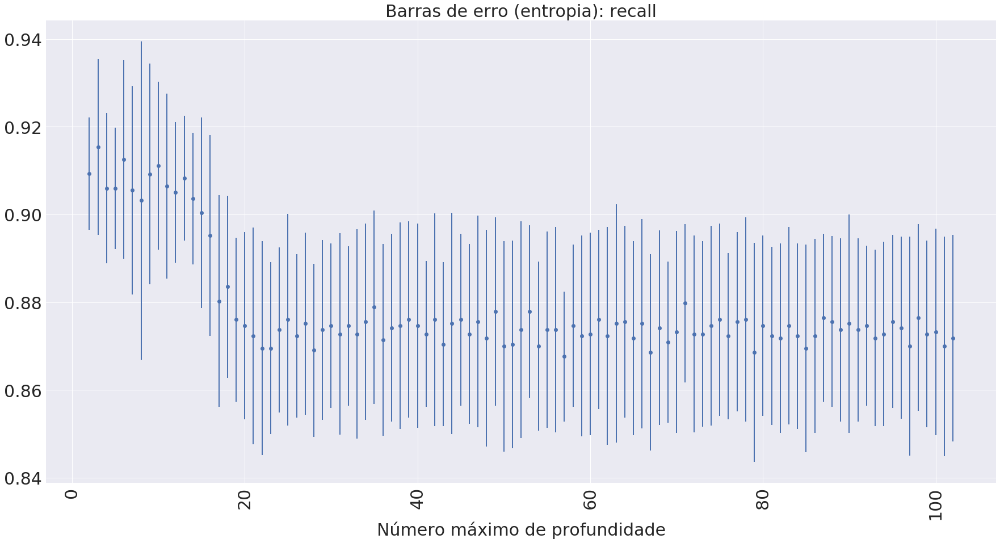

...

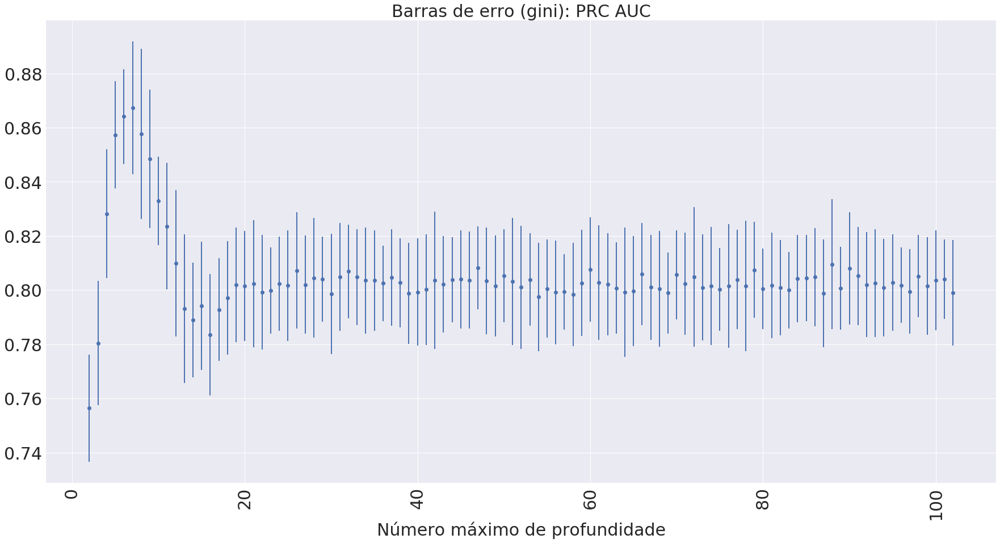

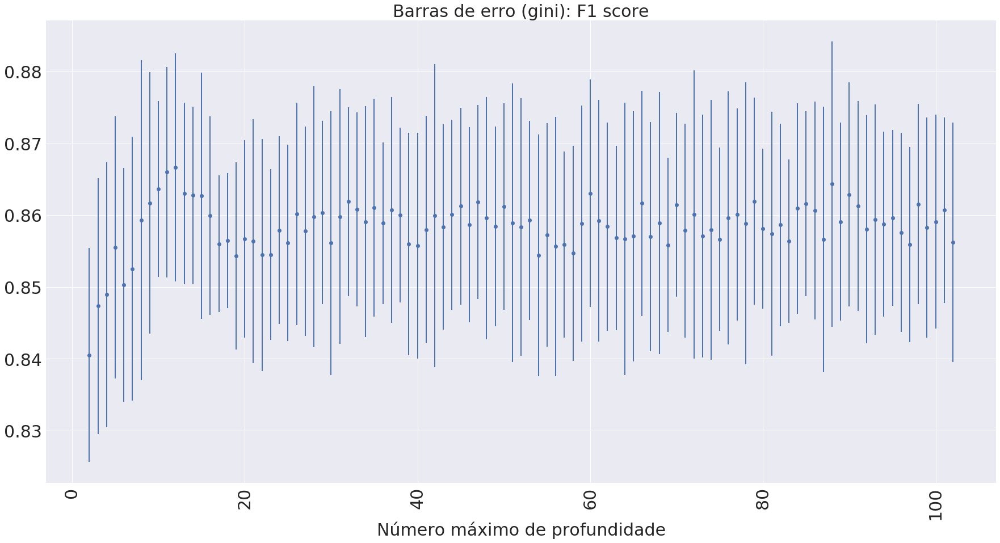

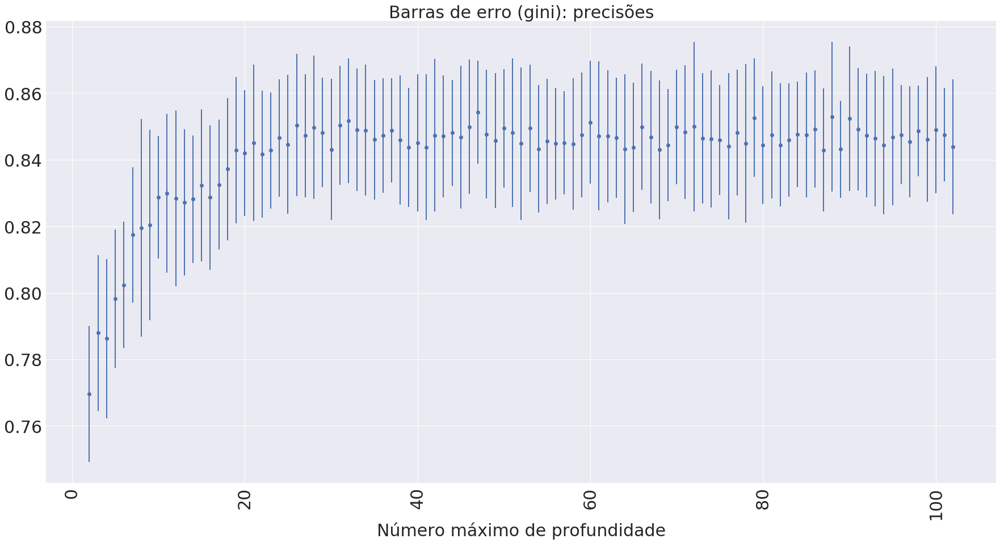

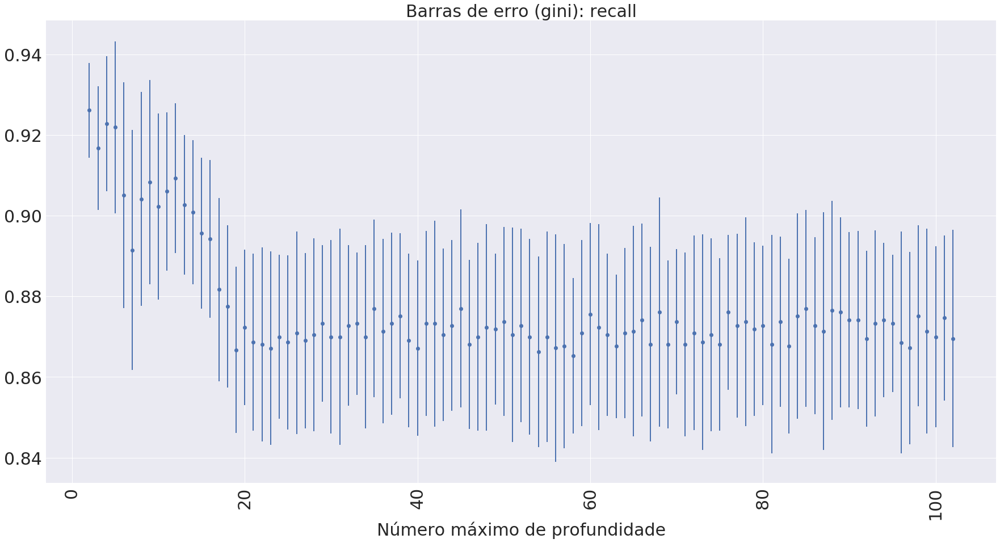

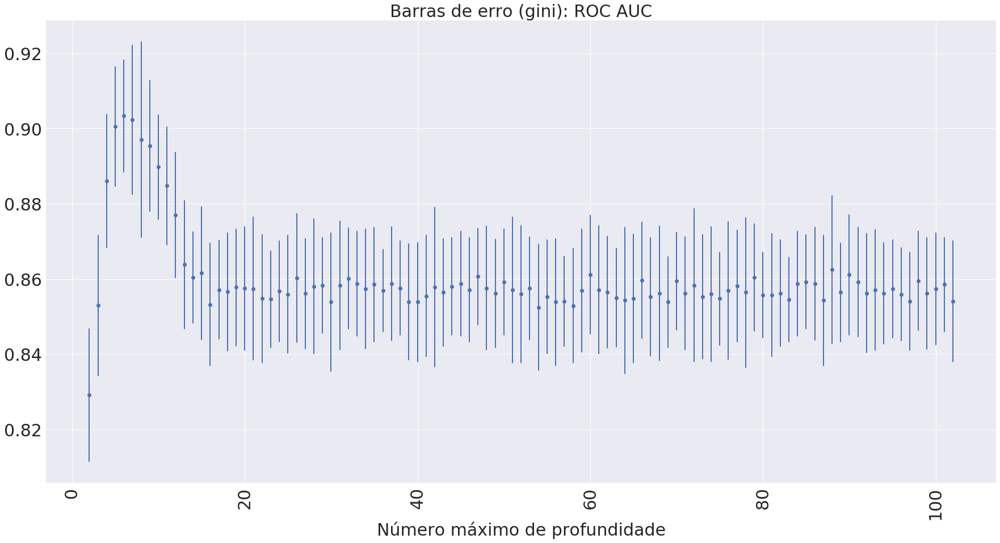

In [39]:
path_arquivos = 'Classificadores/Arvores-decisao/'

clf_balanceado = joblib.load(path_arquivos+'arvores-abordagem-4-balanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl')

results = pd.DataFrame(clf_balanceado.cv_results_)
# results['param_criterion'].head()
results.sort_values(by=['param_criterion','param_max_depth'], axis=0, inplace=True)
# results['param_criterion'].head()
results_test = results.loc[:, 'split0_test_accuracy':'split9_train_roc_auc']
results_train = results_test.filter(regex=(".*train.*"))
results_test.drop(columns=results_train.columns,inplace=True)

# for col in results.columns:
#     print(col)

lista_metricas = [('accuracy', 'acurácias'), ('average_precision', 'PRC AUC'), ('f1', 'F1 score'), ('precision', 'precisões'), ('recall', 'recall'), ('roc_auc', 'ROC AUC')]

# Plot das barras de erro

n_max_depths = np.arange(min_max_depth_parameter,max_max_depth_parameter+1) 

for criterio in ['entropia','gini']:
    
    if criterio == 'entropia':
        range_cols = list(range(0,int(results_test.shape[0]/2)))
    elif criterio == 'gini':
        range_cols = list(range(int(results_test.shape[0]/2),results_test.shape[0]))

    for metrica in lista_metricas:

        results_test_filtered = results_test.filter(regex='.*_test_'+str(metrica[0])).transpose()
        
        results_test_filtered = results_test_filtered.iloc[:, range_cols]

        fig = plt.figure(figsize=(30,15))

        plt.errorbar(n_max_depths, results_test_filtered.mean(), yerr=results_test_filtered.std(), fmt='o', lw=2)
        plt.title('Barras de erro (' + criterio + '): ' + metrica[1], fontsize=30)
        plt.xlabel('Número máximo de profundidade', fontsize=30)
        plt.xticks(fontsize=30, rotation=90)
        plt.yticks(fontsize=30)
        plt.show()

# Boxplots

# for criterio in ['entropia','gini']:
    
#     if criterio == 'entropia':
#         range_cols = list(range(0,int(results_test.shape[0]/2)))
#     elif criterio == 'gini':
#         range_cols = list(range(int(results_test.shape[0]/2),results_test.shape[0]))

#     for metrica in lista_metricas:

#         results_test_filtered = results_test.filter(regex='.*_test_'+str(metrica[0])).transpose()
        
#         results_test_filtered = results_test_filtered.iloc[:, range_cols]

#         fig = plt.figure(figsize=(30,15))
        
#         results_test_filtered.boxplot()
        
#         plt.title('Boxplot (' + criterio + '): ' + metrica[1], fontsize=30)
#         plt.xticks(np.arange(1, len(n_max_depths)+1), np.arange(min_max_depth_parameter,max_max_depth_parameter+1),
#                    fontsize=20, rotation=90)
#         plt.xlabel('Número máximo de profundidade', fontsize=30)
#         plt.yticks(fontsize=30)
#         plt.show()

In [40]:
# Treinando a árvore final

path_arquivos = 'Classificadores/Arvores-decisao/'

dt_final_balanceado = DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=8)
dt_final_balanceado.fit(train_data_b_4, train_target_b_4)
joblib.dump(dt_final_balanceado, 
            path_arquivos+'arvore-final-abordagem-4-balanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl') # Salvando a árvore final

['Classificadores/Arvores-decisao/arvore-final-abordagem-4-balanceado-dataset-10pct.pkl']

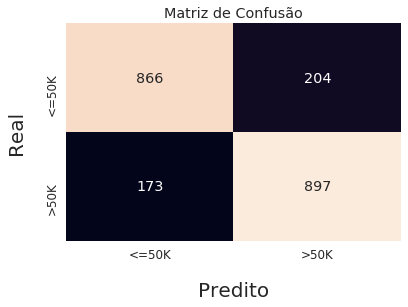

Acurácia: 82.383 %
Precisão: 81.471 %
Recall: 83.832 %
ROC AUC: 82.383 %
PRC AUC: 76.383 %


In [41]:
dt_final_balanceado = joblib.load(path_arquivos+'arvore-final-abordagem-4-balanceado-dataset-'+str(int(fracao_dataset*100))+'pct.pkl')

exibir_resultados_finais(clf=dt_final_balanceado, 
                         test_data=test_data_b_4, 
                         test_target=test_target_b_4, 
                         id_abordagem=4, 
                         str_balanceamento='balanceado', 
                         fracao_dataset=0.1,
                         path_arquivos=path_arquivos,
                         tipo_classificador='arvore')

In [42]:
# # Classificando o conjunto de teste

# predicoes = dt_final_balanceado.predict(test_data_b_4)

# # Salvando a árvore treinada graficamente

# path_arquivos = 'Classificadores/Arvores-decisao/'

# export_graphviz(dt_final_balanceado, 
#                 out_file=path_arquivos+'arvore-final-abordagem-4-balanceado-dataset-'+str(int(fracao_dataset*100))+'pct.dot', 
#                 feature_names=test_data_b_4.columns,  
#                 class_names=['Less than or equal to', 'More than'],  
#                 filled=True, rounded=True,  
#                 special_characters=True)  

# # Avaliando o desempenho

# # Matriz de confusão

# cfs_mtx = confusion_matrix(test_target_b_4, predicoes)

# sns.set(font_scale=1.2)
# ax = sns.heatmap(cfs_mtx, 
#                  xticklabels=['<=50K', '>50K'], 
#                  yticklabels=['<=50K', '>50K'], 
#                  annot=cfs_mtx,
#                  fmt='d',
#                  cbar=None)

# ax.set_xlabel('Predito', labelpad=20, fontsize=20)
# ax.set_ylabel('Real', labelpad=20, fontsize=20)
# ax.set_title('Matriz de Confusão')
    
# # plot_confusion_matrix(cfs_mtx, ['<=50K', '>50K'], normalize=False)
# plt.show()

# acc = accuracy_score(test_target_b_4, predicoes)
# pre = precision_score(test_target_b_4, predicoes)
# rec = recall_score(test_target_b_4, predicoes)
# roc_auc = roc_auc_score(test_target_b_4, predicoes)
# prc_auc = average_precision_score(test_target_b_4, predicoes)

# print('Acurácia: %.3f %%' % (acc*100))
# print('Precisão: %.3f %%' % (pre*100))
# print('Recall: %.3f %%' % (rec*100))
# print('ROC AUC: %.3f %%' % (roc_auc*100))
# print('PRC AUC: %.3f %%' % (prc_auc*100))

## Referências Bibliográficas

[1] (Online) UCI Machine Learning Repository: Census Income Dataset. Disponível em https://archive.ics.uci.edu/ml/datasets/Census+Income. Último acesso: 21/03/2018 às 00:22 horas.<br>

[2] (Online) UCI Machine Learning Repository: Census Income KDD. Disponível em https://archive.ics.uci.edu/ml/datasets/Census-Income+(KDD). Último acesso: 21/03/2018 às 01:30 horas.<br>

[3] (Online) Classifying Income data from Census 1994 Data. Disponível em https://cseweb.ucsd.edu/~jmcauley/cse190/reports/sp15/024.pdf. Último acesso: 21/03/2018 às 01:32 horas.<br>

[4] Ristanoski, Goce & Liu, Wei & Bailey, James. (2013). Discrimination aware classification for imbalanced datasets. International Conference on Information and Knowledge Management, Proceedings. 1529-1532. 10.1145/2505515.2507836.<br>

[5] Hunter, John D. "Matplotlib: A 2D graphics environment." Computing in science & engineering 9.3 (2007): 90-95.

[6] (Online) Esperança de vida. Disponível em https://pt.wikipedia.org/wiki/Esperan%C3%A7a_de_vida. Último acesso: 23/04/2018 às 16:05 horas.<br>

[7] (Online) Vital Statistics of the United States, 1994, Preprint of Volume II, Mortality, Part A, Section 6. https://www.cdc.gov/nchs/data/lifetables/life94_2.pdf. Último acesso: 23/04/2018 às 16:05 horas.<br>

[8] An Introduction to ROC Analysis, Tom Fawcett, 2005, Pattern Recognition Letters 27. Disponível em: http://people.inf.elte.hu/kiss/11dwhdm/roc.pdf<br>